In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import readdy
import math
import scipy

import pandas as pd
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
import contextlib
import io
import pickle
import torch
from botorch.models import SingleTaskGP
from botorch.models.transforms import Normalize, Standardize
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from gpytorch.likelihoods import FixedNoiseGaussianLikelihood
from botorch.acquisition import LogExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from scipy.stats import ks_2samp, wasserstein_distance

import sys
import os
sys.path.append(os.path.abspath(os.path.join('..', 'python_scripts')))

from NCG_readdy_sim_y_motif_short import Debye_length, Debye_Hueckel_pot_rep_strength ,Diff_at23C,visc_T,Diff_ES

from NCG_readdy_sim_y_motif_short import run_sim_1,tcl_file_gen,all_types, tcl_file_gen

from NCG_Bay_opt_readdy_sim_y_motif_short import run_p,run_p_dict,run_gp_11
from NCG_Bay_opt_readdy_sim_y_motif_short import gt_1_3,gt_1_1,gt_1_2,gt_1_4,apply_gp
from NCG_Bay_opt_readdy_sim_y_motif_short import gen_all_comb_from_list_of_lists_2, run_p2, get_training_angle_distr_7
from NCG_Bay_opt_readdy_sim_y_motif_short import eval_sim_1_1_la,eval_sim_1_1_hp,eval_sim_1_1_aa,eval_sim_1_1_bm,eval_sim_1_1_ba
from NCG_Bay_opt_readdy_sim_y_motif_short import cg_angle_distr_1_1_hp,cg_angle_distr_1_1_bm,cg_angle_distr_1_3_ba_aa_la,cg_angle_distr_1_1_ba,cg_angle_distr_1_1_aa 


# Optimizing parameters of coarse grained nanomotif model

# Bayesian optimization with BoTorch implementation

Mechanical properties of motifs were captured in angle distributions from oxDNA simulations at nucleotide resolution. These serve as target for parameter optimization in a coarse grained model representing 8 nucleotides as single particle.

Bayesian optimization set up as 1D+(4D&1D)+1D+1D problem


# Units and temperature

In [3]:
#Set units used in ReaDDy and simulation temperature
custom_units = {'length_unit':'nanometer',
                'time_unit': 'nanoseconds',
                'energy_unit': 'joule'}
system_temperature=273.15 + 40  #293
kbt=system_temperature*1.380649*10**-23

# Diffusion constant

In [4]:
#Diffusion constant either based on Einstein-Smoluchowski, or on exp results for oligos at 23°C
# viscositiy: https://srd.nist.gov/jpcrdreprint/1.555581.pdf
# scaling diffusion constant with T: https://en.wikipedia.org/wiki/Einstein_relation_(kinetic_theory)
# Diffusion constant DNA oligos at 23°C: https://www.sciencedirect.com/science/article/pii/S0021925818310871


#Diffusion const for BP of ds DNA (known at 23°C)
Diff_at23C_1=Diff_at23C(8)

#Viscosity water at sim temp and 23°C
visc_T_sys=visc_T(system_temperature)
visc_T_23=visc_T(273.15+23)

#rescale diffusion const to sim temperature and viscosity (assume scaling like Einstein-Smoluchowski D= kb*T/(6*pi*r*visc) )
Diff_sys_temp=Diff_at23C_1*system_temperature/(23+273.15)  *visc_T_23/visc_T_sys

#use Einstein-Smoluchowski for sphere
Diff_sys_temp_ES=Diff_ES(T=system_temperature,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9
Diff_T_23_ES=Diff_ES(T=23+273.15,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9


print("D for 8bp at 23°C /",23+273.15,"K =",Diff_at23C_1,"nm^2/ns") 
print("D for sphere with r=2.72/2 nm at 23°C /",23+273.15,"K =", Diff_T_23_ES,"nm^2/ns")
print("############################################")
print("mu at",system_temperature-273.15,"°C /", system_temperature,"K =",visc_T_sys," Pa*s" )
print("mu at","23°C /", 23+273.15,"K =" ,visc_T_23," Pa*s" )
print("############################################")
print("D for 8bp at",system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp,"nm^2/ns")
print("D for sphere with r=2.72/2 nm at" ,system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp_ES,"nm^2/ns")


D for 8bp at 23°C / 296.15 K = 0.10964057118867664 nm^2/ns
D for sphere with r=2.72/2 nm at 23°C / 296.15 K = 0.2443607133764822 nm^2/ns
############################################
mu at 40.0 °C / 313.15 K = 0.0006527150159023826  Pa*s
mu at 23°C / 296.15 K = 0.0009322679783769826  Pa*s
############################################
D for 8bp at 40.0 °C / 313.15 K = 0.16558810339120872 nm^2/ns
D for sphere with r=2.72/2 nm at 40.0 °C / 313.15 K = 0.25838783519785724 nm^2/ns


# Fixed model Parameters

In [5]:
###################
#fixed params:
###################

#bond potential
k_bond_ds=2*10**-19
k_bond_ss=1*10**-19

#bond eq. distance
eq_dist_bb=2.72 

#bond eq. distance fused sticky-ends
eq_dist_fused_bb=2/3 *2.72
eq_dist_bb_s=2/3 *2.72 # distance arm-stickyend

#bond potential surf
k_angle_ss_surf=2e-20  #2.8666666666666663e-20     #2*10**-21
k_angle_ds_surf=3.6666666666666664e-20     #2*10**-20

#angle between monomers V=k*(theta-theta_0)^2
theta_0=np.pi
theta_90=np.pi/2

theta_60=np.pi *1/3
theta_120=np.pi * 2/3
theta_270=np.pi * 3/2
theta_base_y=np.pi*2/3

#volume exclusion
#har rep
k_ex_ds_ds=2*10**-20  *5
k_ex_ss_ds=8*10**-21  *5
k_ex_ss_ss=4*10**-21  *5
dist_ex=1.5          *1 

#DH
c_NaCl = 700 # NaCl concentration in milli mol/L
L_1=6.022*10**23 *c_NaCl * (1.602*10**-19)**2 

charge_eff=0.815 #https://pubs.aip.org/aip/jcp/article/142/23/234901/193554/Introducing-improved-structural-properties-and
DH_len=Debye_length(L=L_1,T=system_temperature) *10**9 #for nm
DH_strength_ds_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*16,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ss=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*8,T=system_temperature)*10**9 #for nm
DH_cutoff=DH_len*4

volume_excl_type="DH"

print("Debye length at",c_NaCl,"mM NaCl:", DH_len, "nm", "cutoff at", DH_cutoff, "nm")
print("DH pot strength ds-ds:", DH_strength_ds_ds, "J*nm")
print("DH pot strength ss-ds:", DH_strength_ss_ds, "J*nm")
print("DH pot strength ss-ss:", DH_strength_ss_ss, "J*nm")
print("Energy of rep. ds-ds at 1 nm:",DH_strength_ds_ds/1 *np.exp(-1/DH_len),"J" )
#DH_strength_ds_ds=DH_strength_ds_ds
#DH_strength_ss_ds=DH_strength_ss_ds
#DH_strength_ss_ss=DH_strength_ss_ss
#DH_cutoff=DH_cutoff

#probabilities bound/unbound
p_SE_fused_x=99.8
p_SE_fused_ortho_x=99.8

p_SE_HP_x=83.8
p_SE_HP_ortho_x=59.9

p_surf_HP_x=6.6
p_surf_HP_ortho_x=6.6

#binding/unbinding rates
#rate of selecting fission reaction in sim
k_fiss_rate_sel=10**7
#y motif
k_b_y_1=0.05      #0.05
k_ub_y_1=0        #0.001

#y motif hp
k_b_y_hp_1=0
k_ub_y_hp_1=0

#############

#x motif 1
k_b_x_1=0     #0.05
k_ub_x_1=0    #k_b_x_1 * (100-p_SE_fused_x)/p_SE_fused_x  #0.001

#x motif 1 surface
k_b_x_surf_1=k_b_x_1 
k_ub_x_surf_1=k_ub_x_1

#x motif 1 hp
k_b_x_hp_1=0      #0.005
k_ub_x_hp_1=0      #k_b_x_hp_1 * (100-p_SE_HP_x)/p_SE_HP_x 

#x motif 1 surf hp
k_b_x_surf_hp_1=0     #0.005
k_ub_x_surf_hp_1=0     #k_b_x_surf_hp_1 * (100-p_surf_HP_x)/p_surf_HP_x

############

#x motif 2
k_b_x_2=0
k_ub_x_2=0

#x motif 2 surface
k_b_x_surf_2=0 
k_ub_x_surf_2=0

#x motif 2 hp
k_b_x_hp_2=0
k_ub_x_hp_2=0

#x motif 2 surf hp
k_b_x_surf_hp_2=0
k_ub_x_surf_hp_2=0



#time step
t_step=10*10**-3  #standard: 10*10**-3 #appears to work with up to 25*10**-3

#reaction scale
rea_s=2.7 #2.7


Debye length at 700 mM NaCl: 0.3597519749615454 nm cutoff at 1.4390078998461815 nm
DH pot strength ds-ds: 5.362923735100154e-19 J*nm
DH pot strength ss-ds: 2.681461867550077e-19 J*nm
DH pot strength ss-ss: 1.3407309337750386e-19 J*nm
Energy of rep. ds-ds at 1 nm: 3.328099837257297e-20 J


# General simulation parameters

In [6]:
#general simulation parameters
system_temperature=system_temperature
box_size=[40,40,40] #[60,60,60]  #[20,20,20]
custom_units=custom_units
periodic_bc_x=False
periodic_bc_y=False
periodic_bc_z=False

r_sp=15 #radius of spherical inclusion pot
sp_incl_orig=[0,0,0] #origin of sperical inclusion pot
k_sp=0 #k of spherical inclusion, if zero no spherical inclusion
box_a=[-10,-10,-10] #[-7.5,-7.5,-7.5] #offset of box potential from centre
box_b=[35,35,35] #[50,50,50] #[15,15,15]    #total length of box potential
k_box=1 *10**-20 #k of box potential


#number of particles
num_y_motif_1=1
num_x_motif_1=0
num_x_motif_2=0
num_surface_1=0

#option to use HP template
use_y_1_HP_template=False
use_x_1_HP_template=False
use_x_2_HP_template=False

#positions of particles
y_motif_1_ini=[np.asarray([e]) for e in np.random.uniform(size=(num_y_motif_1,3)) * np.asarray(box_b)/5 - np.asarray(box_b)/5 * 0.5]  #[np.asarray([[0,0,0]]),np.asarray([[2,2,2]])]
y_motif_1_rot=False

x_motif_1_ini=[np.asarray([[0,0,0]])]
x_motif_1_rot=False

x_motif_2_ini=[np.asarray([[-10,0,0]])]
x_motif_2_rot=False

surf_1_ini=[np.asarray([[-40,-40,-40]])]

#time steps
t_tot=500000  #500000

#evaluate reactions


#folder
folder="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/"
name="y_test_short_1_"
add_num_1=0
     

#other options

sim_kernel="SingleCPU"
sim_threads=1
track_num_particles=["y_link_a_1","y_link_fused_a_1","y_link_b_1","y_link_fused_b_1","y_link_c_1","y_link_fused_c_1",
                     "y_link_hp_a_1", "y_link_hp_b_1", "y_link_hp_c_1",
                     
                     "x_link_a_1","x_link_fused_a_1","x_link_b_1","x_link_fused_b_1","x_link_c_1","x_link_fused_c_1",
                     "x_link_a_2","x_link_fused_a_2","x_link_b_2","x_link_fused_b_2","x_link_c_2","x_link_fused_c_2",
                     "x_link_hp_a_1", "x_link_hp_b_1", "x_link_hp_c_1",
                     "x_link_hp_a_2", "x_link_hp_b_2", "x_link_hp_c_2",
                     
                     "x_surf_link_d_1","x_surf_link_fused_d_1","x_surf_link_d_2","x_surf_link_fused_d_2",
                     "x_surf_link_hp_d_1","x_surf_link_hp_d_2"
                    ]
eval_reac=True
eval_top_reac=True

checkpoint_path=None #"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/"

new_checkpoint=None
max_n_saves=1 #max checkpoint saves
rec_stride=100 #recording stride
sim_skin=0 #1000 #simulation skin






# Variable model parameters

In [7]:
#specify which parameters are to be optimised over which range

#wide param range
k_angle_ds_base_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10) 
k_angle_ds_arm_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_oppa_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ss_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_fused_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_hp_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
theta_base_x_range=np.linspace(90 ,180 ,4)*np.pi/180 #np.linspace(40 ,120 ,10)
theta_oppa_x_range=np.linspace(135 ,180 ,4)*np.pi/180 #np.linspace(140 ,180 ,10)



#Prior to optimization, use parameter value from middle of range for unoptimized sim
k_angle_ds_base=k_angle_ds_base_range[2]
k_angle_ds_arm=k_angle_ds_arm_range[2]
k_angle_ds_oppa=k_angle_ds_oppa_range[2]
k_angle_ss_link=k_angle_ss_link_range[2]
k_angle_ds_fused_link=k_angle_ds_fused_link_range[2]
k_angle_ds_hp=k_angle_ds_hp_range[2]
theta_base_x=theta_base_x_range[2]
theta_oppa_x=theta_oppa_x_range[2]



In [8]:
#input dictionary
run_sim_1_input={"name":name,
             "folder":folder,
             "add_num_1":add_num_1,
              
             "system_temperature":system_temperature,
             "box_size":box_size,
             "custom_units":custom_units,
             "periodic_bc_x":periodic_bc_x,
             "periodic_bc_y":periodic_bc_y,
             "periodic_bc_z":periodic_bc_z,
              
             "r_sp":r_sp,
             "sp_incl_orig":sp_incl_orig,
             "k_sp":k_sp,
             "box_a":box_a,
             "box_b":box_b,
             "k_box":k_box,
    
              
             "num_y_motif_1":num_y_motif_1,
             "num_x_motif_1":num_x_motif_1,
             "num_x_motif_2":num_x_motif_2,
             "num_surface_1":num_surface_1,
             "y_motif_1_ini":y_motif_1_ini,
             "x_motif_1_ini":x_motif_1_ini,
             "x_motif_2_ini":x_motif_2_ini,
             "surf_1_ini":surf_1_ini,
             "y_motif_1_rot":y_motif_1_rot,
             "x_motif_1_rot":x_motif_1_rot,
             "x_motif_2_rot":x_motif_2_rot,
                 
             "use_y_1_HP_template":use_y_1_HP_template,
             "use_x_1_HP_template":use_x_1_HP_template,
             "use_x_2_HP_template":use_x_2_HP_template,
             
             "Diff_sys_temp":Diff_sys_temp,
             "k_bond_ds":k_bond_ds,
             "k_bond_ss":k_bond_ss,
             "eq_dist_bb":eq_dist_bb,
             "eq_dist_fused_bb":eq_dist_fused_bb,
             "eq_dist_bb_s":eq_dist_bb_s,
             "k_angle_ds_base":k_angle_ds_base,
             "k_angle_ds_arm":k_angle_ds_arm,
             "k_angle_ds_oppa":k_angle_ds_oppa,
             "k_angle_ss_link":k_angle_ss_link,
             "k_angle_ds_fused_link":k_angle_ds_fused_link,
             "k_angle_ds_hp":k_angle_ds_hp,
             "k_angle_ss_surf":k_angle_ss_surf,
             "k_angle_ds_surf":k_angle_ds_surf,
             "theta_0":theta_0,
             "theta_90":theta_90,
             "theta_60":theta_60,
             "theta_120":theta_120,
             "theta_270":theta_270,
             "theta_base_x":theta_base_x,
             "theta_base_y":theta_base_y,
             "theta_oppa_x":theta_oppa_x,
             
             "volume_excl_type":volume_excl_type,
             "k_ex_ds_ds":k_ex_ds_ds,
             "k_ex_ss_ds":k_ex_ss_ds,
             "k_ex_ss_ss":k_ex_ss_ss,
             "dist_ex":dist_ex,
             "DH_strength_ds_ds":DH_strength_ds_ds,
             "DH_strength_ss_ds":DH_strength_ss_ds,
             "DH_strength_ss_ss":DH_strength_ss_ss,
             "DH_len":DH_len,
             "DH_cutoff":DH_cutoff,
              
              
             "k_fiss_rate_sel":k_fiss_rate_sel,
             "k_b_y_1":k_b_y_1,
             "k_ub_y_1":k_ub_y_1,
             "k_b_y_hp_1":k_b_y_hp_1,
             "k_ub_y_hp_1":k_ub_y_hp_1,
             "k_b_x_1":k_b_x_1,
             "k_ub_x_1":k_ub_x_1,
             "k_b_x_surf_1":k_b_x_surf_1,
             "k_ub_x_surf_1":k_ub_x_surf_1,
             "k_b_x_hp_1":k_b_x_hp_1,
             "k_ub_x_hp_1":k_ub_x_hp_1,
             "k_b_x_surf_hp_1":k_b_x_surf_hp_1,
             "k_ub_x_surf_hp_1":k_ub_x_surf_hp_1,
             "k_b_x_2":k_b_x_2,
             "k_ub_x_2":k_ub_x_2,
             "k_b_x_surf_2":k_b_x_surf_2,
             "k_ub_x_surf_2":k_ub_x_surf_2,
             "k_b_x_hp_2":k_b_x_hp_2,
             "k_ub_x_hp_2":k_ub_x_hp_2,
             "k_b_x_surf_hp_2":k_b_x_surf_hp_2,
             "k_ub_x_surf_hp_2":k_ub_x_surf_hp_2,
                
             "t_step":t_step,
             "rea_s":rea_s,
             "t_tot":t_tot,
             
             "sim_kernel":sim_kernel,
             "sim_threads":sim_threads,
             "track_num_particles":track_num_particles,
             "eval_reac":eval_reac,
             "eval_top_reac":eval_top_reac,
             "checkpoint_path":checkpoint_path,
             "new_checkpoint":new_checkpoint,
             "max_n_saves":max_n_saves,
             "rec_stride":rec_stride,
             "sim_skin":sim_skin
    
    
}

# Run unoptimized sim

These can later be compared to the optimized simulations

## genaral

In [10]:
#run regular sim setup
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/bay_opt_sim_ba/"
    run_sim_1_input_c["name"]="y_test_short_2_"
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (20, 20, 20)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (20, 20, 20)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (20, 20, 20)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (20, 20, 20)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (20, 20, 20)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:24<00:00, 20580.62it/s]


## hp

In [11]:
#run sim setup for HP

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/bay_opt_sim_hp/"
    run_sim_1_input_c["name"]="y_test_short_hp_2_"
    run_sim_1_input_c["add_num_1"]=0
    run_sim_1_input_c["use_y_1_HP_template"]=True
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Process Process-7:
Traceback (most recent call last):
  File "/home/xenia/anaconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
Process Process-8:
  File "/home/xenia/anaconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/python_scripts/NCG_readdy_sim_y_motif.py", line 1627, in run_sim_1
    simulation.run(t_tot, t_step )
Traceback (most recent call last):
  File "/home/xenia/anaconda3/envs/readdy2/lib/python3.9/site-packages/readdy/api/simulation.py", line 543, in run
    raise ValueError("Output file already existed: {}".format(self.output_file))
ValueError: Output file already existed: /home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/bay_opt_sim_hp/y_test_short_hp_2_1.h5
  File "/home/xenia/anaconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 315, in _boo

## bm

In [31]:
#run sim setup for bound arms

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(1):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/"
    run_sim_1_input_c["name"]="y_test_short_bm_1_"
    run_sim_1_input_c["add_num_1"]=0
    run_sim_1_input_c["new_checkpoint"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/"
    run_sim_1_input_c["max_n_saves"]=1
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (60, 60, 60)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

100%|███████████████████████████████████████████████████████████████████████| 8500000/8500000 [15:03<00:00, 9411.21it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_b_1 #
y_base_arm_c_1 #
y_arm_c_1 #
y_link_fused_c_1 #
y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #
y_arm_c_1 #
y_link_c_1 #
Bound motifs angle


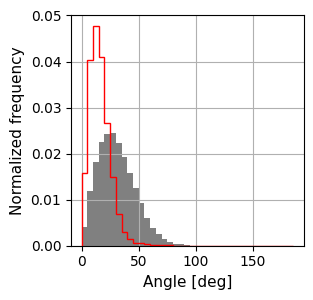

###########################
###########################
###########################


In [42]:
#%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/"

names_angle_eval=[["y_test_short_bm_1_0.h5"]]
                  

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[4]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontsize=11)
    ax1.grid()
    
    #output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_long_1/04-29_Bay_Opt/output_graphics/"
    #angle_name = names_angles[j].lower().replace(" ", "_") 
    #filename = f"{output_dir}/{names_ini1}angle_dist_{i}_{angle_name}.png"

    #plt.savefig(filename, dpi=300, bbox_inches='tight')
            
    plt.show()
  
    print("###########################")
    print("###########################")
    print("###########################")



# Bayesian optimization

## Angle distributions from oxDNA sim

In [9]:
#load target angles
values_angle_base_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining/Y_motif_angles_oxDNA/short_y_motif/values_angles_short_motif/values_angle_base_target.npy")
values_angle_link_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining/Y_motif_angles_oxDNA/short_y_motif/values_angles_short_motif/values_angle_link_target.npy")
values_angle_arm_axis_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining/Y_motif_angles_oxDNA/short_y_motif/values_angles_short_motif/values_angle_arm_axis_target.npy")
values_angle_link_HP_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining/Y_motif_angles_oxDNA/short_y_motif/values_angles_short_motif/values_angle_link_HP_target.npy")
values_angle_ds_fused_link_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining/Y_motif_angles_oxDNA/short_y_motif/values_angles_short_motif/values_angle_ds_fused_link_target.npy")


In [10]:
#generate histograms of target angles
values_angle_base_target=values_angle_base_target.flatten()
values_angle_link_target=values_angle_link_target.flatten()
values_angle_arm_axis_target=values_angle_arm_axis_target.flatten()
values_angle_link_HP_target=values_angle_link_HP_target.flatten()
values_angle_ds_fused_link_target=values_angle_ds_fused_link_target.flatten()
#values_angle_oppa_target=values_angle_oppa_target.flatten()

base_angle_distr_target=np.histogram(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
link_angle_distr_target=np.histogram(values_angle_link_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
arm_axis_angle_distr_target=np.histogram(values_angle_arm_axis_target*180/np.pi,bins=np.arange(0,190,1),density=True)[0]
link_HP_angle_distr_target=np.histogram(values_angle_link_HP_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
angle_ds_fused_link_distr_target=np.histogram(values_angle_ds_fused_link_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
#oppa_angle_distr_target=np.histogram(values_angle_oppa_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]

base_angle_distr_target=np.asarray(base_angle_distr_target)
link_angle_distr_target=np.asarray(link_angle_distr_target)
arm_axis_angle_distr_target=np.asarray(arm_axis_angle_distr_target)
link_HP_angle_distr_target=np.asarray(link_HP_angle_distr_target)
angle_ds_fused_link_distr_target=np.asarray(angle_ds_fused_link_distr_target)
#oppa_angle_distr_target=np.asarray(oppa_angle_distr_target)

list_values_target_angles_1=[values_angle_base_target,values_angle_link_target,values_angle_arm_axis_target,values_angle_link_HP_target,values_angle_ds_fused_link_target] #values_angle_oppa_target, 

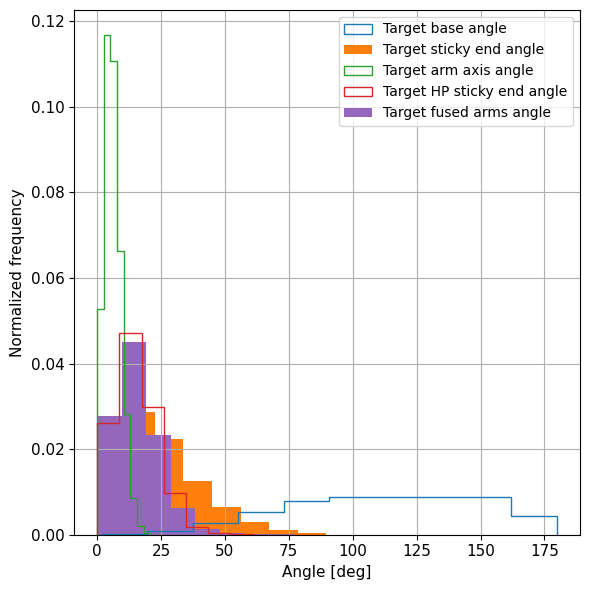

In [11]:
plt.figure(figsize=(6,6))
plt.hist(values_angle_base_target*180/np.pi,density=True,label="Target base angle",histtype="step")
plt.hist(values_angle_link_target*180/np.pi,density=True,label="Target sticky end angle",histtype="bar")
plt.hist(values_angle_arm_axis_target*180/np.pi,density=True,label="Target arm axis angle",histtype="step")
plt.hist(values_angle_link_HP_target*180/np.pi,density=True,label="Target HP sticky end angle",histtype="step")
plt.hist(values_angle_ds_fused_link_target*180/np.pi,density=True,label="Target fused arms angle",histtype="bar")
#plt.hist(values_angle_oppa_target*180/np.pi,density=True,label="Target opposing arm angle",histtype="bar")


plt.legend()
plt.xlabel("Angle [deg]",fontsize=11)
plt.ylabel("Normalized frequency",fontsize=11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.grid()
plt.tight_layout()

# Optimize different angle combinations

## Initialize botorch

In [12]:
#use botorch implementation 
#initialize GP model, train on input and predict next params
def apply_gp_bo_1(x_rs,x_train_rs,x,f_train_rs,seed,dim_x,dim_y,num_restarts,raw_samples,scaler_x):
    #x_rs: full rescaled parameter space  -> no actual rescaling needed with internal rescaling by botorch
    #x_train_rs: rescaled training values -> no actual rescaling needed with internal rescaling by botorch
    #x: full non-rescaled parameter space -> only needed to get bounds
    #initialize and train GP model

    #set random seed for torch and numpy, each round gets different seed based on number of rounds
    torch.manual_seed(seed+len(f_train_rs))
    np.random.seed(seed+len(f_train_rs))

    #fit scaler on full range of values
    scaler_x1=scaler_x()
    scaler_x1.fit(x) 
    x=scaler_x1.transform(x)
    #print(x)
    #minimum and maximum values for bounds
    min_bounds = np.min(x, axis=0)
    max_bounds = np.max(x, axis=0)
    bounds = np.vstack((min_bounds, max_bounds))
    #print(bounds)
    bounds = torch.from_numpy(bounds)
    #print(x_train_rs,f_train_rs)

    #x and f as arrays
    x_train_rs=np.array(x_train_rs)
    f_train_rs=np.array(f_train_rs).reshape(-1,1)

    #option to scale input before botorch 
    x_train_rs=scaler_x1.transform(x_train_rs)
    #print(x_train_rs,f_train_rs)

    #x and f as torch tensor
    x_train_rs=torch.from_numpy(x_train_rs)
    f_train_rs=torch.from_numpy(f_train_rs)
    
    #print(x_train_rs.shape,f_train_rs.shape)
    #option to specify noise
    #train_fvar = torch.zeros_like(f_train_rs)  # Zero noise
    #likelihood = FixedNoiseGaussianLikelihood(noise=train_fvar)
    #gp=SingleTaskGP(train_X=x_train_rs,train_Y=f_train_rs,**params_SingleTaskGP_dict)
    gp=SingleTaskGP(train_X=x_train_rs,train_Y=f_train_rs,input_transform=Normalize(d=dim_x),outcome_transform=Standardize(m=dim_y))
    

    mll = ExactMarginalLogLikelihood(gp.likelihood, gp)
    fit_gpytorch_mll(mll)

    logEI = LogExpectedImprovement(model=gp, best_f=f_train_rs.max())
    #ei = ExpectedImprovement(model=gp, best_f=f_train_rs.max())
    ucb =UpperConfidenceBound(gp, beta=1)

    candidate, acq_value = optimize_acqf(ucb, bounds=bounds, q=1, num_restarts=num_restarts, raw_samples=raw_samples)

    x_rs_next=candidate.detach().numpy()[0]
    #print(x_rs_next)
    #apply inverse scaling transform
    if dim_x==1:
        x_next=scaler_x1.inverse_transform(x_rs_next.reshape(-1, 1)).flatten()
    else:
        x_next=scaler_x1.inverse_transform(x_rs_next)
    #x_next=x_rs_next
    print(x_rs_next,x_next)
    gpr=None
    
    return x_next, x_next, gpr




In [13]:
#for GP parameter values need to be in other range, for instance [0,5], apply scaler to parameter lists
def rescaled_params_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler(feature_range=(0, 5))
        scaled = scaler.fit_transform(np.asarray(values*10**20).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

#generate linearly scaled rs values, independent of actual parameter scaling
def rescaled_params_2_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler(feature_range=(0, 5))
        values_lin=np.linspace(0,5,len(values))
        scaled = scaler.fit_transform(values_lin.reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

#place holder rescaling
def rescaled_params_no_sc_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = FunctionTransformer(func=None) #MinMaxScaler(feature_range=(0, 5))
        scaled = scaler.fit_transform(np.asarray(values).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df


def scale_by_inverse_min(X):
    min_vals = np.min(X, axis=0)
    return X * (1 / min_vals)

#sklearn scaler struggles with small values, use simple implementaion generated with Copilot
class MinMaxScaler2:
    def __init__(self):
        self.data_min = None
        self.data_max = None

    def fit(self, data):
        """
        Compute the minimum and maximum values for scaling.

        Parameters:
        data (numpy.ndarray): The input data to be scaled.
        """
        self.data_min = np.min(data, axis=0)
        self.data_max = np.max(data, axis=0)

    def transform(self, data):
        """
        Scale the data to the range [0, 1].

        Parameters:
        data (numpy.ndarray): The input data to be scaled.

        Returns:
        numpy.ndarray: The scaled data.
        """
        if self.data_min is None or self.data_max is None:
            raise ValueError("The scaler has not been fitted yet.")
        scaled_data = (data - self.data_min) / (self.data_max - self.data_min)
        return scaled_data

    def inverse_transform(self, scaled_data):
        """
        Reverse the scaling of the data.

        Parameters:
        scaled_data (numpy.ndarray): The scaled data to be reverted.

        Returns:
        numpy.ndarray: The Arial data.
        """
        if self.data_min is None or self.data_max is None:
            raise ValueError("The scaler has not been fitted yet.")
        Original_data = scaled_data * (self.data_max - self.data_min) + self.data_min
        return Original_data
        
#apply MinMaxScaler2 to data
def rescaled_params_df_MinMaxScaler2(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler2()
        scaler.fit(np.asarray(values).reshape(-1, 1))
        scaled = scaler.transform(np.asarray(values).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

## Base + arm axis + link angle

In [14]:
#copy of sim params
run_sim_1_input_1=run_sim_1_input.copy()


#specify which parameters are to be optimised over which range
var_params_1={"Param names":["k_angle_ds_base",
                             "theta_base_x",
                             "k_angle_ds_arm",
                             "k_angle_ss_link"
                            ],
                         
            "Param values":[k_angle_ds_base_range,                           
                            theta_base_x_range,
                            k_angle_ds_arm_range,
                            k_angle_ss_link_range
                           ],
            
            "Set of indep params":[0,     
                                   0,
                                   1,
                                   2
                                  ],
           "Index init guess":[[0,0,3,3,2],
                               [0,3,0,3,2],
                               [0,0,0,3,2],
                               [0,0,0,0,2]
                              ]
           }


df_var_params_1=pd.DataFrame(var_params_1)

#placeholder scaler on real values
df_var_params_1 = rescaled_params_no_sc_df(df_var_params_1)


df_var_params_1

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_base,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 0, 3, 3, 2]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
1,theta_base_x,"[1.5707963267948966, 2.0943951023931953, 2.617...",0,"[0, 3, 0, 3, 2]",FunctionTransformer(),"[1.5707963267948966, 2.0943951023931953, 2.617..."
2,k_angle_ds_arm,"[1e-24, 1e-22, 1e-20, 1e-18]",1,"[0, 0, 0, 3, 2]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
3,k_angle_ss_link,"[1e-24, 1e-22, 1e-20, 1e-18]",2,"[0, 0, 0, 0, 2]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [15]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_1_0={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":2,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}
GP_params_1_1={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}
GP_params_1_2={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}


Eval_params_1_0={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "base_angle_distr_target":base_angle_distr_target}

Eval_params_1_1={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "arm_axis_angle_distr_target":arm_axis_angle_distr_target}

Eval_params_1_2={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "link_angle_distr_target":link_angle_distr_target}

eval_opt_param_set_1={"Set of indep params":[0,
                                             1,
                                             2],
                      "Eval fct": [eval_sim_1_1_ba,
                                   eval_sim_1_1_aa,
                                   eval_sim_1_1_la],
                      "Eval params":[Eval_params_1_0,
                                     Eval_params_1_1,
                                     Eval_params_1_2],
                      "Scaler": [FunctionTransformer(func=None),
                                 FunctionTransformer(func=None),
                                 FunctionTransformer(func=None)],
                      "GP": [apply_gp_bo_1,
                             apply_gp_bo_1,
                             apply_gp_bo_1],
                      "GP params": [GP_params_1_0,
                                    GP_params_1_1,
                                    GP_params_1_2]}

df_eval_opt_param_set_1=pd.DataFrame(eval_opt_param_set_1)
df_eval_opt_param_set_1

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_1_ba at 0x770756038820>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."
1,1,<function eval_sim_1_1_aa at 0x770756038940>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."
2,2,<function eval_sim_1_1_la at 0x7707560388b0>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [17]:
%%time
#run optimization
df_t1,gpr_1=run_gp_11(df_run_sim=run_sim_1_input_1,
              df_var_params=df_var_params_1,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_1,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/",
              sim_name="sim_ba_aa_la_opt_1_",
              file_name_sim_params=None, #"params_ba_aa_opt_1", 
              sim_repeats=5,
              iterations=50,
              print_sim_config=False,
              load_existing_init_sims=False,
              load_existing_opt_sims=False)

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Step  1 / 5  initial simulations


  0%|▏                                                                         | 1662/500000 [00:00<00:29, 16614.75it/s]

Step  2 / 5  initial simulations


  0%|▏                                                                         | 1427/500000 [00:00<00:34, 14259.44it/s]

Step  3 / 5  initial simulations


  0%|▏                                                                         | 1554/500000 [00:00<00:32, 15539.38it/s]

Step  4 / 5  initial simulations


  0%|▎                                                                         | 1815/500000 [00:00<00:27, 18146.64it/s]

Step  5 / 5  initial simulations


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14217.65it/s]


Step  1 / 50  optimization simulations
[0.20263751 0.40550797] [2.02638305e-19 2.20776675e+00]
[0.27917732] [2.79178041e-19]


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01309081] [1.3091798e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14178.95it/s]


Step  2 / 50  optimization simulations
[0.         0.80210378] [1.000000e-24 2.830738e+00]
[0.5355425] [5.35542968e-19]


  0%|▏                                                                         | 1391/500000 [00:00<00:35, 13906.93it/s]

[0.01839735] [1.83983267e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:36<00:00, 13616.48it/s]


Step  3 / 50  optimization simulations
[0.         0.39306142] [1.00000000e-24 2.18821576e+00]
[0.37636351] [3.76364135e-19]


  0%|▏                                                                         | 1638/500000 [00:00<00:30, 16379.31it/s]

[0.02708375] [2.70847207e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14310.11it/s]


Step  4 / 50  optimization simulations
[0.86423714 0.        ] [8.64237278e-19 1.57079633e+00]
[0.35767207] [3.57672711e-19]


  0%|▏                                                                         | 1416/500000 [00:00<00:35, 14157.92it/s]

[0.02079685] [2.07978243e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14486.49it/s]


Step  5 / 50  optimization simulations
[0.05154899 0.61772822] [5.15499343e-20 2.54112155e+00]
[0.33157833] [3.31578994e-19]


  0%|▏                                                                         | 1300/500000 [00:00<00:38, 12847.71it/s]

[0.01770012] [1.77011025e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14547.78it/s]


Step  6 / 50  optimization simulations
[0.         0.58267483] [1.00000000e-24 2.48605981e+00]
[0.34477539] [3.44776043e-19]


  0%|▏                                                                         | 1300/500000 [00:00<00:38, 12929.27it/s]

[0.0176119] [1.76128826e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14376.06it/s]


Step  7 / 50  optimization simulations
[0.01580872 0.35707833] [1.58097047e-20 2.13169366e+00]
[0.3446359] [3.44636554e-19]


  0%|▏                                                                         | 1126/500000 [00:00<00:44, 11258.10it/s]

[0.05554116] [5.55421023e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14200.15it/s]


Step  8 / 50  optimization simulations
[0.         0.68859147] [1.00000000e-24 2.65243327e+00]
[0.70335779] [7.03358082e-19]


  0%|▏                                                                         | 1601/500000 [00:00<00:31, 16005.21it/s]

[0.0177351] [1.77360776e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:31<00:00, 15723.73it/s]


Step  9 / 50  optimization simulations
[0.         0.66649391] [1.00000000e-24 2.61772252e+00]
[0.34462115] [3.4462181e-19]


  0%|▎                                                                         | 1812/500000 [00:00<00:27, 18114.45it/s]

[0.01758323] [1.75842083e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15571.07it/s]


Step  10 / 50  optimization simulations
[0.0153953 1.       ] [1.53962865e-20 3.14159265e+00]
[0.34469368] [3.44694339e-19]


  0%|▏                                                                         | 1300/500000 [00:00<00:38, 12892.89it/s]

[0.01791506] [1.79160415e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14819.50it/s]


Step  11 / 50  optimization simulations
[0.         0.64315084] [1.00000000e-24 2.58105531e+00]
[0.34466253] [3.44663183e-19]


  0%|▏                                                                         | 1300/500000 [00:00<00:38, 12835.01it/s]

[0.01807918] [1.80801579e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14466.45it/s]


Step  12 / 50  optimization simulations
[0.         0.64917364] [1.00000000e-24 2.59051589e+00]
[0.34465714] [3.44657798e-19]


  0%|▎                                                                         | 1782/500000 [00:00<00:27, 17817.89it/s]

[0.0979762] [9.7977101e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14689.05it/s]


Step  13 / 50  optimization simulations
[0.00616223 0.51540952] [6.16322541e-21 2.38039970e+00]
[0.3446984] [3.44699056e-19]


  0%|▏                                                                         | 1433/500000 [00:00<00:34, 14328.78it/s]

[0.01789398] [1.78949593e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14726.06it/s]


Step  14 / 50  optimization simulations
[0.01246245 0.71108508] [1.24634342e-20 2.68776616e+00]
[0.34475139] [3.44752047e-19]


  0%|▏                                                                         | 1054/500000 [00:00<00:47, 10537.07it/s]

[0.01788377] [1.788475e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14728.20it/s]


Step  15 / 50  optimization simulations
[0.         0.57430262] [1.00000000e-24 2.47290877e+00]
[0.34482078] [3.44821432e-19]


  0%|▎                                                                         | 1745/500000 [00:00<00:28, 17448.35it/s]

[0.0179166] [1.79175845e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14722.80it/s]


Step  16 / 50  optimization simulations
[0.         0.61775164] [1.00000000e-24 2.54115833e+00]
[0.34489847] [3.44899128e-19]


  0%|▏                                                                         | 1085/500000 [00:00<00:45, 10848.74it/s]

[0.01789427] [1.78952513e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14708.73it/s]


Step  17 / 50  optimization simulations
[0. 0.] [1.00000000e-24 1.57079633e+00]
[0.34497975] [3.44980405e-19]


  0%|▏                                                                         | 1294/500000 [00:00<00:38, 12937.14it/s]

[0.01788346] [1.78844443e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14616.84it/s]


Step  18 / 50  optimization simulations
[0.         0.65328725] [1.00000000e-24 2.59697755e+00]
[0.34508292] [3.45083576e-19]


  0%|▏                                                                         | 1077/500000 [00:00<00:46, 10763.72it/s]

[0.01784673] [1.78477088e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14094.95it/s]


Step  19 / 50  optimization simulations
[0.         0.65357894] [1.00000000e-24 2.59743573e+00]
[0.34521821] [3.45218864e-19]


  0%|▎                                                                         | 1816/500000 [00:00<00:27, 18159.11it/s]

[0.01796903] [1.79700166e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 13945.61it/s]


Step  20 / 50  optimization simulations
[0.         0.53664957] [1.0000000e-24 2.4137635e+00]
[0.34523187] [3.45232528e-19]


  0%|▏                                                                         | 1652/500000 [00:00<00:30, 16518.52it/s]

[0.01790262] [1.79035987e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 13900.01it/s]


Step  21 / 50  optimization simulations
[1. 0.] [1.00000000e-18 1.57079633e+00]
[0.34549316] [3.45493811e-19]


  0%|▏                                                                         | 1452/500000 [00:00<00:34, 14514.93it/s]

[0.01789399] [1.7894971e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14478.41it/s]


Step  22 / 50  optimization simulations
[0.         0.31749814] [1.00000000e-24 2.06952124e+00]
[0.34588402] [3.45884672e-19]


  0%|▏                                                                         | 1308/500000 [00:00<00:38, 13071.22it/s]

[0.01747413] [1.74751097e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14135.52it/s]


Step  23 / 50  optimization simulations
[0.         0.43187873] [1.00000000e-24 2.24918985e+00]
[0.34338416] [3.43384818e-19]


  0%|▏                                                                         | 1149/500000 [00:00<00:43, 11485.41it/s]

[0.01823458] [1.82355664e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14282.40it/s]


Step  24 / 50  optimization simulations
[0.         0.51845802] [1.00000000e-24 2.38518828e+00]
[0.34281963] [3.42820282e-19]


  0%|▏                                                                         | 1200/500000 [00:00<00:41, 11901.66it/s]

[0.45336686] [4.53367407e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15441.30it/s]


Step  25 / 50  optimization simulations
[0.         0.67144732] [1.00000000e-24 2.62550331e+00]
[0.34196834] [3.41968996e-19]


  0%|▎                                                                         | 1749/500000 [00:00<00:28, 17483.72it/s]

[0.01812788] [1.81288614e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15244.08it/s]


Step  26 / 50  optimization simulations
[0.         0.67136064] [1.00000000e-24 2.62536715e+00]
[0.34166782] [3.41668482e-19]


  0%|▏                                                                         | 1599/500000 [00:00<00:31, 15985.02it/s]

[0.01818561] [1.81865964e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14964.80it/s]


Step  27 / 50  optimization simulations
[0.         0.67840846] [1.00000000e-24 2.63643785e+00]
[0.34167335] [3.41674006e-19]


  0%|▏                                                                         | 1573/500000 [00:00<00:31, 15723.87it/s]

[0.01829708] [1.82980637e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15255.44it/s]


Step  28 / 50  optimization simulations
[0. 0.] [1.00000000e-24 1.57079633e+00]
[0.34225436] [3.42255018e-19]


  0%|▏                                                                         | 1596/500000 [00:00<00:31, 15952.64it/s]

[0.0181782] [1.81791847e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15299.52it/s]


Step  29 / 50  optimization simulations
[0. 0.] [1.00000000e-24 1.57079633e+00]
[0.34225877] [3.4225943e-19]


  0%|▏                                                                         | 1100/500000 [00:00<00:45, 10946.51it/s]

[0.01819612] [1.81971055e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15279.91it/s]


Step  30 / 50  optimization simulations
[0. 0.] [1.00000000e-24 1.57079633e+00]
[0.34221461] [3.42215265e-19]


  0%|▏                                                                         | 1670/500000 [00:00<00:29, 16693.89it/s]

[0.0181178] [1.81187787e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 15110.80it/s]


Step  31 / 50  optimization simulations
[0.         0.16633381] [1.00000000e-24 1.83207286e+00]
[0.34223716] [3.42237813e-19]


  0%|▏                                                                         | 1363/500000 [00:00<00:36, 13624.46it/s]

[0.01816529] [1.81662711e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:31<00:00, 15702.07it/s]


Step  32 / 50  optimization simulations
[0.         0.18099782] [1.00000000e-24 1.85510704e+00]
[0.34193205] [3.41932713e-19]


  0%|▏                                                                         | 1400/500000 [00:00<00:35, 13930.33it/s]

[0.01817002] [1.81709994e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15214.84it/s]


Step  33 / 50  optimization simulations
[0.         0.18456551] [1.00000000e-24 1.86071115e+00]
[0.34191828] [3.41918933e-19]


  0%|▏                                                                         | 1153/500000 [00:00<00:43, 11529.32it/s]

[0.01815176] [1.81527396e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15337.49it/s]


Step  34 / 50  optimization simulations
[0. 0.] [1.00000000e-24 1.57079633e+00]
[0.34216648] [3.42167142e-19]


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01813141] [1.813239e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14910.27it/s]


Step  35 / 50  optimization simulations
[0.         0.22607211] [1.00000000e-24 1.92590957e+00]
[0.34243264] [3.42433301e-19]


  0%|▏                                                                         | 1400/500000 [00:00<00:35, 13990.07it/s]

[0.0181456] [1.8146578e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14436.10it/s]


Step  36 / 50  optimization simulations
[0.         0.23308233] [1.0000000e-24 1.9369212e+00]
[0.3426721] [3.42672759e-19]


  0%|▏                                                                         | 1155/500000 [00:00<00:43, 11544.95it/s]

[0.01824213] [1.82431078e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14223.95it/s]


Step  37 / 50  optimization simulations
[0.         0.24913323] [1.00000000e-24 1.96213389e+00]
[0.3433405] [3.43341159e-19]


  0%|▏                                                                         | 1613/500000 [00:00<00:30, 16125.44it/s]

[0.01814762] [1.81485996e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14539.17it/s]


Step  38 / 50  optimization simulations
[0. 0.] [1.00000000e-24 1.57079633e+00]
[0.34372591] [3.4372657e-19]


  0%|▏                                                                         | 1133/500000 [00:00<00:44, 11321.67it/s]

[0.01816623] [1.81672075e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14523.24it/s]


Step  39 / 50  optimization simulations
[0.         0.48121112] [1.00000000e-24 2.32668099e+00]
[0.34333749] [3.43338148e-19]


  0%|▏                                                                         | 1048/500000 [00:00<00:47, 10474.89it/s]

[0.01815069] [1.81516706e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14367.29it/s]


Step  40 / 50  optimization simulations
[0.         0.47911716] [1.0000000e-24 2.3233918e+00]
[0.34319791] [3.43198566e-19]


  0%|▏                                                                         | 1224/500000 [00:00<00:40, 12237.18it/s]

[0.01806832] [1.80693003e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14514.37it/s]


Step  41 / 50  optimization simulations
[0.         0.50751755] [1.00000000e-24 2.36800303e+00]
[0.34310375] [3.43104412e-19]


  0%|▏                                                                         | 1575/500000 [00:00<00:31, 15744.01it/s]

[0.0181686] [1.81695838e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14334.56it/s]


Step  42 / 50  optimization simulations
[0.         0.22354016] [1.00000000e-24 1.92193239e+00]
[0.34328299] [3.43283642e-19]


  0%|▏                                                                         | 1671/500000 [00:00<00:29, 16708.46it/s]

[0.01820382] [1.82047986e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14477.73it/s]


Step  43 / 50  optimization simulations
[0.         0.23442784] [1.00000000e-24 1.93903472e+00]
[0.34390258] [3.43903237e-19]


  0%|▎                                                                         | 1730/500000 [00:00<00:28, 17293.21it/s]

[0.0182214] [1.82223802e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14494.46it/s]


Step  44 / 50  optimization simulations
[0.         0.23621296] [1.00000000e-24 1.94183878e+00]
[0.34411466] [3.44115313e-19]


  0%|▎                                                                         | 1711/500000 [00:00<00:29, 17105.33it/s]

[0.01816814] [1.81691257e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14312.28it/s]


Step  45 / 50  optimization simulations
[0.         0.23429712] [1.00000000e-24 1.93882939e+00]
[0.3430939] [3.43094552e-19]


  0%|▏                                                                           | 998/500000 [00:00<00:50, 9974.40it/s]

[0.01813182] [1.81328003e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14415.78it/s]


Step  46 / 50  optimization simulations
[0.         0.23170721] [1.00000000e-24 1.93476115e+00]
[0.34291593] [3.42916589e-19]


  0%|▏                                                                         | 1527/500000 [00:00<00:32, 15266.74it/s]

[0.01801447] [1.80154478e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14268.81it/s]


Step  47 / 50  optimization simulations
[0.         0.24078718] [1.00000000e-24 1.94902394e+00]
[0.34275539] [3.42756049e-19]


  0%|▏                                                                          | 1000/500000 [00:00<00:50, 9873.50it/s]

[0.01812042] [1.81214023e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 14087.95it/s]


Step  48 / 50  optimization simulations
[0.         0.52284867] [1.0000000e-24 2.3920851e+00]
[0.34312089] [3.43121545e-19]


  0%|▏                                                                         | 1600/500000 [00:00<00:31, 15899.18it/s]

[0.01807111] [1.80720903e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14616.96it/s]


Step  49 / 50  optimization simulations
[0.         0.63869216] [1.00000000e-24 2.57405162e+00]
[0.34306956] [3.43070219e-19]


  0%|▏                                                                         | 1552/500000 [00:00<00:32, 15517.87it/s]

[0.01817034] [1.81713239e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15456.64it/s]


Step  50 / 50  optimization simulations
[0.         0.65462473] [1.00000000e-24 2.59907845e+00]
[0.34295736] [3.4295802e-19]


  0%|▏                                                                         | 1684/500000 [00:00<00:29, 16835.60it/s]

[0.0181677] [1.81686821e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15343.10it/s]


CPU times: user 12min 42s, sys: 50.5 s, total: 13min 33s
Wall time: 39min 45s


In [18]:
df_t1

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params,Param names in set,f train,f train rs,x train rs,x train
0,0,<function eval_sim_1_1_ba at 0x770756038820>,{'folder': '/home/xenia/Masterthesis_ReaDDy/Ba...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[1e-24, 1.5707963267948966], [1e-24,...","[k_angle_ds_base, theta_base_x]","[0.9292231584991149, 0.9269927244404108, 0.925...","[0.9292231584991149, 0.9269927244404108, 0.925...","[[1e-24, 1.5707963267948966], [1e-24, 3.141592...","[[1e-24, 1.5707963267948966], [1e-24, 3.141592..."
1,1,<function eval_sim_1_1_aa at 0x770756038940>,{'folder': '/home/xenia/Masterthesis_ReaDDy/Ba...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[1e-24], [1e-22], [1e-20], [1e-18]],...",[k_angle_ds_arm],"[0.3397280932897682, 0.3401574628440875, 0.339...","[0.3397280932897682, 0.3401574628440875, 0.339...","[[1e-24], [1e-24], [1e-24], [1e-18], [1e-20], ...","[[1e-24], [1e-24], [1e-24], [1e-18], [1e-20], ..."
2,2,<function eval_sim_1_1_la at 0x7707560388b0>,{'folder': '/home/xenia/Masterthesis_ReaDDy/Ba...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[1e-24], [1e-22], [1e-20], [1e-18]],...",[k_angle_ss_link],"[0.7773394410067238, 0.7755747748292967, 0.775...","[0.7773394410067238, 0.7755747748292967, 0.775...","[[1e-24], [1e-24], [1e-24], [1e-24], [1e-20], ...","[[1e-24], [1e-24], [1e-24], [1e-24], [1e-20], ..."


In [19]:
#create dictionary with updated parameters
dict_opt_params_step_1={}
dict_opt_rs_params_step_1={}

for index, row in df_t1.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_1[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_1[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_1)    
print(dict_opt_params_step_1)

max fitness: 4 0.9540787775478717
param set: 0 [1e-20, 2.6179938779914944]
param set: 0 [1e-20, 2.6179938779914944]
max fitness: 25 0.9902919923176007
param set: 1 [3.454938111838066e-19]
param set: 1 [3.454938111838066e-19]
max fitness: 9 0.9755477647673703
param set: 2 [1.770110254417513e-20]
param set: 2 [1.770110254417513e-20]
{'k_angle_ds_base_rs': 1e-20, 'theta_base_x_rs': 2.6179938779914944, 'k_angle_ds_arm_rs': 3.454938111838066e-19, 'k_angle_ss_link_rs': 1.770110254417513e-20}
{'k_angle_ds_base': 1e-20, 'theta_base_x': 2.6179938779914944, 'k_angle_ds_arm': 3.454938111838066e-19, 'k_angle_ss_link': 1.770110254417513e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

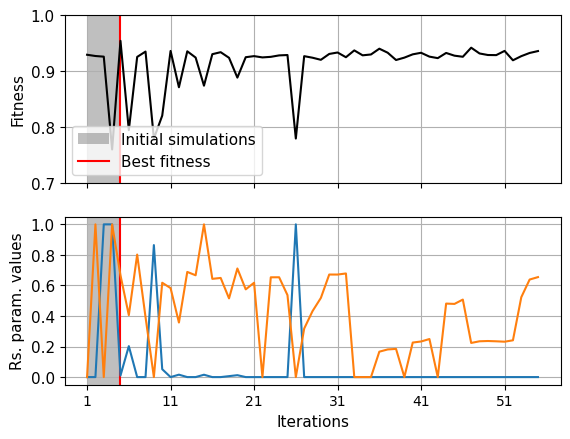

Parameter set 1


<Figure size 600x300 with 0 Axes>

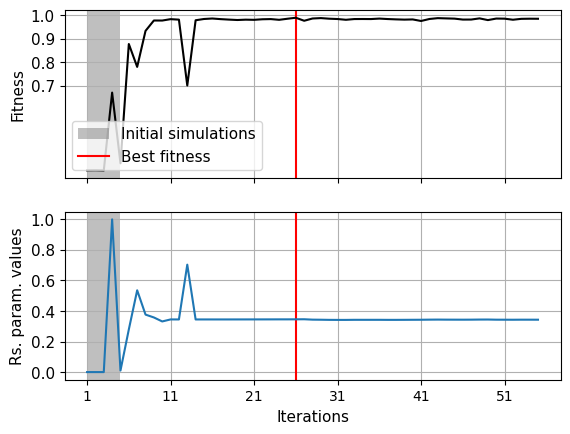

Parameter set 2


<Figure size 600x300 with 0 Axes>

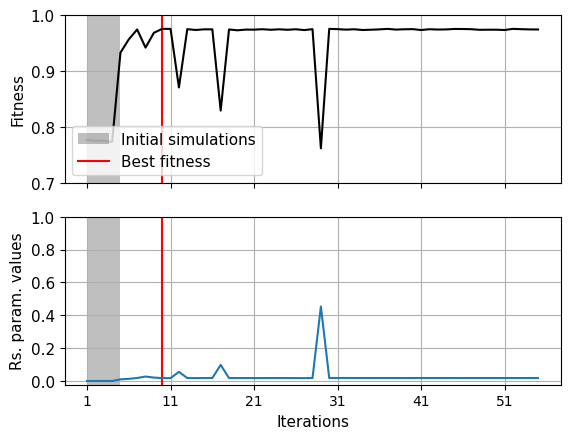

In [20]:
for index, row in df_t1.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=10
    init_sim_range=5
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1)
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    #ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower left",prop={'size': 11})
    ax1.grid()
    
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_1[df_var_params_1["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontsize=11)
    #plt.ylim(10**-22,0.1*10**-18)
    ax2.set_yticks(param_value_range,param_value_range,fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    #ax2.legend(loc="lower left",prop={'size': 11})
    ax2.grid()
    
    output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
    filename = f"{output_dir}/sim_ba_aa_la_opt_1_fitness.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    
    
    plt.show()

    

Base angle


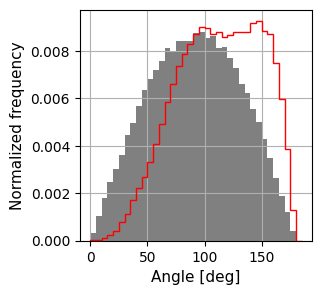

###########################
###########################
###########################
Link angle


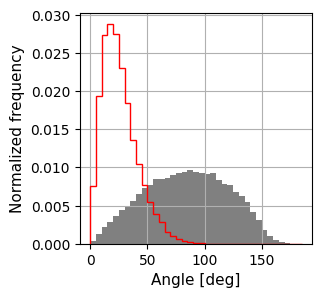

###########################
###########################
###########################
Arm axis angle


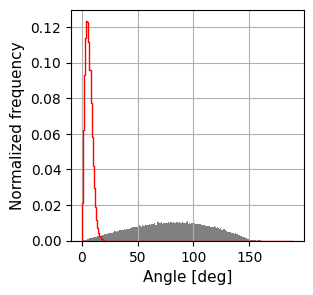

###########################
###########################
###########################
Base angle


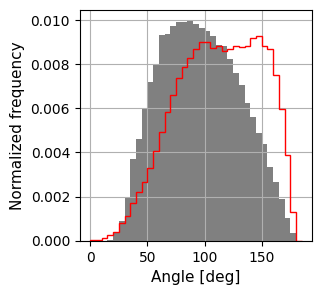

###########################
###########################
###########################
Link angle


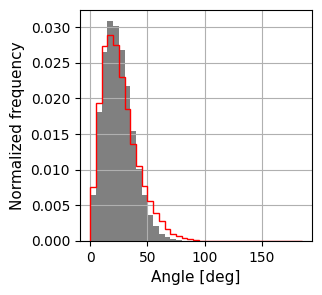

###########################
###########################
###########################
Arm axis angle


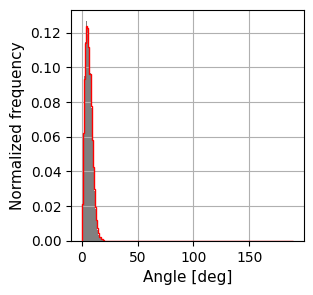

###########################
###########################
###########################
CPU times: user 1.46 s, sys: 2.95 s, total: 4.41 s
Wall time: 5.19 s


In [21]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"

names_ini1="sim_ba_aa_la_opt_1_"
names_angle_eval=[[names_ini1+str(l+10)+".h5" for l in range(5)],
                  [names_ini1+str(l+240)+".h5" for l in range(5)]] 

names_angles=["Base angle", "Link angle","Arm axis angle"]
for i in range(len(names_angle_eval)):
    n1,n2,n3,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1=cg_angle_distr_1_3_ba_aa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1]
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
          
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontsize=11)
        ax1.grid()
        
        output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
        angle_name = names_angles[j].lower().replace(" ", "_") 
        filename = f"{output_dir}/{names_ini1}angle_dist_{i}_{angle_name}.png"

        #plt.savefig(filename, dpi=300, bbox_inches='tight')
            
        plt.show()
  
        print("###########################")
        print("###########################")
        print("###########################")



## HP sticky end angle

In [22]:
#copy of sim params
run_sim_1_input_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_2.update(dict_opt_params_step_1)

#need HP template
run_sim_1_input_2["use_y_1_HP_template"]=True

#specify which parameters are to be optimised over which range
var_params_2={"Param names":["k_angle_ds_hp"],
                         
            "Param values":[k_angle_ds_hp_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]]  #[1,8]
           }

df_var_params_2=pd.DataFrame(var_params_2)

#placeholder scaler on real values
df_var_params_2 = rescaled_params_no_sc_df(df_var_params_2)

df_var_params_2

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_hp,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [23]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_2={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_2={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "link_HP_angle_distr_target":link_HP_angle_distr_target}

eval_opt_param_set_2={"Set of indep params":[0],
                      "Eval fct": [eval_sim_1_1_hp],
                      "Eval params":[Eval_params_2],
                      "Scaler": [StandardScaler()],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_2]}

df_eval_opt_param_set_2=pd.DataFrame(eval_opt_param_set_2)
df_eval_opt_param_set_2

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_1_hp at 0x7707560389d0>,"{'folder': None, 'names_sim_repeat': None, 't_...",StandardScaler(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [24]:
#run optimization
df_t2,gpr_2=run_gp_11(df_run_sim=run_sim_1_input_2,
              df_var_params=df_var_params_2,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_2,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/",
              sim_name="sim_hp_opt_1_",
              file_name_sim_params=None, #"params_hp_opt_1", 
              sim_repeats=5,
              iterations=50,
              print_sim_config=False,
              load_existing_init_sims=False,
              load_existing_opt_sims=False)

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Step  1 / 2  initial simulations


  0%|▎                                                                         | 1700/500000 [00:00<00:29, 16983.58it/s]

Step  2 / 2  initial simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Step  1 / 50  optimization simulations
[0.69999222] [6.99992519e-19]


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Step  2 / 50  optimization simulations
[0.8312875] [8.31287668e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15500.49it/s]


Step  3 / 50  optimization simulations
[0.59306391] [5.93064317e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15231.81it/s]


Step  4 / 50  optimization simulations


  0%|▏                                                                         | 1339/500000 [00:00<00:37, 13387.59it/s]

[0.50122959] [5.01230092e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15480.02it/s]


Step  5 / 50  optimization simulations


  0%|▏                                                                           | 999/500000 [00:00<00:49, 9986.06it/s]

[0.42055817] [4.20558752e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15581.97it/s]


Step  6 / 50  optimization simulations
[0.3493608] [3.49361447e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15478.80it/s]


Step  7 / 50  optimization simulations
[0.2899091] [2.89909809e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15469.13it/s]


Step  8 / 50  optimization simulations


  0%|▏                                                                         | 1066/500000 [00:00<00:46, 10653.43it/s]

[0.24259138] [2.42592135e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15397.99it/s]


Step  9 / 50  optimization simulations
[0.20718514] [2.07185936e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15530.69it/s]


Step  10 / 50  optimization simulations


  0%|▎                                                                         | 1696/500000 [00:00<00:29, 16955.65it/s]

[0.17774172] [1.7774254e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15352.97it/s]


Step  11 / 50  optimization simulations


  0%|▏                                                                         | 1097/500000 [00:00<00:45, 10965.30it/s]

[0.14875037] [1.48751217e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15522.21it/s]


Step  12 / 50  optimization simulations


  0%|▎                                                                         | 1748/500000 [00:00<00:28, 17474.52it/s]

[0.1314719] [1.31472769e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15221.21it/s]


Step  13 / 50  optimization simulations


  0%|▎                                                                         | 1700/500000 [00:00<00:29, 16772.40it/s]

[0.12236926] [1.22370139e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15464.84it/s]


Step  14 / 50  optimization simulations


  0%|▏                                                                         | 1580/500000 [00:00<00:31, 15793.20it/s]

[0.10295047] [1.02951363e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15588.34it/s]


Step  15 / 50  optimization simulations


  0%|▏                                                                         | 1488/500000 [00:00<00:33, 14872.39it/s]

[0.08839978] [8.84006935e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15573.08it/s]


Step  16 / 50  optimization simulations


  0%|▏                                                                         | 1593/500000 [00:00<00:31, 15928.27it/s]

[0.07511946] [7.51203803e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15416.87it/s]


Step  17 / 50  optimization simulations


  0%|▏                                                                         | 1524/500000 [00:00<00:32, 15237.33it/s]

[0.06507877] [6.50797091e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15382.30it/s]


Step  18 / 50  optimization simulations


  0%|▏                                                                         | 1600/500000 [00:00<00:31, 15838.13it/s]

[0.05629016] [5.62911008e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15260.81it/s]


Step  19 / 50  optimization simulations


  0%|▏                                                                         | 1600/500000 [00:00<00:31, 15909.96it/s]

[0.05021135] [5.02123028e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15222.36it/s]


Step  20 / 50  optimization simulations


  0%|▏                                                                         | 1078/500000 [00:00<00:46, 10775.62it/s]

[0.04502112] [4.5022079e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15399.59it/s]


Step  21 / 50  optimization simulations


  0%|▏                                                                         | 1552/500000 [00:00<00:32, 15513.87it/s]

[0.04663866] [4.66396117e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15512.91it/s]


Step  22 / 50  optimization simulations


  0%|▏                                                                         | 1664/500000 [00:00<00:29, 16637.04it/s]

[0.0468218] [4.68227546e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15346.24it/s]


Step  23 / 50  optimization simulations


  0%|▏                                                                         | 1298/500000 [00:00<00:38, 12976.58it/s]

[0.04700498] [4.7005937e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14944.81it/s]


Step  24 / 50  optimization simulations


  0%|▏                                                                         | 1254/500000 [00:00<00:39, 12539.71it/s]

[0.04819765] [4.81985985e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15256.92it/s]


Step  25 / 50  optimization simulations


  0%|▏                                                                         | 1486/500000 [00:00<00:33, 14859.02it/s]

[0.04782934] [4.78302885e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15249.97it/s]


Step  26 / 50  optimization simulations


  0%|▏                                                                         | 1600/500000 [00:00<00:31, 15937.09it/s]

[0.04783959] [4.78405396e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15312.75it/s]


Step  27 / 50  optimization simulations


  0%|▏                                                                         | 1084/500000 [00:00<00:46, 10836.08it/s]

[0.04839304] [4.83939954e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15396.03it/s]


Step  28 / 50  optimization simulations


  0%|▏                                                                         | 1575/500000 [00:00<00:31, 15746.86it/s]

[0.04837333] [4.83742864e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15414.32it/s]


Step  29 / 50  optimization simulations


  0%|▏                                                                         | 1446/500000 [00:00<00:34, 14459.84it/s]

[0.04841161] [4.84125587e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15279.19it/s]


Step  30 / 50  optimization simulations


  0%|▏                                                                         | 1543/500000 [00:00<00:32, 15426.41it/s]

[0.04842824] [4.84291906e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15532.79it/s]


Step  31 / 50  optimization simulations


  0%|▏                                                                           | 961/500000 [00:00<00:51, 9603.46it/s]

[0.04839958] [4.840053e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15351.55it/s]


Step  32 / 50  optimization simulations


  0%|▏                                                                         | 1397/500000 [00:00<00:35, 13965.62it/s]

[0.04842499] [4.84259466e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15374.82it/s]


Step  33 / 50  optimization simulations


  0%|▏                                                                          | 1000/500000 [00:00<00:50, 9928.00it/s]

[0.04843642] [4.84373674e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 15147.38it/s]


Step  34 / 50  optimization simulations


  0%|▏                                                                         | 1313/500000 [00:00<00:37, 13124.16it/s]

[0.04842841] [4.84293647e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15375.79it/s]


Step  35 / 50  optimization simulations


  0%|▏                                                                         | 1438/500000 [00:00<00:34, 14374.46it/s]

[0.04841956] [4.84205124e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15422.43it/s]


Step  36 / 50  optimization simulations


  0%|▏                                                                         | 1171/500000 [00:00<00:42, 11708.67it/s]

[0.04843452] [4.84354732e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15312.58it/s]


Step  37 / 50  optimization simulations


  0%|▏                                                                         | 1680/500000 [00:00<00:29, 16798.41it/s]

[0.04842655] [4.84275051e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15540.29it/s]


Step  38 / 50  optimization simulations


  0%|▏                                                                         | 1400/500000 [00:00<00:35, 13980.38it/s]

[0.0484097] [4.84106492e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15279.93it/s]


Step  39 / 50  optimization simulations


  0%|▏                                                                         | 1654/500000 [00:00<00:30, 16539.35it/s]

[0.04842647] [4.84274167e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15394.85it/s]


Step  40 / 50  optimization simulations


  0%|▏                                                                         | 1138/500000 [00:00<00:43, 11378.95it/s]

[0.04840512] [4.84060747e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 15148.89it/s]


Step  41 / 50  optimization simulations


  0%|▏                                                                         | 1518/500000 [00:00<00:32, 15173.36it/s]

[0.04839969] [4.84006423e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15292.66it/s]


Step  42 / 50  optimization simulations


  0%|▏                                                                         | 1401/500000 [00:00<00:35, 14002.97it/s]

[0.04840457] [4.84055209e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15264.15it/s]


Step  43 / 50  optimization simulations


  0%|▏                                                                         | 1368/500000 [00:00<00:36, 13677.60it/s]

[0.04839745] [4.83984024e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14848.27it/s]


Step  44 / 50  optimization simulations


  0%|▏                                                                         | 1644/500000 [00:00<00:30, 16434.69it/s]

[0.04839324] [4.83941922e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15425.76it/s]


Step  45 / 50  optimization simulations


  0%|▏                                                                         | 1400/500000 [00:00<00:35, 13880.12it/s]

[0.0483954] [4.83963557e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 15028.45it/s]


Step  46 / 50  optimization simulations


  0%|▏                                                                         | 1679/500000 [00:00<00:29, 16784.37it/s]

[0.04839962] [4.84005697e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 15128.87it/s]


Step  47 / 50  optimization simulations


  0%|▏                                                                         | 1244/500000 [00:00<00:40, 12433.82it/s]

[0.0483983] [4.83992484e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 15110.94it/s]


Step  48 / 50  optimization simulations


  0%|▏                                                                         | 1644/500000 [00:00<00:30, 16439.90it/s]

[0.04841038] [4.84113284e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14519.94it/s]


Step  49 / 50  optimization simulations


  0%|▏                                                                         | 1085/500000 [00:00<00:45, 10847.53it/s]

[0.04842042] [4.84213669e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14711.64it/s]


Step  50 / 50  optimization simulations


  0%|▏                                                                         | 1483/500000 [00:00<00:33, 14824.47it/s]

[0.04841685] [4.84178014e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:34<00:00, 14593.71it/s]


In [25]:
#create dictionary with updated parameters
dict_opt_params_step_2={}
dict_opt_rs_params_step_2={}

for index, row in df_t2.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_2[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_2[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_2)    
print(dict_opt_params_step_2)

max fitness: 25 0.9983836870033955
param set: 0 [4.8198598506330516e-20]
param set: 0 [4.8198598506330516e-20]
{'k_angle_ds_hp_rs': 4.8198598506330516e-20}
{'k_angle_ds_hp': 4.8198598506330516e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

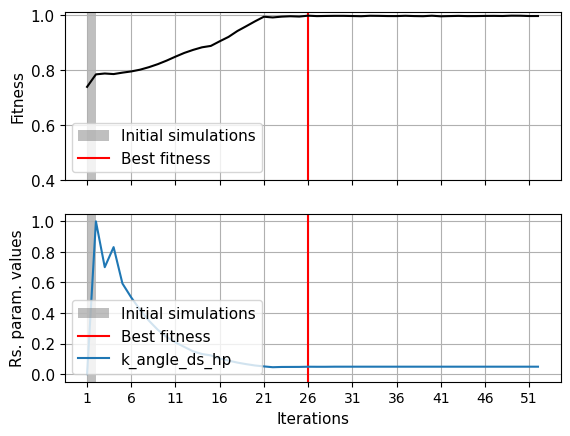

In [26]:
for index, row in df_t2.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    #ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower left",prop={'size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_2[df_var_params_2["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'size': 11})
    ax2.grid()
    
    output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
    filename = f"{output_dir}/sim_hp_opt_1_fitness.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    
    plt.show()


Link HP angle


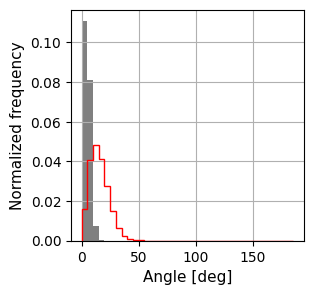

###########################
###########################
###########################
Link HP angle


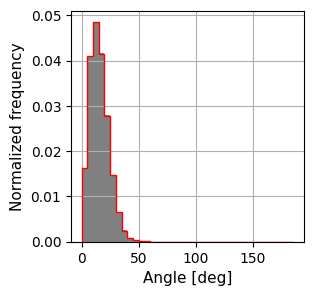

###########################
###########################
###########################
CPU times: user 871 ms, sys: 2.45 s, total: 3.32 s
Wall time: 4.62 s


In [27]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"

names_ini1="sim_hp_opt_1_"
names_angle_eval=[[names_ini1+str(l+10)+".h5" for l in range(5)],
                  [names_ini1+str(l+245)+".h5" for l in range(5)]]

names_angles="Link HP angle"
for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_1_1_hp(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[3]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontsize=11)
    ax1.grid()
    
    output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
    angle_name = names_angles[j].lower().replace(" ", "_") 
    filename = f"{output_dir}/{names_ini1}angle_dist_{i}_{angle_name}.png"

    plt.savefig(filename, dpi=300, bbox_inches='tight')
            
    plt.show()
  
    print("###########################")
    print("###########################")
    print("###########################")


## Angle between bound arms

In [28]:
#copy of sim params
run_sim_1_input_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_3.update(dict_opt_params_step_1)
run_sim_1_input_3.update(dict_opt_params_step_2)

#load state with two fused motifs
run_sim_1_input_3["checkpoint_path"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/checkpoint_bm/"

#specify which parameters are to be optimised over which range
var_params_3={"Param names":["k_angle_ds_fused_link"],
                         
            "Param values":[k_angle_ds_fused_link_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]] #[1,8]
           }


df_var_params_3=pd.DataFrame(var_params_3)

#placeholder scaler on real values
df_var_params_3 = rescaled_params_no_sc_df(df_var_params_3)

df_var_params_3

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_fused_link,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [29]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_3={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_3={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "angle_ds_fused_link_distr_target":angle_ds_fused_link_distr_target}

eval_opt_param_set_3={"Set of indep params":[0],
                      "Eval fct": [eval_sim_1_1_bm],
                      "Eval params":[Eval_params_3],
                      "Scaler": [StandardScaler()],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_3]}

df_eval_opt_param_set_3=pd.DataFrame(eval_opt_param_set_3)
df_eval_opt_param_set_3

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_1_bm at 0x770756038a60>,"{'folder': None, 'names_sim_repeat': None, 't_...",StandardScaler(),<function apply_gp_bo_1 at 0x7708782efee0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [30]:
#run optimization
df_t3,gpr_3=run_gp_11(df_run_sim=run_sim_1_input_3,
              df_var_params=df_var_params_3,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_3,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/",
              sim_name="sim_bm_opt_1_",
              file_name_sim_params=None, #"params_bm_opt_1", 
              sim_repeats=5,
              iterations=50,
              print_sim_config=False,
              load_existing_init_sims=False,
              load_existing_opt_sims=False)

Step  1 / 2  initial simulations


100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:50<00:00, 9980.27it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 y_centre_1#
 y_base_arm_c_1# 
#y_base_arm_a_1 
y_centre_1#y_arm_c_1
  y_arm_a_1## 

#y_link_c_1y_base_arm_a_1
  y_link_a_1##
 
#y_centre_1y_arm_a_1
  y_base_arm_b_1## 

#y_base_arm_a_1y_link_a_1 
 #y_arm_b_1# 

#y_arm_a_1y_base_arm_b_1
  y_link_fused_b_1## 

#y_link_a_1y_arm_b_1
  y_base_arm_c_1y_centre_1## 
 
#y_link_fused_b_1#y_base_arm_b_1
 
y_arm_c_1 # y_base_arm_a_1#
# 
y_base_arm_c_1
#y_arm_b_1 y_link_c_1
 # #y_arm_a_1y_centre_1#

  
y_arm_c_1y_link_b_1##y_centre_1  

 ##y_link_a_1y_base_arm_a_1#

  y_link_c_1
y_base_arm_c_1## y_base_arm_a_1 

# #y_base_arm_b_1y_arm_a_1
#
  y_centre_1
y_arm_c_1## y_arm_a_1 

# #y_link_a_1y_arm_b_1#

  y_base_arm_a_1
y_link_fused_c_1## y_link_a_1
 #
 y_base_arm_b_1#
y_link_fused_b_1# 
y_arm_a_1 
# #y_base_arm_b_1
#
 y_arm_b_1
y_base_arm_c_1# y_link_a_1 
# #y_arm_b_1
#
 y_link_fused_b_1
y_arm_c_1# y_base_arm_b_1 
# #y_link_b_1
#
 
y_base_arm_c_1y_li

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:48<00:00, 10219.63it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_centre_1y_arm_b_1  y_centre_1##
 
y_link_fused_b_1#y_base_arm_a_1 
 #y_base_arm_a_1#
 
y_base_arm_c_1#y_arm_a_1 
 #y_arm_a_1#
 
y_arm_c_1#y_link_a_1
  y_link_a_1## 

#y_link_c_1y_base_arm_b_1
  y_base_arm_b_1##
 
#y_arm_b_1y_centre_1
  y_arm_b_1## 

#y_base_arm_a_1y_link_fused_b_1
  y_centre_1y_link_fused_b_1## 
 
#y_arm_a_1y_base_arm_c_1# 
 
#y_base_arm_c_1#y_base_arm_a_1
  y_centre_1
#y_link_a_1#y_arm_c_1 
  
#y_arm_c_1#y_arm_a_1#
 
 
y_base_arm_b_1#y_base_arm_a_1#y_link_c_1  

 ##y_link_c_1#y_link_a_1

 
 y_arm_a_1y_arm_b_1#y_centre_1#  
 
##y_centre_1#y_base_arm_b_1

 
 y_link_a_1y_link_b_1#y_base_arm_a_1#  

 #y_base_arm_a_1##y_arm_b_1

  
y_base_arm_b_1y_base_arm_c_1##y_arm_a_1  

 ##y_arm_a_1y_link_fused_b_1#

  
y_arm_b_1y_arm_c_1##y_link_a_1  

 ##y_link_a_1y_base_arm_c_1#

  
y_link_fused_b_1y_link_fused_c_1##y_base_arm_b_1  

 ##y_base_arm_b_1y_arm_c_1#

  
y_base_arm_c_1##y_arm_b_1 

 #y_arm_b_1y_link

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10441.07it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #y_centre_1y_centre_1
y_arm_c_1   ###


y_base_arm_a_1y_base_arm_a_1y_link_c_1   ###


y_arm_a_1y_arm_a_1y_centre_1   ##
#
y_link_a_1
y_link_a_1 y_base_arm_a_1 # ##

y_base_arm_b_1y_base_arm_b_1
  y_arm_a_1## 

#y_arm_b_1
y_arm_b_1  y_link_a_1## 

#
y_link_fused_b_1y_link_fused_b_1 y_base_arm_b_1  ###

y_centre_1
y_base_arm_c_1y_base_arm_c_1y_centre_1y_arm_b_1     #####




y_arm_c_1y_base_arm_a_1y_arm_c_1y_link_b_1y_base_arm_a_1     #####




y_link_c_1y_arm_a_1y_link_c_1y_base_arm_c_1y_arm_a_1     #####




y_centre_1y_link_a_1y_centre_1y_link_a_1y_arm_c_1     #####




y_base_arm_a_1y_base_arm_b_1y_base_arm_a_1y_base_arm_b_1y_link_fused_c_1     #####




y_arm_a_1y_arm_b_1y_arm_b_1y_arm_a_1    ####



y_link_fused_b_1y_link_a_1y_link_a_1y_link_fused_b_1    ####



y_base_arm_c_1y_base_arm_b_1y_base_arm_c_1y_base_arm_b_1    ####


y_arm_c_1
y_arm_b_1y_arm_c_1y_arm_b_1

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10697.93it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1y_centre_1  ##

y_arm_c_1 y_base_arm_a_1# #

y_link_c_1y_arm_a_1 y_centre_1 # #
#
y_centre_1
y_link_a_1 y_base_arm_a_1 # #
#
y_base_arm_a_1
y_base_arm_b_1 y_arm_a_1 # #
#
y_arm_a_1y_centre_1
y_arm_b_1 y_link_a_1  ## #
#

y_link_a_1
y_link_fused_b_1y_base_arm_a_1 y_base_arm_b_1  # ##
#

y_base_arm_b_1y_base_arm_c_1
y_arm_a_1 y_arm_b_1  # ##
#

y_arm_b_1
y_arm_c_1y_link_a_1  y_link_fused_b_1 # ##


#y_link_b_1y_link_c_1
y_base_arm_b_1 y_base_arm_c_1  # ##
#

y_base_arm_c_1
y_centre_1y_arm_b_1y_centre_1 y_arm_c_1   # ####




y_arm_c_1y_base_arm_a_1y_link_fused_b_1y_base_arm_a_1 y_link_c_1   # ####




y_link_fused_c_1y_arm_a_1y_base_arm_c_1y_arm_a_1y_centre_1     #####




y_link_a_1y_arm_c_1y_link_a_1y_base_arm_a_1    ####



y_base_arm_b_1y_link_c_1y_base_arm_b_1y_arm_a_1    ####



y_centre_1y_arm_b_1y_arm_b_1y_link_a_1    ####



y_base_arm_a_1y_link_b_1y_link_fused_b_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10786.75it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #y_centre_1
 y_arm_c_1# 
#y_base_arm_a_1
 y_link_c_1# 
#y_arm_a_1
 y_centre_1# 
#y_link_a_1
 y_base_arm_a_1# 
#y_base_arm_b_1
y_centre_1y_centre_1 y_arm_a_1 #  #
##
y_arm_b_1

y_base_arm_a_1 y_link_a_1y_base_arm_a_1 #  #
##
y_link_fused_b_1

y_arm_a_1 y_base_arm_b_1y_arm_a_1 #  #
##
y_base_arm_c_1

y_link_a_1 y_arm_b_1y_link_a_1 #  #
##
y_arm_c_1

y_base_arm_b_1 y_link_b_1y_base_arm_b_1 #  #
##
y_link_c_1

y_arm_b_1 y_base_arm_c_1y_arm_b_1y_centre_1#   #
 ##
y_centre_1#

y_link_fused_b_1 
y_arm_c_1y_link_fused_b_1 #y_base_arm_a_1  #
 ##
y_base_arm_a_1#

y_base_arm_c_1 
y_link_fused_c_1 y_base_arm_c_1#y_arm_a_1  #
 #
#y_arm_a_1#

y_arm_c_1 
y_arm_c_1 #y_link_a_1 #
 #y_link_a_1
#
y_link_c_1 
y_link_c_1 #y_base_arm_b_1 #
 #
y_base_arm_b_1#
y_centre_1 
 y_centre_1#y_arm_b_1# 
 #
#y_arm_b_1
y_base_arm_a_1
 y_base_arm_a_1 y_link_fused_b_1# # 
#
#y_link_b_1
y_arm_a_1
 y_arm_a_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:48<00:00, 10399.34it/s]


y_centre_1 #
y_base_arm_a_1 y_centre_1# 
#y_arm_a_1
 y_base_arm_a_1# 
#y_link_a_1
 y_arm_a_1# 
#
y_base_arm_b_1y_link_a_1 # #
y_arm_b_1
y_base_arm_b_1  #
#y_link_fused_b_1
 y_arm_b_1y_centre_1# 
 #y_base_arm_c_1#
 
y_link_fused_b_1#y_base_arm_a_1 
 #y_arm_c_1#
 
y_base_arm_c_1#y_arm_a_1y_centre_1 
  #y_link_c_1##
 

y_arm_c_1#y_link_a_1y_base_arm_a_1  
 ##y_centre_1#

 
y_link_c_1y_base_arm_b_1#y_arm_a_1  
 ##y_base_arm_a_1#

 
y_centre_1y_centre_1y_arm_b_1#y_link_a_1   
 ###y_arm_a_1#


 
y_base_arm_a_1y_link_fused_b_1y_base_arm_a_1#y_base_arm_b_1   
 ###y_link_a_1#


 
y_arm_a_1y_base_arm_c_1y_arm_a_1y_arm_b_1#   
 ###y_base_arm_b_1#


 
y_link_a_1y_link_a_1y_arm_c_1# y_link_fused_b_1 
  ##y_arm_b_1##

 

y_base_arm_b_1y_base_arm_b_1#y_link_c_1y_base_arm_c_1  
  #y_link_b_1##
# 


y_arm_b_1#y_arm_b_1y_centre_1y_arm_c_1 
   #y_base_arm_c_1###
 


#y_link_b_1y_link_fused_b_1y_base_arm_a_1y_link_c_1
    y_arm_c_1#### 



y_base_arm_c_1#y_arm_a_1y_base_arm_c_1y_centre_1 
   y_link_fused_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10536.72it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1y_centre_1  ##

y_link_a_1y_base_arm_a_1  ##

y_base_arm_b_1y_arm_a_1  ##

y_arm_b_1y_link_a_1  ##

y_centre_1y_link_fused_b_1y_base_arm_b_1   ###


y_base_arm_c_1y_base_arm_a_1y_arm_b_1   ###


y_arm_c_1y_arm_a_1y_centre_1y_link_fused_b_1    ####


y_link_c_1
y_link_a_1y_base_arm_c_1 y_base_arm_a_1  # #y_centre_1##


 
y_centre_1y_base_arm_b_1y_arm_c_1y_arm_a_1#    
####y_base_arm_a_1



 y_arm_b_1y_base_arm_a_1y_link_c_1y_link_a_1#    
####y_arm_a_1



 y_arm_a_1y_base_arm_b_1y_centre_1y_link_fused_b_1#    
####y_link_a_1



y_link_a_1 y_base_arm_c_1y_base_arm_a_1y_arm_b_1 #   #
###
y_base_arm_b_1


 y_base_arm_b_1y_arm_c_1y_arm_a_1y_link_fused_b_1 #   #
###y_arm_b_1



 y_arm_b_1y_link_a_1y_base_arm_c_1y_link_c_1#    #
###
y_link_fused_b_1


 y_link_b_1y_base_arm_b_1y_arm_c_1y_centre_1#    
####y_base_arm_c_1



 y_base_arm_c_1y_arm_b_1y_link_c_1y_base_arm_a_1#   
 ###y_arm_c_1
#

 y_arm_c_1
y_link_b_1y_centre_1# y_arm_a_1  
## #y_link_c_1
#

 

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10567.51it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #
y_centre_1y_arm_c_1  ##

y_base_arm_a_1y_link_c_1  ##

y_centre_1y_arm_a_1  ##

y_link_a_1y_base_arm_a_1y_centre_1  y_centre_1 ### 


#y_base_arm_b_1y_arm_a_1y_base_arm_a_1
   y_base_arm_a_1### 


#y_link_a_1y_arm_b_1y_arm_a_1
   y_arm_a_1### 


#y_base_arm_b_1y_link_fused_b_1y_link_a_1
   y_link_a_1### 


#y_arm_b_1y_base_arm_b_1y_base_arm_c_1 
  y_base_arm_b_1### 


#y_link_b_1y_arm_b_1y_arm_c_1
 y_centre_1  y_arm_b_1###  

#
#y_base_arm_c_1y_link_c_1
y_link_fused_b_1
  y_link_fused_b_1y_base_arm_a_1 ## # 

#
#y_arm_c_1y_centre_1

y_base_arm_c_1 y_base_arm_c_1  y_arm_a_1 ### 
#
#
y_base_arm_a_1

y_link_fused_c_1y_arm_c_1 y_arm_c_1 y_link_a_1  ## ##

#

y_arm_a_1
y_link_c_1y_link_c_1 y_base_arm_b_1  # ###



y_link_a_1y_centre_1y_centre_1y_arm_b_1   # ##
#


y_base_arm_b_1y_base_arm_a_1y_base_arm_a_1y_link_fused_b_1    ####



y_arm_a_1y_arm_b_1y_arm_a_1y_base_arm_c_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10737.75it/s]


y_centre_1 #
y_base_arm_a_1y_centre_1  #
#y_arm_a_1
 y_base_arm_a_1# 
#y_centre_1y_link_a_1
  y_arm_a_1## 

#y_base_arm_b_1y_base_arm_a_1
  y_link_a_1# #

#y_arm_b_1y_arm_a_1
 y_base_arm_b_1 # #
#y_centre_1
y_link_fused_b_1
y_link_a_1  y_arm_b_1 ## #

#y_centre_1

y_base_arm_a_1y_base_arm_c_1y_base_arm_b_1  y_link_fused_b_1  ## ##

#


y_arm_a_1y_base_arm_a_1y_arm_b_1y_arm_c_1 y_base_arm_c_1   # ###
#



y_link_a_1y_arm_a_1y_link_c_1y_link_fused_b_1 y_arm_c_1   # ###
#


y_base_arm_b_1y_link_a_1
y_centre_1y_base_arm_c_1  y_link_c_1  ## ##

#


y_arm_b_1y_base_arm_b_1y_base_arm_a_1y_arm_c_1 y_centre_1   ## ##

#

y_link_fused_b_1y_arm_b_1
y_link_c_1y_arm_a_1  y_base_arm_a_1  ## ##

#

y_base_arm_c_1y_link_fused_b_1
y_centre_1y_link_a_1  y_arm_a_1  ## ##

#

y_arm_c_1y_base_arm_c_1
y_base_arm_a_1y_base_arm_b_1 y_link_a_1   # ###
#


y_link_c_1
y_arm_c_1y_arm_a_1y_arm_b_1 y_base_arm_b_1    ####

#

y_centre_1y_link_c_1
y_link_a_1y_link_b_1  y_arm_b_1  ## ##

#

y_base_arm_a_1y_centre_1
y_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10453.12it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1y_centre_1  #
#y_arm_c_1
 y_base_arm_a_1# 
#y_link_c_1
 y_arm_a_1# 
#y_centre_1
 y_link_a_1y_centre_1#  
##y_base_arm_a_1

y_base_arm_b_1 y_base_arm_a_1 # #
#
y_arm_a_1
y_arm_b_1 y_arm_a_1 y_centre_1# #
 
#y_link_a_1#
y_link_fused_b_1 
y_link_a_1 #y_base_arm_a_1 #
 #
y_base_arm_b_1#
y_base_arm_c_1 
y_base_arm_b_1 #y_arm_a_1 #
 
#y_arm_b_1#y_arm_c_1 

y_centre_1 #y_arm_b_1y_link_a_1 #
  #
y_link_b_1#
#y_link_c_1 

y_base_arm_a_1# y_base_arm_b_1y_link_fused_b_1 
#  #y_base_arm_c_1
##
 y_centre_1

y_arm_a_1# y_arm_b_1y_base_arm_c_1 
#  #y_arm_c_1
#
# y_base_arm_a_1

y_link_a_1# y_link_fused_b_1 y_arm_c_1
 ## y_link_fused_c_1#

# 
y_arm_a_1y_base_arm_b_1
#y_base_arm_c_1  y_link_c_1
 ## #

#
y_link_a_1y_arm_b_1
y_arm_c_1  y_centre_1 ## #

#
y_base_arm_b_1y_link_fused_b_1
 y_link_c_1 y_base_arm_a_1##  

##y_base_arm_c_1y_arm_b_1

  y_centre_1y_arm_a_1##  

##y_link_b_1y_arm_c_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10754.91it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1y_centre_1 # 
#y_base_arm_b_1
 y_base_arm_a_1# 
y_centre_1#y_arm_b_1
  y_arm_a_1## 

#y_base_arm_a_1y_link_fused_b_1
  y_link_a_1## 

#y_arm_a_1y_base_arm_c_1
  y_base_arm_b_1## 

#y_link_a_1y_arm_c_1
  y_arm_b_1## 

y_centre_1y_centre_1#y_base_arm_b_1y_link_c_1 
   #y_link_fused_b_1###
 


#y_base_arm_a_1y_arm_b_1y_base_arm_a_1y_centre_1 
   #y_base_arm_c_1### 



y_arm_a_1#y_base_arm_a_1y_link_fused_b_1y_arm_a_1 
   #y_arm_c_1### 



#y_link_a_1y_arm_a_1y_link_a_1y_base_arm_c_1
    y_link_c_1#### 



y_base_arm_b_1#y_base_arm_b_1y_link_a_1y_arm_c_1 
   y_centre_1#### 



#y_arm_b_1y_arm_b_1y_base_arm_b_1y_link_c_1
    #y_base_arm_a_1### 



y_link_fused_b_1#y_link_fused_b_1y_arm_b_1
 y_centre_1  y_arm_a_1# ## 
#

#y_base_arm_c_1
y_link_b_1
y_base_arm_c_1y_base_arm_a_1   y_link_a_1 #### 


#
y_arm_c_1y_arm_c_1y_base_arm_c_1
 y_arm_a_1  y_base_arm_b_1# ## 
#

#y_link_c_1
y_link_c_1y_arm_c_1
  y_link_a_1 y_arm_b_1##  #

##
y_centre_1
y

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:48<00:00, 10359.36it/s]


y_centre_1 #
y_base_arm_a_1 #
y_centre_1y_arm_a_1  ##

y_link_a_1y_base_arm_a_1  ##

y_arm_a_1y_base_arm_b_1  ##

y_link_a_1y_arm_b_1  ##

y_link_fused_b_1y_base_arm_b_1y_centre_1  # #
#
y_arm_b_1
y_base_arm_c_1y_base_arm_a_1   ###

y_arm_c_1
y_link_fused_b_1y_centre_1 y_arm_a_1 # # 
##
y_link_c_1

y_base_arm_c_1 y_base_arm_a_1y_link_a_1 #  ##
#

y_centre_1y_arm_c_1
y_arm_a_1  y_base_arm_b_1 ## #
y_centre_1
#
y_base_arm_a_1y_link_c_1
 y_link_a_1  y_arm_b_1## # 


##y_base_arm_a_1y_arm_a_1
y_centre_1
  y_base_arm_b_1 y_link_fused_b_1## # 

#
#y_arm_a_1y_link_a_1y_base_arm_a_1

   y_arm_b_1y_base_arm_c_1###  

#
#y_link_a_1y_base_arm_b_1
y_arm_a_1 
  #y_link_fused_b_1y_arm_c_1##
  

y_base_arm_b_1#y_arm_b_1#y_link_a_1 
 
 y_base_arm_c_1###y_link_c_1
 
 
y_arm_b_1#y_link_b_1y_base_arm_b_1#
   
#y_arm_c_1##y_centre_1
 
 
#y_link_fused_b_1y_base_arm_c_1#y_arm_b_1
   
y_link_c_1### y_base_arm_a_1


# y_arm_c_1y_base_arm_c_1y_link_b_1
#   y_centre_1#
## 
y_arm_a_1

#y_link_fused_c_1 y_arm_c_1

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10564.70it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 y_centre_1# 
#y_base_arm_b_1
 y_base_arm_a_1# 
y_centre_1#y_arm_b_1 
 #y_arm_a_1#
 
y_base_arm_a_1y_link_fused_b_1#y_centre_1  
# #y_link_a_1
#
 y_arm_a_1
y_base_arm_c_1#y_base_arm_a_1  
 ##y_base_arm_b_1#

 
y_link_a_1#y_arm_c_1y_arm_a_1 
 # #y_arm_b_1
#
 
y_base_arm_b_1y_link_c_1#y_link_a_1  
 ##y_link_fused_b_1
#
 y_arm_b_1
y_centre_1 #y_base_arm_b_1 #
 #
y_base_arm_c_1#
y_link_fused_b_1 
y_base_arm_a_1 #y_arm_b_1 #
#
 y_arm_c_1#
y_base_arm_c_1 y_arm_a_1
 # y_link_fused_b_1#
# 
y_link_c_1
#y_arm_c_1 y_link_a_1
 # y_base_arm_c_1#
# y_centre_1
#
y_centre_1 
y_base_arm_b_1y_link_c_1# y_arm_c_1  
# ##
y_base_arm_a_1#

y_base_arm_a_1 
y_arm_b_1y_centre_1 #y_link_c_1  
# ##
y_arm_a_1#

 y_arm_a_1
y_link_b_1y_base_arm_a_1# y_centre_1  
# ##y_link_a_1
#

 
y_link_a_1y_base_arm_c_1y_arm_a_1# y_base_arm_a_1  
# ##y_base_arm_b_1
# 

y_base_arm_b_1
#y_arm_c_1y_link_a_1 y_arm_a_1
  # y_arm_b_1##
# 

y_arm_b_1
#y_link_fused_c_1y_base_arm_b_1 y_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10574.82it/s]


y_centre_1 y_centre_1# 
#y_base_arm_a_1
 y_base_arm_a_1#
 y_arm_a_1#
 y_arm_a_1#
 #y_link_a_1
 #y_link_a_1
 y_base_arm_b_1# 
#y_base_arm_b_1
 y_arm_b_1# 
#y_arm_b_1
 y_link_fused_b_1#y_centre_1
  #y_link_fused_b_1#
 
y_base_arm_c_1#y_base_arm_a_1 
 #y_base_arm_c_1#
 
y_arm_c_1y_arm_a_1# 
 #y_arm_c_1#
 
y_link_c_1#y_link_a_1 
 #y_link_c_1#
 
y_centre_1#y_base_arm_b_1 
 #y_centre_1y_centre_1#
  
y_base_arm_a_1##y_arm_b_1 

 #y_base_arm_a_1y_base_arm_a_1
#  y_arm_a_1
## 
y_link_fused_b_1
#y_arm_a_1 y_arm_a_1
 # y_link_a_1#
# 
y_base_arm_c_1
#y_link_a_1 y_link_a_1
 # y_base_arm_b_1#
# 
y_arm_c_1y_centre_1#
y_base_arm_b_1 
y_base_arm_b_1  #y_arm_b_1 ##
 #
y_link_c_1
#
y_base_arm_a_1y_arm_b_1
 y_arm_b_1  y_link_b_1# ## #


#
y_centre_1y_arm_a_1y_link_fused_b_1y_link_b_1
   y_base_arm_c_1 #### 


#
y_base_arm_a_1y_link_a_1y_base_arm_c_1y_base_arm_c_1
    y_arm_c_1#### 



#y_arm_a_1y_base_arm_b_1y_arm_c_1y_arm_c_1
    y_link_fused_c_1#### 


#
y_link_c_1y_link_a_1y_link_fused_c_1
 y_arm_b_1  

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10688.68it/s]


y_centre_1 #
y_base_arm_a_1 #
y_centre_1y_arm_a_1  ##

y_base_arm_a_1y_link_a_1  ##

y_arm_a_1y_base_arm_b_1  ##

y_link_a_1y_arm_b_1  ##

y_base_arm_b_1y_link_fused_b_1  ##y_centre_1

 y_arm_b_1y_base_arm_c_1 #y_centre_1 #y_centre_1
 #
y_base_arm_a_1 
#y_link_fused_b_1 
y_arm_c_1# #y_base_arm_a_1 #

 #
y_base_arm_a_1y_arm_a_1#
y_base_arm_c_1  
y_link_c_1 ##y_arm_a_1 #

 
#y_arm_a_1y_link_a_1#y_arm_c_1
  
 y_centre_1#y_link_a_1# #
 
#
y_link_a_1#y_base_arm_b_1
y_link_c_1 
 y_base_arm_a_1 #y_base_arm_b_1# #
 
#
y_base_arm_b_1#
y_arm_b_1y_centre_1 
y_arm_a_1 #y_arm_b_1  #
 ##
y_arm_b_1#

y_base_arm_a_1 
y_link_fused_b_1y_link_a_1 y_link_fused_b_1#  # 
##
#y_link_fused_b_1

y_arm_a_1
 y_base_arm_c_1y_base_arm_b_1 y_base_arm_c_1#  # 
##
#
y_base_arm_c_1
y_link_a_1
y_arm_c_1 y_arm_b_1 y_arm_c_1 # # #
#
#
y_arm_c_1
y_base_arm_b_1
y_link_c_1  y_link_b_1y_link_c_1# #  
#
##y_link_c_1
y_arm_b_1

 y_centre_1 y_base_arm_c_1y_centre_1# # # 

#
y_centre_1#y_link_b_1
y_base_arm_a_1 
 y_arm_c_1 #y_ba

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10617.00it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 y_centre_1# 
y_base_arm_c_1# 
#y_base_arm_a_1
 #y_arm_c_1
 #y_arm_a_1
 #y_link_c_1
 y_link_a_1# 
#y_centre_1
 y_base_arm_b_1#y_centre_1 
#y_base_arm_a_1 
# y_arm_b_1y_centre_1
# y_base_arm_a_1
 # y_arm_a_1#
# 
y_link_fused_b_1
#y_base_arm_a_1 y_arm_a_1
 # y_link_a_1#
# y_base_arm_c_1

# y_arm_a_1y_link_a_1
#  y_base_arm_b_1
## y_arm_c_1

# y_base_arm_b_1y_link_a_1
#  
y_arm_b_1##y_link_c_1 

# y_arm_b_1y_base_arm_b_1
#  y_link_b_1
# #y_centre_1
#
 y_link_fused_b_1
#y_arm_b_1 y_base_arm_c_1
  ##y_base_arm_a_1#

 
y_base_arm_c_1#y_link_fused_b_1y_arm_c_1 
  #y_arm_a_1##

 y_centre_1
y_arm_c_1y_base_arm_c_1#y_link_fused_c_1   
 ##y_link_a_1##

 

y_link_c_1y_base_arm_a_1#y_arm_c_1  
 ##y_base_arm_b_1#

 
y_arm_a_1y_centre_1#y_link_c_1   
###y_arm_b_1


 y_base_arm_a_1y_centre_1y_link_a_1#   #
##
y_link_b_1

y_arm_a_1 y_base_arm_a_1y_base_arm_b_1 #  #
##

y_base_arm_c_1
y_link_a_1y_arm_a_1 

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10571.76it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 y_centre_1# 
#y_link_a_1
 y_base_arm_a_1# 
#y_base_arm_b_1
 y_arm_a_1# 
#y_arm_b_1
 y_link_a_1# 
#y_link_fused_b_1
 y_base_arm_b_1# 
#y_centre_1y_base_arm_c_1
  y_arm_b_1##
 
#y_arm_c_1y_base_arm_a_1
  y_link_fused_b_1## 

#y_link_c_1y_arm_a_1
  y_centre_1y_base_arm_c_1##  

##y_centre_1y_link_a_1

  y_arm_c_1y_base_arm_a_1##  

##y_base_arm_b_1y_base_arm_a_1

  y_link_c_1y_arm_a_1##  

##y_arm_b_1y_arm_a_1

  y_centre_1y_link_a_1##  

#y_link_fused_b_1#
y_link_a_1 
y_base_arm_a_1 #y_base_arm_b_1 #y_centre_1
 #
y_base_arm_c_1# 
y_base_arm_b_1 
y_arm_a_1# #y_arm_b_1 
#
 #y_base_arm_a_1
y_arm_c_1#
 y_arm_b_1 
y_link_a_1# # y_link_fused_b_1
#
 #y_arm_a_1
y_link_c_1
 #y_link_b_1 y_base_arm_b_1
##  y_base_arm_c_1
#
# y_centre_1
y_link_a_1#
 y_base_arm_c_1 y_arm_b_1
# # y_arm_c_1

## y_base_arm_a_1y_base_arm_b_1

#  y_link_b_1y_arm_c_1
##  y_link_c_1

## y_arm_a_1y_arm_b_1

 # y_link_fused_c_1y_base_arm_c_1##
  

y_centre_1##y_link_a_1y_link_fused_b_1 

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10604.14it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #y_centre_1
 y_base_arm_c_1# y_centre_1#

y_base_arm_a_1 y_arm_c_1# 
 #y_base_arm_a_1#
 
y_arm_a_1#y_link_c_1 
# y_arm_a_1
# y_link_a_1
# y_centre_1
# y_link_a_1
#y_base_arm_b_1 
 #y_base_arm_a_1#
 
y_base_arm_b_1#y_arm_b_1 
 #y_arm_a_1#
 
y_arm_b_1y_link_fused_b_1#  
y_centre_1##y_link_a_1 

 #y_link_fused_b_1y_base_arm_c_1
#  
y_base_arm_a_1##y_base_arm_b_1 y_centre_1

 #y_arm_c_1 y_base_arm_c_1#
 # 
y_arm_a_1#
#y_arm_b_1 
y_base_arm_a_1
 #y_link_c_1 y_arm_c_1#
#  
y_link_a_1#
# y_link_b_1
y_arm_a_1
#  y_centre_1y_link_c_1
 ##y_base_arm_b_1 #

#
 y_link_a_1y_base_arm_c_1
y_base_arm_a_1#  y_centre_1 
## #y_arm_b_1
#

 y_base_arm_b_1y_arm_c_1
y_arm_a_1#  y_base_arm_a_1 
## #
y_link_fused_b_1
#
y_arm_b_1 
y_link_fused_c_1y_link_a_1 # y_arm_a_1# 
# 
#y_base_arm_c_1
#y_link_fused_b_1
 
y_base_arm_b_1 #y_link_a_1 
# #
y_arm_c_1#
y_base_arm_c_1 
y_arm_b_1 #y_base_arm_b_1 #
 #
y_link_c_1#
y_a

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10595.25it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #y_centre_1
y_centre_1 y_arm_b_1 # #
#
y_base_arm_a_1
y_base_arm_a_1 y_link_fused_b_1  ##
#
y_arm_a_1
y_arm_a_1 y_base_arm_c_1  ###


y_link_a_1y_link_a_1y_arm_c_1y_centre_1   # ##
#

y_base_arm_b_1y_base_arm_b_1
y_link_c_1  y_base_arm_a_1 ## #

#
y_arm_b_1y_arm_b_1
y_centre_1  y_arm_a_1# # 
#
#
y_link_fused_b_1y_link_fused_b_1
y_base_arm_a_1  y_link_a_1 ## #

#
y_base_arm_c_1y_base_arm_c_1
y_arm_a_1  y_base_arm_b_1 ## #


#y_arm_c_1y_arm_c_1y_link_a_1
   y_arm_b_1## #

y_centre_1#
y_link_c_1y_link_c_1
y_base_arm_b_1   y_link_fused_b_1 #### 



#y_centre_1y_base_arm_a_1y_centre_1y_arm_b_1
    y_base_arm_c_1#### 



#y_base_arm_a_1y_base_arm_a_1y_arm_a_1y_link_b_1 
   y_arm_c_1#### 



#y_arm_a_1y_link_a_1y_arm_a_1y_base_arm_c_1 
   #y_link_c_1###
 

y_link_a_1
#y_link_a_1y_base_arm_b_1y_arm_c_1 
  # y_centre_1##
# 


y_base_arm_b_1#y_base_arm_b_1y_arm_b_1y_link_fused_c_1 
  #y_base_arm_a_1 ##
 
#y_arm_b_1
#
y_arm_b_1

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:51<00:00, 9748.48it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #y_centre_1
y_base_arm_b_1  ##
y_base_arm_a_1
y_arm_b_1 # #

y_arm_a_1 y_link_fused_b_1# 
#y_link_a_1
 y_base_arm_c_1# y_centre_1
#y_base_arm_b_1
  y_arm_c_1## 

#y_base_arm_a_1y_arm_b_1
  y_link_c_1## 

#y_arm_a_1y_link_fused_b_1
  y_centre_1## 

#y_link_a_1y_base_arm_c_1y_centre_1
   y_base_arm_a_1### 
y_centre_1

#y_base_arm_b_1y_arm_c_1 y_base_arm_a_1
  # y_arm_a_1###
 


y_base_arm_a_1#y_link_c_1y_arm_b_1y_arm_a_1 
   #y_link_a_1###
 


y_arm_a_1#y_centre_1y_link_fused_b_1y_link_a_1 
   #y_base_arm_b_1##
#
 
y_link_a_1
y_base_arm_a_1#y_base_arm_c_1 y_base_arm_b_1 
  ###y_arm_b_1
#

 
y_base_arm_b_1y_arm_a_1y_arm_c_1#y_arm_b_1    
####y_link_b_1



 y_arm_b_1y_link_a_1y_link_c_1y_link_fused_b_1#    
####y_base_arm_c_1



y_centre_1 y_link_fused_b_1y_base_arm_b_1y_base_arm_c_1#    
####y_arm_c_1



 y_base_arm_c_1y_base_arm_a_1y_arm_b_1y_arm_c_1#    #
###
y_link_fused_c_1


y_arm_c_1 y_arm_a_1y_link_b_1y_link_c_1 #   #
###



y_li

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:50<00:00, 9933.29it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #
y_arm_c_1 #
y_link_c_1y_centre_1  #y_centre_1#

 y_centre_1y_base_arm_a_1#  
##y_base_arm_a_1

 y_base_arm_a_1y_arm_a_1#  
##y_arm_a_1

 y_arm_a_1y_link_a_1# y_centre_1y_centre_1 
# # y_link_a_1

# #y_link_a_1y_base_arm_b_1
#
  y_base_arm_a_1
y_base_arm_a_1## y_base_arm_b_1 

# #y_arm_b_1
y_base_arm_b_1#
 y_arm_a_1 
y_arm_a_1# # y_arm_b_1

## 
y_link_fused_b_1y_arm_b_1#
y_link_a_1  
y_link_a_1 ## #y_link_fused_b_1

# 
y_base_arm_c_1y_link_b_1
#y_base_arm_b_1  
y_base_arm_b_1 ## y_base_arm_c_1#

# 
y_base_arm_c_1y_arm_c_1
#y_arm_b_1  
y_arm_b_1 ## y_arm_c_1#

 #y_link_c_1
y_arm_c_1#
 y_link_fused_b_1 
y_link_fused_b_1# #y_link_c_1 
#
 #y_centre_1
y_link_fused_c_1#
 y_base_arm_c_1 
y_base_arm_c_1# #y_centre_1 

# #y_base_arm_a_1
#
 y_arm_c_1
y_arm_c_1# y_base_arm_a_1 
# #y_arm_a_1

# y_link_c_1
y_link_c_1# y_arm_a_1 
# #y_link_a_1
#
 y_centre_1
y_centre_1# y_link_a_1 
#

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:51<00:00, 9757.45it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #y_centre_1
y_link_fused_b_1  ##

y_base_arm_a_1y_base_arm_c_1  ##

y_arm_a_1y_arm_c_1  ##

y_link_a_1y_link_c_1  y_centre_1y_centre_1##
  
y_base_arm_b_1##y_centre_1 

 #y_base_arm_a_1y_base_arm_a_1#
  
y_arm_b_1##y_base_arm_a_1 

 #y_arm_a_1y_arm_a_1#
 y_centre_1 
y_link_fused_b_1##y_arm_a_1 
 
 #y_link_a_1#y_link_a_1#
 
 
y_base_arm_a_1##y_base_arm_c_1y_link_a_1 

  #y_base_arm_b_1y_base_arm_b_1##
  

y_arm_a_1##y_base_arm_b_1y_arm_c_1 

  #y_arm_b_1y_arm_b_1##
  

y_link_a_1##y_arm_b_1y_link_c_1 

  #y_link_fused_b_1y_link_fused_b_1## 
 

y_base_arm_b_1##y_centre_1y_link_b_1
 
  y_base_arm_c_1y_base_arm_c_1###  


##y_arm_b_1y_base_arm_a_1y_base_arm_c_1

   y_arm_c_1y_arm_c_1###  


##y_arm_a_1y_link_fused_b_1y_arm_c_1

   y_link_c_1y_link_c_1###  


##y_link_a_1y_base_arm_c_1y_link_fused_c_1

   y_centre_1y_centre_1###  


##y_base_arm_b_1y_arm_c_1

  y_base_arm_a_1y_base_arm_a_1##  

#y_arm_b_1#y_li

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:50<00:00, 9815.35it/s]


y_centre_1 #
y_base_arm_a_1 y_centre_1# 
#y_arm_a_1
y_centre_1 y_base_arm_a_1 # 
##
y_link_a_1
 y_base_arm_a_1y_arm_a_1#  
##y_base_arm_b_1

 y_arm_a_1y_link_a_1#  
##y_arm_b_1

 y_base_arm_b_1y_link_a_1#  
##y_centre_1y_link_fused_b_1

  y_arm_b_1y_base_arm_b_1# # 

##y_base_arm_c_1y_base_arm_a_1

  y_arm_b_1y_link_fused_b_1##  

##y_arm_c_1y_arm_a_1

  y_base_arm_c_1y_link_fused_b_1##  

##y_link_c_1
y_link_a_1
  y_arm_c_1y_base_arm_c_1##  

##y_centre_1y_base_arm_b_1

  y_link_c_1#y_arm_c_1# 
 
##y_base_arm_a_1y_arm_b_1

  y_centre_1y_link_c_1##  

##y_arm_a_1y_link_fused_b_1

  y_centre_1#y_base_arm_a_1# 
 
#y_link_a_1#y_base_arm_c_1
 
 #y_base_arm_a_1y_arm_a_1#
  
#y_base_arm_b_1#y_arm_c_1
 
 y_arm_a_1#y_link_a_1#  

y_centre_1##y_arm_b_1y_link_c_1

   y_base_arm_b_1y_link_a_1###  


##y_link_b_1y_base_arm_a_1y_centre_1

   y_arm_b_1y_base_arm_b_1###  


##y_base_arm_c_1y_base_arm_a_1
y_arm_a_1
   y_link_b_1y_arm_b_1### 
 

#y_arm_c_1#y_link_a_1y_arm_a_1
 
  y_base_arm_c_1#y_link_

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:50<00:00, 9928.28it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1y_centre_1  ##

y_link_a_1y_base_arm_a_1  ##

y_base_arm_b_1y_arm_a_1  #
#y_arm_b_1
 y_link_a_1# 
#y_link_fused_b_1
 y_base_arm_b_1# 
#y_base_arm_c_1
 y_arm_b_1 ##

y_arm_c_1y_link_fused_b_1  #y_centre_1#
y_centre_1
 y_link_c_1y_base_arm_c_1#   
###y_base_arm_a_1


 y_centre_1y_base_arm_a_1y_arm_c_1#   #
##

y_arm_a_1
y_arm_a_1y_base_arm_a_1 y_link_c_1  # #
##

y_link_a_1
y_link_a_1y_arm_a_1y_centre_1    ####



y_base_arm_b_1y_base_arm_b_1y_base_arm_a_1y_link_a_1    ####



y_arm_b_1y_arm_b_1y_base_arm_b_1y_arm_a_1    ####



y_link_fused_b_1y_link_fused_b_1y_arm_b_1y_link_a_1    ###

#
y_base_arm_c_1y_base_arm_c_1
y_link_b_1   y_base_arm_b_1### 


#y_arm_c_1y_arm_c_1y_base_arm_c_1
  y_arm_b_1 ## #y_centre_1

#
y_link_c_1 y_link_c_1
y_arm_c_1 # y_link_b_1 ##
 #
y_base_arm_a_1
#
y_centre_1 y_centre_1
y_link_fused_c_1 # y_base_arm_c_1 #
# #
y_arm_a_1
#
y_base_arm_a_1 y_base_arm_a_1
 #y_arm_c_1 #
 #
y_link_a_1#
y_arm_a_1 
y_arm_a_1 #y_link_fused_c_1

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:50<00:00, 9837.43it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1y_centre_1 # 
#y_link_a_1
 y_base_arm_a_1# #

y_base_arm_b_1y_arm_a_1  ##

y_arm_b_1y_centre_1y_link_a_1   ###


y_link_fused_b_1y_base_arm_b_1 y_base_arm_a_1  ###


y_base_arm_c_1y_arm_b_1y_arm_a_1   ###


y_arm_c_1y_link_fused_b_1y_link_a_1   ##
#
y_link_c_1
y_base_arm_c_1y_base_arm_b_1  # #y_centre_1
#
y_centre_1
 y_arm_c_1y_arm_b_1 # # 
#
#y_base_arm_a_1
y_base_arm_a_1
 y_link_c_1 y_link_fused_b_1# # 
#
#y_arm_a_1
y_arm_a_1
 y_centre_1 y_base_arm_c_1# # #

#y_link_a_1
y_link_a_1
  y_base_arm_a_1y_arm_c_1##  

y_centre_1##y_base_arm_b_1y_base_arm_b_1

  y_arm_a_1 #y_link_c_1# #
 
#
y_base_arm_a_1#y_arm_b_1y_arm_b_1
 
 y_link_a_1 ##y_centre_1 #

 #
y_arm_a_1y_link_fused_b_1#
y_link_b_1   
y_base_arm_b_1##y_base_arm_a_1 #

 
#y_base_arm_c_1y_link_a_1#y_base_arm_c_1
  
 #y_arm_b_1#y_arm_a_1#

  y_base_arm_b_1
y_arm_c_1##y_arm_c_1  

# #y_link_b_1y_link_a_1
#
  y_arm_b_1
y_link_c_1## y_link_fused_c_1 

 ##y_base_arm_b_1y_base_arm_c_1#

  
y_link_fu

100%|█████████████████████████████████████████████████████████████████████████| 500000/500000 [00:50<00:00, 9854.58it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #y_centre_1
y_arm_c_1  ##

y_base_arm_a_1y_link_c_1  ##

y_arm_a_1y_centre_1 y_centre_1 # #
#
y_link_a_1y_centre_1
 y_base_arm_a_1y_base_arm_a_1 #  #
##
y_base_arm_b_1

y_base_arm_a_1 y_arm_a_1y_arm_a_1 #  #
##
y_arm_b_1

y_arm_a_1 y_centre_1y_link_a_1 y_link_a_1#   #
###
y_link_fused_b_1


y_link_a_1 y_base_arm_b_1y_base_arm_a_1y_base_arm_b_1 #   #
###
y_base_arm_c_1


y_base_arm_b_1y_arm_b_1 y_arm_a_1y_arm_b_1  # # #
#
#
y_arm_c_1
y_arm_b_1
y_link_b_1 y_link_a_1 y_link_fused_b_1 # # #
#

#y_link_c_1
y_link_fused_b_1y_base_arm_c_1
 y_base_arm_b_1  y_base_arm_c_1## # 

##
y_centre_1y_base_arm_c_1
y_arm_c_1
 y_arm_b_1  y_arm_c_1##  #

##
y_base_arm_a_1y_arm_c_1

y_link_fused_c_1  y_link_fused_b_1y_link_c_1 ##  #

##
y_arm_a_1y_link_c_1

  y_base_arm_c_1y_centre_1##  

##y_link_a_1y_centre_1

  y_arm_c_1y_base_arm_a_1##  

##y_base_arm_b_1y_base_arm_a_1

  y_link_c_1y_arm

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10659.99it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1y_centre_1 # 
#y_link_a_1
 y_base_arm_a_1# 
#y_base_arm_b_1
 y_arm_a_1# 
#y_arm_b_1
 y_link_a_1# 
#y_link_fused_b_1
 y_base_arm_b_1# 
#y_base_arm_c_1
 y_arm_b_1# 
#y_arm_c_1
 y_link_fused_b_1# y_centre_1
#y_link_c_1 
 #y_base_arm_c_1#
 
y_centre_1y_base_arm_a_1#y_centre_1 
  ##y_arm_c_1#

 
y_arm_a_1y_base_arm_a_1#y_base_arm_a_1  
 ##y_link_c_1#

 
y_link_a_1y_arm_a_1y_arm_a_1y_centre_1 #  #
 ##
y_centre_1
#
 y_base_arm_b_1y_link_a_1
y_link_a_1 # y_base_arm_a_1 #
# #
y_base_arm_a_1
#
y_arm_b_1 y_base_arm_b_1
y_base_arm_b_1 #y_arm_a_1  #
 
##y_arm_a_1#
y_link_fused_b_1
 
y_arm_b_1y_arm_b_1 #y_link_a_1# 
  
#y_link_a_1##
y_base_arm_c_1 

 y_link_b_1#y_link_fused_b_1 y_base_arm_b_1#
#  
y_base_arm_b_1#
# y_arm_c_1

y_base_arm_c_1 #y_base_arm_c_1y_arm_b_1 #
  #y_arm_b_1
#
#y_link_c_1 

y_arm_c_1# y_link_fused_b_1 y_arm_c_1
# # y_link_b_1
#
# y_centre_1
y_link_fused_c_1
# y_base_arm_c_1 y_link_c_1
 ## y_base_arm_c_1
#
# y_base_arm_a_1

# y_arm_c_1y_cen

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10594.13it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1y_centre_1 y_centre_1 #
# y_base_arm_b_1
# y_base_arm_a_1
#y_base_arm_a_1 
# y_arm_b_1
# y_arm_a_1
# y_arm_a_1
# y_link_fused_b_1
# 
y_link_a_1#y_link_a_1
  y_centre_1y_centre_1y_base_arm_c_1##   

###y_base_arm_b_1y_base_arm_b_1


  y_arm_c_1y_base_arm_a_1y_base_arm_a_1# #  
#
##y_arm_b_1
y_arm_b_1

  y_link_c_1y_arm_a_1y_arm_a_1##   
#
##y_link_fused_b_1
y_link_fused_b_1

 y_centre_1 y_link_a_1y_link_a_1# #  
#
##y_base_arm_c_1
y_base_arm_c_1

 y_base_arm_a_1 y_base_arm_b_1y_base_arm_b_1# #  
#
##y_arm_c_1
y_arm_c_1

 y_arm_a_1 y_arm_b_1y_arm_b_1# # 
 #
#y_link_c_1#
y_link_c_1

 y_link_a_1 y_link_fused_b_1y_link_fused_b_1 ##  #

##
y_centre_1y_centre_1

y_base_arm_b_1  y_base_arm_c_1y_base_arm_c_1 # # 
##
#
y_base_arm_a_1
y_base_arm_a_1y_arm_b_1
 y_arm_c_1  y_arm_c_1# ## 
#

#
y_arm_a_1y_arm_a_1y_link_b_1
 y_link_c_1  y_link_c_1# ## #


#
y_link_a_1y_link_a_1y_centre_1y_base_arm_c_1
    y_centre_1#### 



#y_base_arm_b_1y_base_arm_b

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10432.51it/s]


y_centre_1 y_centre_1# 
#y_base_arm_a_1
 y_base_arm_a_1# 
#y_arm_a_1
 y_arm_a_1 ##

y_link_a_1y_link_a_1 # 
#y_base_arm_b_1
 y_base_arm_b_1# 
#y_arm_b_1
 y_arm_b_1# 
#y_link_fused_b_1
 y_link_fused_b_1# 
#y_base_arm_c_1
 y_base_arm_c_1# 
#y_arm_c_1y_centre_1
 y_arm_c_1 # #y_centre_1
#
y_link_c_1 y_base_arm_a_1
 #y_link_c_1 #
 #
y_base_arm_a_1#
y_centre_1 
y_arm_a_1 #y_centre_1 #
 #
y_arm_a_1y_centre_1#
y_base_arm_a_1 
 y_link_a_1 ## #y_base_arm_a_1

#
 y_link_a_1
y_base_arm_a_1y_arm_a_1 #y_base_arm_b_1  #
 ##
y_arm_a_1#

y_base_arm_b_1 
y_arm_a_1y_link_a_1 #y_arm_b_1  #
 ##
#y_link_a_1

y_arm_b_1
 y_link_a_1 y_link_fused_b_1y_base_arm_b_1# #  
#
##y_base_arm_b_1
y_link_fused_b_1

 y_base_arm_b_1 y_base_arm_c_1y_arm_b_1# #  
#
##
y_arm_b_1y_base_arm_c_1

y_arm_b_1  y_link_b_1y_arm_c_1 ##  #

#
#y_link_b_1
y_arm_c_1y_link_fused_b_1
  y_link_c_1 y_base_arm_c_1## # 

#
#y_link_c_1y_base_arm_c_1
y_base_arm_c_1
  y_centre_1 y_arm_c_1## #
 
#
y_centre_1#y_arm_c_1
y_arm_c_1 
 y_base_arm_a_1 ##

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:45<00:00, 10935.08it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_centre_1y_base_arm_b_1  ##

y_base_arm_a_1y_arm_b_1  ##

y_arm_a_1y_link_fused_b_1  ##
y_centre_1
y_link_a_1y_base_arm_c_1   ###


y_base_arm_b_1y_base_arm_a_1y_arm_c_1   ###


y_arm_a_1y_arm_b_1 y_link_c_1 # #
#
y_link_a_1
y_link_fused_b_1y_centre_1  y_centre_1 ##y_centre_1#
 
 
y_base_arm_b_1#y_base_arm_c_1#y_base_arm_a_1 
 
# y_base_arm_a_1#y_base_arm_a_1#
 
 
y_arm_b_1#y_arm_c_1#y_arm_a_1 
 
# y_arm_a_1#y_arm_a_1#

  
y_link_fused_b_1#y_link_c_1#y_link_a_1  

# y_link_a_1#y_link_a_1#

  y_base_arm_c_1
y_centre_1## y_base_arm_b_1
 #
 y_base_arm_b_1#
y_base_arm_b_1#
 y_arm_c_1 
#y_base_arm_a_1 #y_arm_b_1
 
# y_arm_b_1#
y_arm_b_1# 
 y_link_c_1
#y_arm_a_1# y_link_b_1 
#
 #y_link_fused_b_1
#
y_link_fused_b_1 y_centre_1
 #y_link_a_1 y_base_arm_c_1#
#  
y_base_arm_c_1
##y_base_arm_c_1 y_base_arm_a_1

 # y_base_arm_b_1y_arm_c_1#
#  y_arm_c_1

## y_arm_c_1y_arm_a_1

#  y_link_fused_c_1y_arm_b_1
##  y_link_c_1

## y_link_c_1y_link_a_1


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10445.80it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 y_centre_1#
 y_arm_b_1# 
y_centre_1#y_base_arm_a_1
  y_link_fused_b_1## 

y_base_arm_a_1#y_arm_a_1 
 #y_base_arm_c_1#
 
y_arm_a_1#y_link_a_1 
 #y_arm_c_1#
 
y_link_a_1#y_base_arm_b_1 
 #y_link_c_1#
 
y_base_arm_b_1#y_arm_b_1 
 #y_centre_1#
 y_arm_b_1
#y_link_fused_b_1 
 #y_base_arm_a_1
# y_centre_1
y_link_fused_b_1# y_base_arm_c_1 
# #y_arm_a_1

# 
y_base_arm_a_1y_base_arm_c_1#y_arm_c_1  
 ##y_link_a_1#

 
y_arm_a_1y_arm_c_1#y_link_c_1  
 ##y_base_arm_b_1#

 
y_link_a_1y_link_c_1#y_centre_1  
 ##y_arm_b_1#
 

y_base_arm_b_1#y_centre_1y_base_arm_a_1y_centre_1 
  #y_link_b_1 ##
 #

#y_arm_b_1
y_base_arm_a_1y_arm_a_1
 y_base_arm_a_1  y_base_arm_c_1# ##
 #

#y_link_fused_b_1
y_arm_a_1y_link_a_1
 y_arm_a_1  y_arm_c_1# ##
 #

y_base_arm_c_1#
y_link_a_1y_base_arm_b_1 
y_link_a_1  #y_link_fused_c_1 ##
 #
y_arm_c_1

#y_arm_b_1y_base_arm_b_1 
y_base_arm_b_1  # #
##
y_link_c_1

y_link_b_1y_arm_b_1 y_arm_b_1  # ##
#

y_centre_1


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10615.15it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_centre_1y_link_fused_b_1  ##

y_base_arm_a_1y_base_arm_c_1  ##

y_arm_a_1y_arm_c_1  ##

y_link_a_1y_link_c_1  ##

y_base_arm_b_1y_centre_1  ##

y_arm_b_1y_base_arm_a_1 y_centre_1 ## y_centre_1

#y_link_fused_b_1 
y_arm_a_1# y_base_arm_a_1 #
# 
y_base_arm_a_1
# y_base_arm_c_1
y_link_a_1# y_arm_a_1 
# #y_arm_a_1
#
 y_arm_c_1
y_base_arm_b_1# y_link_a_1 
y_centre_1# #y_link_a_1
 #
 y_link_c_1#
y_arm_b_1#
  y_base_arm_b_1
y_base_arm_a_1# #y_base_arm_b_1
 #
 y_centre_1#
y_link_b_1# 
y_arm_b_1 
#y_arm_a_1 #y_arm_b_1
 #
 y_base_arm_a_1#
y_base_arm_c_1# 
y_link_fused_b_1
 #y_link_a_1 y_link_fused_b_1#
 # 
y_arm_a_1#
#y_arm_c_1 
y_base_arm_c_1
 #y_base_arm_b_1 y_base_arm_c_1#
#  
y_link_a_1#
y_link_fused_c_1# y_arm_c_1

 #y_arm_b_1 y_arm_c_1#
 # 
y_base_arm_b_1#
# y_link_c_1

# y_link_c_1y_link_fused_b_1
#  y_arm_b_1
## y_centre_1

# y_base_arm_c_1y_centre_1
#  y_link_b_1
## y_base_arm_a_1
#
 y_arm_c_1y_base_ar

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10743.33it/s]


y_centre_1 #
y_centre_1y_base_arm_a_1  ##

y_arm_a_1y_base_arm_a_1  ##

y_link_a_1y_arm_a_1y_centre_1  # #
#

y_base_arm_b_1y_base_arm_a_1y_link_a_1   ###


y_arm_b_1y_base_arm_b_1y_arm_a_1   ###


y_link_fused_b_1y_arm_b_1y_link_a_1   ###


y_base_arm_c_1y_centre_1y_link_fused_b_1y_base_arm_b_1  #  ##
#

y_arm_c_1
y_base_arm_a_1y_arm_b_1 y_base_arm_c_1  # ##
#

y_link_c_1
y_link_fused_b_1y_arm_a_1 y_arm_c_1  # ##
#

y_centre_1
y_base_arm_c_1y_link_a_1 y_link_c_1  # ##
#


y_base_arm_a_1y_arm_c_1y_centre_1 y_base_arm_b_1   ####



y_arm_a_1y_link_c_1y_base_arm_a_1y_arm_b_1    ####

y_centre_1

y_centre_1y_link_a_1y_link_fused_b_1y_arm_a_1     #####




y_base_arm_a_1y_base_arm_a_1y_base_arm_b_1y_link_a_1y_base_arm_c_1     #####




y_arm_a_1y_arm_a_1y_arm_b_1y_arm_c_1 y_base_arm_b_1    #####



y_link_a_1
y_link_a_1y_link_b_1y_arm_b_1 y_link_c_1    ####
#


y_base_arm_b_1
y_base_arm_b_1y_link_b_1y_base_arm_c_1 y_centre_1  #  ###
#


y_arm_b_1
y_arm_b_1y_arm_c_1y_base_arm_c_1 y_base_arm

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10582.18it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_centre_1y_link_a_1  ##

y_base_arm_b_1y_base_arm_a_1  ##

y_arm_a_1y_arm_b_1  ##

y_link_fused_b_1y_link_a_1  ##

y_base_arm_c_1y_base_arm_b_1  y_centre_1## 

#y_arm_b_1y_arm_c_1
  y_base_arm_a_1## 

#y_link_fused_b_1y_link_c_1
  y_arm_a_1## 

#y_base_arm_c_1y_centre_1
  y_link_a_1## 

y_centre_1#y_arm_c_1y_base_arm_a_1
   y_base_arm_b_1### 


#y_link_c_1y_base_arm_a_1y_arm_a_1
   y_arm_b_1### 


#y_centre_1y_arm_a_1y_link_a_1
   y_link_fused_b_1### 


#y_base_arm_a_1y_link_a_1y_base_arm_b_1
   y_base_arm_c_1### y_centre_1


#y_arm_a_1 y_base_arm_b_1
y_arm_b_1 #  y_arm_c_1#
## 
y_base_arm_a_1

#y_link_a_1 y_arm_b_1y_link_b_1
  # #y_link_c_1
## 

y_arm_a_1
y_base_arm_b_1#y_link_fused_b_1 y_base_arm_c_1 
 # #y_centre_1#
#
 
y_link_a_1
y_arm_b_1#y_base_arm_c_1 y_arm_c_1 
 # y_base_arm_a_1##
#
 
y_base_arm_b_1
y_link_b_1#y_arm_c_1 y_link_fused_c_1 
 # #y_arm_a_1
##
 y_arm_b_1

y_base_arm_c_1# y_link_c_1 
# #y_link_a_1
#
 y_link_fused_b_1
y_arm_c_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10640.06it/s]


y_centre_1 #
y_base_arm_a_1 y_centre_1# 
y_arm_a_1# 
#y_base_arm_a_1
 y_link_a_1# 
#y_arm_a_1
 y_base_arm_b_1# 
#y_link_a_1
 y_arm_b_1# 
#y_base_arm_b_1
 y_link_fused_b_1# 
#y_arm_b_1y_centre_1
y_centre_1 y_base_arm_c_1 #  #
##y_link_fused_b_1


y_base_arm_a_1 y_base_arm_a_1y_arm_c_1 #  #
##
y_base_arm_c_1
y_arm_a_1
 y_link_c_1 y_arm_a_1# # 
#
#y_arm_c_1
y_link_a_1
 y_centre_1 y_link_a_1# # 
#
#y_link_c_1
y_base_arm_b_1
 y_base_arm_a_1 y_base_arm_b_1##  
#
#y_centre_1
y_arm_b_1
 y_arm_a_1 y_arm_b_1# # 
#
#y_base_arm_a_1

y_link_fused_b_1  y_link_a_1y_link_fused_b_1##  
y_centre_1
##y_arm_a_1 y_base_arm_c_1

  #y_base_arm_b_1y_base_arm_c_1#
#  
y_base_arm_a_1
##y_arm_c_1 y_link_a_1

#  y_arm_b_1y_arm_c_1#
#  y_arm_a_1

##y_base_arm_b_1 y_link_c_1

 #y_link_c_1 y_link_b_1#
 # 
y_link_a_1#
# y_arm_b_1
y_centre_1
# y_centre_1 y_base_arm_c_1#
 # 
y_base_arm_b_1#
# y_link_b_1y_base_arm_a_1

#  y_base_arm_a_1y_arm_c_1
##  y_arm_b_1

## y_base_arm_c_1y_arm_a_1

#  y_arm_a_1y_link_fused_c_1
## 

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10449.82it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_base_arm_c_1 #
y_arm_c_1 #y_centre_1
 y_link_c_1# 
#y_base_arm_a_1
 y_centre_1# 
#y_arm_a_1
 y_base_arm_a_1y_centre_1#  
##y_link_a_1

 y_arm_a_1y_base_arm_a_1#  
y_centre_1##y_base_arm_b_1

 y_link_a_1 y_arm_a_1# # 
#
#y_base_arm_a_1
y_arm_b_1
 y_base_arm_b_1 y_link_a_1# # 
#
#y_arm_a_1
y_link_fused_b_1 
y_arm_b_1 #y_base_arm_b_1 #
 #
#y_link_a_1
y_base_arm_c_1
 y_link_b_1 y_arm_b_1# # 
#
#y_base_arm_b_1
y_arm_c_1
 y_base_arm_c_1 y_centre_1y_link_fused_b_1# # 
 #
#y_arm_b_1#
y_link_c_1
 
y_arm_c_1y_base_arm_c_1 #y_base_arm_a_1  #
 ##
y_link_fused_b_1#

y_centre_1 
y_link_fused_c_1y_arm_c_1# y_arm_a_1  
## #y_base_arm_c_1


#y_base_arm_a_1 
y_link_c_1# y_link_a_1 #
 #
y_arm_c_1#
y_arm_a_1 
y_centre_1 #y_base_arm_b_1 #
 #
y_link_c_1#
y_link_a_1 
y_base_arm_a_1 #y_arm_b_1 #
 #
y_centre_1#
y_base_arm_b_1
 y_arm_a_1 y_link_fused_b_1# # 
#
#y_base_arm_a_1
y_arm_b_1
 y_link_a_1 y_base_arm

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10747.08it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_link_fused_b_1 #
y_centre_1y_base_arm_c_1  ##

y_base_arm_a_1y_arm_c_1y_centre_1  # #
#

y_arm_a_1y_link_c_1 y_base_arm_a_1  ###


y_link_a_1y_centre_1y_arm_a_1   ###


y_base_arm_b_1y_base_arm_a_1y_link_a_1   ###


y_arm_b_1y_arm_a_1y_base_arm_b_1   ###


y_link_fused_b_1y_link_a_1y_arm_b_1   ###


y_base_arm_c_1y_base_arm_b_1y_link_fused_b_1   ##y_centre_1#


y_arm_c_1 y_arm_b_1y_base_arm_c_1 #  #
#
#y_base_arm_a_1
y_link_c_1
 y_link_b_1 y_centre_1y_arm_c_1# # 
 
##y_arm_a_1#
y_centre_1
 
y_base_arm_c_1 y_link_c_1# y_base_arm_a_1# 
 #
#y_link_a_1#
y_base_arm_a_1
 
y_arm_c_1y_centre_1 y_arm_a_1#  # 
##
#y_base_arm_b_1

y_arm_a_1
y_link_fused_c_1 y_base_arm_a_1 y_link_a_1 # # ###




y_arm_b_1y_link_a_1y_arm_a_1y_base_arm_b_1    ###
#

y_link_fused_b_1y_base_arm_b_1
y_link_a_1  y_arm_b_1 ## #

#
y_base_arm_c_1y_arm_b_1
y_base_arm_b_1  y_link_fused_b_1 ## #

#
y_arm_c_1y_link_b_1
y_arm_b_1  y_base_arm_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10453.08it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #y_centre_1
 y_link_a_1# 
#y_base_arm_a_1
 y_base_arm_b_1 #
#
y_arm_a_1y_arm_b_1  #
#y_centre_1y_link_a_1
  y_link_fused_b_1## 

#y_base_arm_a_1y_base_arm_b_1
  y_base_arm_c_1## 

y_arm_a_1#y_arm_b_1 
 #y_arm_c_1#
 
y_link_a_1#y_link_fused_b_1 
 #y_link_c_1#
 
y_base_arm_b_1#y_base_arm_c_1 
 #y_centre_1#
 
y_arm_b_1#y_arm_c_1 
 #y_base_arm_a_1
#y_centre_1 y_link_fused_b_1
 # y_link_c_1
## y_arm_a_1

# y_base_arm_a_1y_base_arm_c_1
#  y_centre_1
## y_link_a_1
y_centre_1
# y_arm_a_1
y_arm_c_1 # y_base_arm_a_1 
## #y_base_arm_b_1

#
 y_base_arm_a_1y_link_a_1
y_link_c_1#  y_arm_a_1 
## #y_arm_b_1

#
 y_base_arm_b_1y_arm_a_1
y_centre_1#  y_link_a_1 
## #y_link_b_1

#
 y_link_a_1y_arm_b_1
y_base_arm_a_1#  y_base_arm_b_1 
## #y_base_arm_c_1

# 
y_base_arm_b_1y_link_fused_b_1
y_arm_a_1 #  y_arm_b_1#
## 
y_arm_c_1

# y_arm_b_1y_link_a_1
y_base_arm_c_1# y_link_b_1  
# #y_link_fused_c_1#
#

 y_link_fused_b_1
y_base_arm_b_1#y_arm_c_1 y_base_arm_c_1 
 # ##
#



100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10472.80it/s]


y_centre_1 #y_centre_1
 y_base_arm_a_1# 
#y_base_arm_a_1
 y_arm_a_1# 
#y_arm_a_1
 y_centre_1y_link_a_1#  
##y_link_a_1

 y_base_arm_a_1y_centre_1y_base_arm_b_1#   
###
y_base_arm_b_1

 y_arm_a_1y_arm_b_1y_base_arm_a_1#   
###y_arm_b_1


 y_link_a_1y_link_fused_b_1y_arm_a_1#   
###y_link_fused_b_1


y_base_arm_b_1 y_base_arm_c_1y_link_a_1 #  #
#
#y_base_arm_c_1
y_arm_b_1
 y_arm_c_1 y_base_arm_b_1# # 
#
#
y_link_fused_b_1y_arm_c_1
y_link_c_1  y_centre_1y_arm_b_1##   

###y_base_arm_c_1y_link_c_1


  y_centre_1y_base_arm_a_1y_link_fused_b_1##   

##y_arm_c_1#y_centre_1


  y_base_arm_a_1y_base_arm_c_1y_arm_a_1##   

###y_link_c_1y_base_arm_a_1


  y_arm_a_1y_arm_c_1y_link_a_1##   

###y_arm_a_1y_centre_1


  y_link_a_1y_base_arm_b_1y_link_c_1##   
#
##y_link_a_1
y_base_arm_a_1

 y_base_arm_b_1 y_arm_b_1y_centre_1# #  

###y_base_arm_b_1y_arm_a_1


  y_arm_b_1y_link_fused_b_1#y_base_arm_a_1#  
 
##y_arm_b_1#y_link_a_1


 y_link_b_1 y_base_arm_c_1#y_arm_a_1 # 
# 
#y_link_b_1#

y_base_arm_b_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10731.73it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 y_centre_1#
 y_link_a_1# 
#y_base_arm_a_1
 y_base_arm_b_1# 
#y_arm_a_1
 y_arm_b_1# 
#y_link_a_1
 y_link_fused_b_1# 
#y_base_arm_b_1
 y_base_arm_c_1# y_centre_1
#y_arm_b_1 
 #y_arm_c_1#
 
y_base_arm_a_1#y_link_fused_b_1 
 #y_link_c_1#
 
y_arm_a_1#y_base_arm_c_1 
y_centre_1 #y_centre_1# 
 
y_link_a_1##y_arm_c_1 

 #y_base_arm_a_1y_base_arm_a_1#
  
y_base_arm_b_1##y_link_c_1
 
 y_arm_a_1#y_arm_a_1# 
 
##y_arm_b_1y_centre_1
 
 y_link_a_1#y_link_a_1# 
 
#y_link_fused_b_1#y_base_arm_a_1
 
 y_base_arm_b_1y_base_arm_b_1#y_centre_1#  
 
##y_base_arm_c_1#y_arm_a_1

 
 y_arm_b_1y_arm_b_1#y_base_arm_a_1#  
 
##y_arm_c_1#y_link_a_1

 
 y_link_b_1#y_link_fused_b_1y_arm_a_1# 
  #
#y_link_c_1#
y_base_arm_b_1
 
 y_base_arm_c_1#y_base_arm_c_1y_link_a_1#  
 
##y_centre_1#y_arm_b_1

 
 y_arm_c_1#y_base_arm_b_1y_arm_c_1# 
  
#y_base_arm_a_1##y_link_b_1
 

 y_link_fused_c_1#y_arm_b_1#y_link_c_1
  
 #y_arm_a_1#y_base_arm_c_1#
 
 
y_link_fused_b_1##y_centre_1 

 #y_link

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10561.91it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #y_centre_1
y_link_fused_b_1  ##

y_base_arm_a_1y_base_arm_c_1  ##

y_arm_a_1y_arm_c_1  ##

y_link_c_1y_link_a_1  ##
y_centre_1
y_centre_1y_base_arm_b_1   y_centre_1###
 

y_base_arm_a_1#y_base_arm_a_1y_arm_b_1  
 #y_base_arm_a_1##
 
y_arm_a_1
#y_arm_a_1 y_link_fused_b_1 #
 #y_arm_a_1
#
 y_link_a_1
y_link_a_1# y_base_arm_c_1 
# #y_link_a_1
#
 
y_base_arm_b_1y_base_arm_b_1# y_arm_c_1 
y_centre_1# #y_base_arm_b_1 #

 #y_arm_b_1
y_arm_b_1#
 y_link_c_1 
y_base_arm_a_1# #y_arm_b_1 
#
 #
y_link_fused_b_1y_link_b_1#
y_centre_1  
y_arm_a_1# #y_link_fused_b_1 
#
 #y_base_arm_c_1
y_base_arm_c_1#
 y_base_arm_a_1 
y_link_a_1# #y_base_arm_c_1 
#
# y_arm_c_1y_arm_c_1
#
  y_arm_a_1
#y_base_arm_b_1 #y_arm_c_1
 
# y_link_c_1#y_link_fused_c_1
# 
 y_link_a_1
#y_arm_b_1# y_link_c_1
 
 #y_centre_1##
 

y_base_arm_b_1#y_link_fused_b_1y_centre_1 
  y_base_arm_a_1### 


#y_arm_b_1y_base_arm_c_1y_base_arm_a_1
  y_arm_a_1 ## #

#


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10514.71it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_centre_1y_link_a_1  ##

y_base_arm_b_1y_base_arm_a_1  ##

y_arm_a_1y_arm_b_1  ##

y_link_a_1y_link_fused_b_1  ##

y_base_arm_c_1y_base_arm_b_1  ##

y_arm_c_1y_arm_b_1  ##

y_link_c_1y_link_fused_b_1  ##

y_centre_1y_base_arm_c_1  ##

y_base_arm_a_1y_arm_c_1  y_centre_1## 

#y_arm_a_1y_link_c_1
  y_base_arm_a_1## 

#y_centre_1y_link_a_1
  y_arm_a_1## 

#y_base_arm_a_1y_base_arm_b_1
  y_link_a_1## 

#y_centre_1y_arm_a_1y_arm_b_1
y_centre_1   y_base_arm_b_1# ##
 #

#y_link_a_1
y_base_arm_a_1y_link_b_1
 y_base_arm_a_1  y_arm_b_1# ##
 #

y_base_arm_b_1#
y_arm_a_1y_base_arm_c_1 
y_arm_a_1 #  y_link_fused_b_1##
# 

y_arm_b_1
#y_link_a_1y_arm_c_1 y_link_a_1
  # y_base_arm_c_1##
#
 
y_link_b_1
#y_base_arm_b_1y_link_fused_c_1 
y_base_arm_b_1  y_arm_c_1 ### #


#
y_base_arm_c_1y_arm_b_1
y_arm_b_1  y_link_c_1 ## #

#
y_link_fused_b_1y_arm_c_1
y_link_fused_b_1  y_centre_1 ## #

#
y_base_arm_c_1y_link_fused_c_1
y_base_arm_c_1  y_base_arm_a_1#  #
##
y_arm_c

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10662.23it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_centre_1y_base_arm_b_1  ##

y_arm_b_1y_base_arm_a_1  ##

y_link_fused_b_1y_arm_a_1  ##
y_centre_1
y_base_arm_c_1 y_link_a_1 # ##


y_base_arm_a_1y_arm_c_1y_base_arm_b_1   ###


y_arm_a_1y_link_c_1y_arm_b_1   ###


y_link_a_1y_centre_1y_link_fused_b_1   ###y_centre_1


 y_base_arm_a_1y_base_arm_b_1y_base_arm_c_1 #  #
##
y_base_arm_a_1

y_arm_a_1 y_arm_b_1y_arm_c_1 #  #
##
y_arm_a_1

y_link_a_1 y_link_c_1y_link_fused_b_1  # ##
#

y_link_a_1y_base_arm_b_1
y_centre_1y_centre_1 y_base_arm_c_1  # # #
#
#
y_base_arm_b_1
y_arm_b_1
y_base_arm_a_1 y_base_arm_a_1 y_arm_c_1 # # #
#
#

y_arm_b_1y_link_b_1
y_arm_a_1y_arm_a_1  y_link_c_1  ####
 


y_link_fused_b_1#y_base_arm_c_1y_link_a_1y_link_a_1   
# ##y_centre_1#


 
y_base_arm_c_1y_arm_c_1y_base_arm_b_1#y_base_arm_b_1   
 ###y_base_arm_a_1#


 
y_arm_b_1y_arm_c_1y_link_fused_c_1#y_arm_b_1  
  ##y_arm_a_1##

 

y_link_b_1#y_link_c_1y_link_fused_b_1 
  #y_link_a_1## 


#y_base_arm_c_1y_base_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10439.94it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1y_centre_1  #
#y_arm_b_1
 y_base_arm_a_1# y_centre_1
# y_link_fused_b_1
# y_arm_a_1y_centre_1
# y_base_arm_a_1 
# #y_base_arm_c_1
#
 y_link_a_1
y_base_arm_a_1# y_arm_a_1 
# #y_arm_c_1
#
y_base_arm_b_1 
y_arm_a_1 #y_link_a_1 #
 #
y_link_c_1#
 y_arm_b_1
y_link_a_1# y_base_arm_b_1 
# #y_centre_1
#
 y_link_fused_b_1
y_base_arm_b_1# y_arm_b_1 
# #y_base_arm_a_1
# 
y_base_arm_c_1
#y_arm_b_1 y_link_fused_b_1 
# y_arm_a_1#
# 
y_arm_c_1
#y_link_fused_b_1 y_base_arm_c_1 y_centre_1
# #y_link_a_1 
#
 #y_link_c_1y_base_arm_c_1
# 
y_arm_c_1 
#y_base_arm_a_1 #y_base_arm_b_1
 #
 y_centre_1#
y_arm_c_1# 
y_link_c_1 
#y_arm_a_1 #y_arm_b_1
 #
 y_base_arm_a_1#
y_link_c_1#
  y_centre_1
y_link_a_1# #y_link_b_1 
#
 #y_arm_a_1
y_centre_1#
 y_base_arm_a_1 
y_base_arm_b_1# #y_base_arm_c_1
 # 
#y_link_a_1
y_base_arm_a_1#
 y_arm_a_1 
y_arm_b_1 ##y_arm_c_1 #

 #
y_base_arm_b_1y_arm_a_1#
y_link_a_1  
y_link_fused_b_1 ## y_link_fused_c_1#

# 
y_arm_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10719.37it/s]


y_centre_1 y_centre_1# 
#y_base_arm_a_1
 y_base_arm_a_1# 
#y_arm_a_1
 y_arm_a_1# 
#y_link_a_1
 y_link_a_1# 
#y_base_arm_b_1
 y_base_arm_b_1# 
#y_arm_b_1
 y_arm_b_1y_centre_1#  #
#
y_link_fused_b_1
y_link_fused_b_1 y_base_arm_a_1#  #
#
y_base_arm_c_1
y_base_arm_c_1 y_arm_a_1 # #
#
y_arm_c_1
y_arm_c_1 y_link_a_1 # 
##y_link_c_1

 y_link_c_1y_base_arm_b_1#  
##y_centre_1

 y_centre_1y_centre_1y_centre_1y_arm_b_1#    
####y_base_arm_a_1



 y_base_arm_a_1y_base_arm_a_1y_link_fused_b_1y_base_arm_a_1#    
####y_arm_a_1



 y_arm_a_1y_arm_a_1y_base_arm_c_1y_arm_a_1 #   #
###
y_link_a_1


 y_link_a_1y_arm_c_1y_link_a_1y_link_a_1 #   #
###
y_base_arm_b_1


y_base_arm_b_1 y_link_c_1y_base_arm_b_1y_base_arm_b_1 #   #
##
#y_arm_b_1


y_arm_b_1 y_centre_1y_arm_b_1 y_arm_b_1#  #
 ##
y_link_b_1#
y_link_fused_b_1
 
y_base_arm_a_1y_link_fused_b_1 y_link_b_1#  # 
###y_base_arm_c_1



 y_base_arm_c_1y_arm_a_1y_base_arm_c_1y_base_arm_c_1#    
####y_arm_c_1



y_arm_c_1 y_link_a_1y_arm_c_1y_arm_c_1 #   #
#

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:48<00:00, 10384.11it/s]


y_centre_1 #
y_centre_1y_base_arm_a_1  ##

y_arm_a_1y_base_arm_a_1  ##

y_arm_a_1y_link_a_1  ##

y_link_a_1y_base_arm_b_1  ##

y_arm_b_1y_base_arm_b_1  ##

y_arm_b_1y_link_fused_b_1  ##

y_link_fused_b_1y_base_arm_c_1  ##y_centre_1

 y_base_arm_c_1y_arm_c_1#  
##y_base_arm_a_1

 y_arm_c_1y_link_c_1#  
##y_arm_a_1

 y_centre_1y_link_c_1# y_centre_1 
##y_link_a_1 

 #y_base_arm_a_1y_centre_1#
  
y_base_arm_a_1##y_base_arm_b_1 

 #y_arm_a_1y_base_arm_a_1#
  
y_arm_a_1##y_arm_b_1 

 #y_arm_a_1y_link_a_1#
  
y_link_a_1##y_link_fused_b_1 

 #y_link_a_1y_base_arm_b_1#
  
y_base_arm_b_1##y_base_arm_c_1 

 #y_base_arm_b_1#y_arm_b_1
  
y_arm_b_1##y_arm_c_1 
y_centre_1
# y_arm_b_1y_link_b_1 
#  #
y_link_fused_b_1##
y_link_c_1 

y_base_arm_a_1 #y_base_arm_c_1y_link_b_1 #
  #
y_base_arm_c_1##
y_centre_1 

y_arm_a_1 #y_arm_c_1y_base_arm_c_1 # 
 #
#y_arm_c_1
#y_base_arm_a_1 

y_link_a_1 y_link_fused_c_1#y_arm_c_1 # 
 #
#y_link_c_1#

y_arm_a_1 
y_base_arm_b_1 y_link_fused_c_1# # 
#
#
y_centre_1y_link_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10594.00it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_centre_1y_base_arm_b_1  ##

y_arm_b_1y_base_arm_a_1  ##

y_link_fused_b_1y_arm_a_1  ##

y_link_a_1y_base_arm_c_1  ##

y_base_arm_b_1y_arm_c_1  ##y_centre_1

y_arm_b_1y_link_c_1y_centre_1    ####



y_base_arm_a_1y_centre_1y_link_fused_b_1y_base_arm_a_1    ####



y_arm_a_1y_base_arm_a_1y_base_arm_c_1y_arm_a_1    ####



y_link_a_1y_arm_a_1y_arm_c_1y_link_a_1    ####



y_base_arm_b_1y_link_a_1y_link_c_1y_base_arm_b_1    ####



y_base_arm_b_1y_arm_b_1y_centre_1  y_arm_b_1 # ##
#

y_link_fused_b_1
y_arm_b_1y_base_arm_a_1 y_link_fused_b_1  # ##
#


y_base_arm_c_1y_arm_a_1y_link_b_1y_centre_1 y_base_arm_c_1   # ##
##



y_arm_c_1y_base_arm_c_1y_link_a_1y_base_arm_a_1y_arm_c_1     #####




y_link_c_1y_arm_c_1y_base_arm_b_1y_arm_a_1y_link_c_1     #####




y_centre_1y_link_fused_c_1y_link_a_1y_arm_b_1y_centre_1     #####




y_base_arm_a_1y_base_arm_b_1y_base_arm_a_1y_link_b_1    ####



y_arm_a_1y_arm_b_1y_arm_a_1y_base_arm_c_1    #

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:46<00:00, 10664.45it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #y_centre_1
y_link_a_1  ##

y_base_arm_a_1y_base_arm_b_1y_centre_1  # #
#
y_arm_a_1
y_arm_b_1 y_base_arm_a_1 # #
#
y_link_a_1y_centre_1
y_link_fused_b_1 y_arm_a_1 #  #
##

y_base_arm_b_1
y_base_arm_a_1y_base_arm_c_1 y_link_a_1 #  #
##
y_arm_b_1

y_arm_a_1y_arm_c_1 y_base_arm_b_1  ## #

#
y_link_fused_b_1y_link_a_1y_link_c_1
   y_arm_b_1### 


y_base_arm_c_1#y_base_arm_b_1y_centre_1
   y_link_fused_b_1### 


#y_arm_b_1y_arm_c_1y_base_arm_a_1
   #y_base_arm_c_1##
 

y_link_fused_b_1#y_link_c_1y_arm_a_1 
  #y_arm_c_1##
 

y_base_arm_c_1#y_centre_1y_link_a_1y_centre_1 
  # #y_link_c_1#
#
 
y_arm_c_1
y_base_arm_a_1#y_base_arm_b_1 y_base_arm_a_1 
 # #y_centre_1#
# 

y_link_c_1
#y_arm_a_1 y_arm_b_1y_arm_a_1
 #  y_base_arm_a_1###
 


y_centre_1y_link_b_1#y_link_a_1 y_link_a_1
  # #y_arm_a_1#
#
 

y_base_arm_a_1y_base_arm_c_1#y_base_arm_b_1y_base_arm_b_1  
  ##y_link_a_1##



 y_arm_c_1y_arm_a_1y_arm_b_1y_arm_b_1#   
 ###y_base_arm_b_1#


 
y_link_fused_c

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10546.48it/s]


y_centre_1 #
y_base_arm_a_1 #y_centre_1
 y_arm_a_1# 
#y_base_arm_a_1
 y_link_a_1# 
#y_arm_a_1
 y_base_arm_b_1# 
#y_link_a_1
 y_arm_b_1# 
#y_base_arm_b_1
 y_link_fused_b_1# 
#y_centre_1
y_arm_b_1 y_base_arm_c_1 # #
#
y_base_arm_a_1
y_link_fused_b_1 y_arm_c_1 # ##


y_arm_a_1y_base_arm_c_1y_link_c_1   ###


y_link_a_1y_arm_c_1y_centre_1   ###

y_centre_1
y_link_c_1y_base_arm_b_1y_base_arm_a_1    ####



y_base_arm_a_1y_centre_1y_arm_b_1y_arm_a_1    ####



y_base_arm_a_1y_arm_a_1y_link_fused_b_1y_link_a_1  y_centre_1  ### #


#
y_base_arm_c_1y_arm_a_1y_link_a_1
y_base_arm_b_1   y_base_arm_a_1 ### #


#
y_arm_c_1y_link_a_1y_base_arm_b_1
y_arm_b_1  y_arm_a_1  ## ##


#
y_link_c_1y_base_arm_b_1y_arm_b_1
y_link_b_1   y_link_a_1 ## ##

#

y_centre_1y_arm_b_1y_link_fused_b_1
y_base_arm_c_1    y_base_arm_b_1### #


#
y_base_arm_a_1y_link_b_1y_base_arm_c_1
y_arm_c_1   y_arm_b_1 ### 
#


y_arm_a_1#y_base_arm_c_1y_arm_c_1y_link_fused_c_1 
   ##y_link_fused_b_1##
 


y_link_a_1#y_arm_c_1y_link_c_1 

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10575.79it/s]


y_centre_1y_centre_1 # 
#y_centre_1y_base_arm_a_1
  y_base_arm_a_1## 

#y_base_arm_a_1y_arm_a_1
  y_arm_a_1## 

#y_link_a_1y_arm_a_1
  y_link_a_1## 

#y_link_a_1y_base_arm_b_1
  y_base_arm_b_1## 

#y_arm_b_1y_base_arm_b_1
  y_arm_b_1## 

#y_arm_b_1y_link_fused_b_1
  y_link_fused_b_1## 

#y_link_fused_b_1y_base_arm_c_1
 y_base_arm_c_1 # #
#
y_base_arm_c_1
y_arm_c_1 y_arm_c_1 # 
##y_arm_c_1

 y_link_c_1y_link_c_1#  
##y_link_c_1

 y_centre_1y_centre_1#  
y_centre_1y_centre_1##y_centre_1  

 ##y_base_arm_a_1#y_base_arm_a_1

  
y_base_arm_a_1y_base_arm_a_1##y_base_arm_a_1  

 ##y_arm_a_1y_arm_a_1#

  
y_arm_a_1y_arm_a_1##y_arm_a_1  

# #y_link_a_1y_link_a_1

#  y_link_a_1
y_link_a_1## y_link_a_1 

## y_base_arm_b_1y_base_arm_b_1

#  y_base_arm_b_1y_base_arm_b_1
##  y_base_arm_b_1

## y_arm_b_1y_arm_b_1

#  y_arm_b_1
y_arm_b_1 ##y_arm_b_1 

# #y_link_b_1
y_link_b_1#
y_link_fused_b_1  
y_link_fused_b_1 #y_link_b_1# #
 
#
#y_base_arm_c_1y_base_arm_c_1
y_base_arm_c_1
  y_base_arm_c_1 y_base_ar

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:48<00:00, 10345.42it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #y_centre_1
 y_link_fused_b_1# 
y_centre_1#y_base_arm_a_1 
 y_base_arm_c_1## 

#y_base_arm_a_1y_arm_a_1
  y_arm_c_1## 
#
y_arm_a_1y_centre_1
y_link_a_1  y_link_c_1 ## #
#

y_link_a_1
y_base_arm_a_1y_base_arm_b_1y_centre_1    ###
#

y_arm_a_1
y_base_arm_b_1y_arm_b_1 y_base_arm_a_1  # ##
#

y_link_a_1
y_arm_b_1y_link_fused_b_1 y_arm_a_1  # ##
#

y_base_arm_b_1
y_link_fused_b_1y_base_arm_c_1 y_link_a_1  # ##
#


y_arm_b_1y_base_arm_c_1y_arm_c_1 y_base_arm_b_1   ####



y_arm_c_1y_link_fused_b_1y_link_c_1y_arm_b_1    ####



y_base_arm_c_1y_link_c_1y_centre_1y_link_b_1    ####



y_arm_c_1y_centre_1y_base_arm_a_1y_base_arm_c_1    ###y_centre_1#


 
y_link_c_1y_base_arm_a_1y_arm_a_1#y_arm_c_1   
 ###y_base_arm_a_1#


 y_centre_1
y_arm_a_1y_link_a_1# y_link_fused_c_1  
# ##y_arm_a_1
#

 y_base_arm_a_1
y_link_a_1y_base_arm_b_1#   #
##y_link_a_1


 y_arm_a_1y_base_arm_b_1y_arm_b_1 #  #
#
#y_base_arm_b_1
y_link_a_

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10562.43it/s]


y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1 #
y_centre_1y_link_fused_b_1  ##

y_base_arm_a_1y_base_arm_c_1  ##

y_arm_a_1y_arm_c_1  ##

y_link_a_1y_link_c_1  #y_centre_1#
 
y_base_arm_b_1#y_centre_1 
 y_centre_1#y_base_arm_a_1#
  
y_arm_b_1##y_base_arm_a_1 

 #y_base_arm_a_1y_arm_a_1#
  
y_link_fused_b_1##y_arm_a_1 

 #y_arm_a_1y_link_a_1#
  
y_base_arm_c_1##y_link_a_1 

 #y_link_a_1y_base_arm_b_1#
  
y_arm_c_1##y_base_arm_b_1 

 #y_base_arm_b_1y_arm_b_1#
  
y_link_c_1#y_centre_1#y_arm_b_1 
 
 y_arm_b_1##y_link_fused_b_1 #

 #
y_centre_1y_base_arm_a_1#
 y_link_b_1 
y_link_fused_b_1# y_base_arm_c_1# 
# 
#y_arm_a_1
#y_base_arm_a_1
 
y_base_arm_c_1 #y_base_arm_c_1y_arm_c_1 #
  #y_link_a_1
##y_arm_a_1
 

# y_arm_c_1y_arm_c_1y_link_c_1#
   
y_base_arm_b_1###y_link_a_1
 

 y_link_fused_c_1#y_link_c_1y_centre_1# 
  
#y_arm_b_1##y_base_arm_b_1
 
 
#y_centre_1y_base_arm_a_1#
  
y_link_fused_b_1##y_arm_b_1 

 #y_base_arm_a_1y_arm_a_1#
 
 y_base_arm_c_1#y_lin

In [31]:
#create dictionary with updated parameters
dict_opt_params_step_3={}
dict_opt_rs_params_step_3={}

for index, row in df_t3.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_3[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_3[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_3)    
print(dict_opt_params_step_3)

max fitness: 26 0.9936802647800287
param set: 0 [4.465587361488086e-20]
param set: 0 [4.465587361488086e-20]
{'k_angle_ds_fused_link_rs': 4.465587361488086e-20}
{'k_angle_ds_fused_link': 4.465587361488086e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

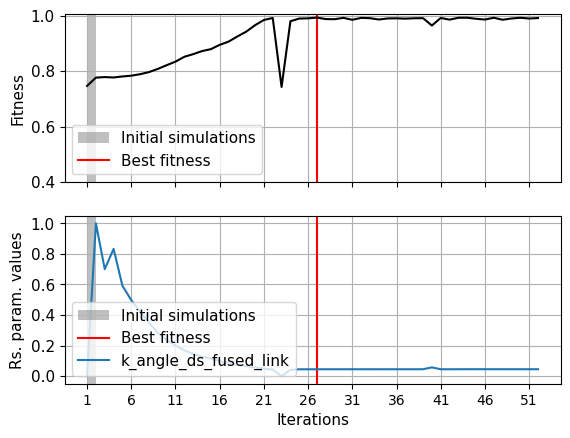

In [32]:
for index, row in df_t3.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    #ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower left",prop={'size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_3[df_var_params_3["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'size': 11})
    ax2.grid()
    
    #Grafik als PNG speichern
    output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
    filename = f"{output_dir}/sim_bm_opt_1_fitness.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    
    
    plt.show()

    

y_centre_1 #
y_base_arm_a_1 #
y_arm_a_1 #
y_link_a_1 #
y_base_arm_b_1 #
y_arm_b_1y_centre_1  ##

y_link_fused_b_1y_base_arm_a_1  ##

y_base_arm_c_1y_arm_a_1  ##

y_arm_c_1y_link_a_1y_centre_1  # #
#
y_link_c_1
y_base_arm_b_1 y_base_arm_a_1 # #
#
y_centre_1
y_arm_b_1 y_arm_a_1 # #
#
y_base_arm_a_1
y_link_fused_b_1 y_link_a_1 # #

#y_arm_a_1y_base_arm_c_1
 y_base_arm_b_1 # #
#
y_link_a_1
 y_arm_c_1y_arm_b_1#  
##y_base_arm_b_1

 y_link_fused_b_1y_link_c_1#  #
#
y_arm_b_1
y_base_arm_c_1 y_centre_1y_centre_1 #  #
##
y_link_b_1

y_arm_c_1 y_base_arm_a_1y_base_arm_a_1#   #
##

y_base_arm_c_1
y_link_c_1y_arm_a_1y_arm_a_1    ##
##

y_arm_c_1
y_centre_1 y_link_a_1y_link_a_1 #  #
##
y_centre_1y_link_fused_c_1

y_base_arm_a_1 y_base_arm_b_1y_base_arm_b_1  #  ##
##



y_arm_a_1y_base_arm_a_1y_arm_b_1y_arm_b_1    ####



y_arm_a_1y_link_a_1y_link_fused_b_1y_link_b_1    ####



y_base_arm_b_1y_link_a_1y_base_arm_c_1y_base_arm_c_1    ####



y_base_arm_b_1y_arm_b_1y_arm_c_1y_arm_c_1    ####



y_arm_

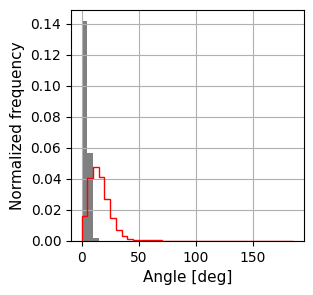

###########################
###########################
###########################
y_centre_1y_centre_1  ##

y_base_arm_a_1y_base_arm_a_1  ##
y_arm_a_1
 y_arm_a_1# 
#y_link_a_1
 y_link_a_1# 
#y_base_arm_b_1
 y_base_arm_b_1# 
#y_arm_b_1
 y_arm_b_1# 
#y_link_fused_b_1
 y_link_fused_b_1 ##

y_base_arm_c_1y_base_arm_c_1  ##
y_arm_c_1
 y_arm_c_1# #

y_link_c_1y_link_c_1  ##

y_centre_1y_centre_1  ##

y_base_arm_a_1y_base_arm_a_1  ##

y_arm_a_1y_arm_a_1  ##

y_centre_1y_link_a_1y_centre_1y_link_a_1    ####



y_base_arm_b_1y_base_arm_a_1y_base_arm_b_1y_base_arm_a_1    ####



y_arm_b_1y_arm_a_1y_arm_b_1y_arm_a_1    ####



y_centre_1y_link_a_1y_link_b_1y_link_b_1y_link_a_1     ####
#



y_base_arm_a_1y_base_arm_b_1y_base_arm_c_1y_base_arm_c_1 y_base_arm_b_1   # ####



y_arm_a_1
y_arm_c_1y_arm_c_1y_arm_b_1 y_arm_b_1   # ###
#


y_link_a_1
y_link_fused_c_1y_link_fused_c_1y_link_fused_b_1 y_link_fused_b_1   # ###
#


y_base_arm_b_1
y_base_arm_c_1 y_base_arm_c_1 # #
#
y_arm_b_1
y_arm_c_1 y_arm

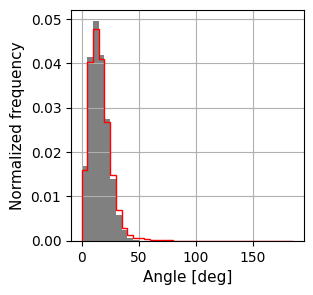

###########################
###########################
###########################
CPU times: user 1.45 s, sys: 2.62 s, total: 4.07 s
Wall time: 3.04 s


In [33]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"

names_ini1="sim_bm_opt_1_"
names_angle_eval=[[names_ini1+str(l+10)+".h5" for l in range(5)],
                  [names_ini1+str(l+245)+".h5" for l in range(5)]]

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[4]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontsize=11)
    ax1.grid()
    
    output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
    angle_name = names_angles[j].lower().replace(" ", "_") 
    filename = f"{output_dir}/{names_ini1}angle_dist_{i}_{angle_name}.png"

    plt.savefig(filename, dpi=300, bbox_inches='tight')
            
    plt.show()
  
    print("###########################")
    print("###########################")
    print("###########################")



# Save optimized parameters

In [34]:
#create dictionary with all updated parameters
dict_opt_params_all_steps={}
dict_opt_rs_params_all_steps={}

dict_opt_params_all_steps.update(dict_opt_params_step_1)
dict_opt_params_all_steps.update(dict_opt_params_step_2)
dict_opt_params_all_steps.update(dict_opt_params_step_3)

dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_1)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_2)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_3)

print(dict_opt_params_all_steps)
print("#############")
print("#############")
print(dict_opt_rs_params_all_steps)

{'k_angle_ds_base': 1e-20, 'theta_base_x': 2.6179938779914944, 'k_angle_ds_arm': 3.454938111838066e-19, 'k_angle_ss_link': 1.770110254417513e-20, 'k_angle_ds_hp': 4.8198598506330516e-20, 'k_angle_ds_fused_link': 4.465587361488086e-20}
#############
#############
{'k_angle_ds_base_rs': 1e-20, 'theta_base_x_rs': 2.6179938779914944, 'k_angle_ds_arm_rs': 3.454938111838066e-19, 'k_angle_ss_link_rs': 1.770110254417513e-20, 'k_angle_ds_hp_rs': 4.8198598506330516e-20, 'k_angle_ds_fused_link_rs': 4.465587361488086e-20}


In [35]:
# save optimal paramters 

with open('/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/optimal_params_2.pkl', 'wb') as file:
    pickle.dump(dict_opt_params_all_steps, file)
    
with open('/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/optimal_rs_params_2.pkl', 'wb') as file:
    pickle.dump(dict_opt_rs_params_all_steps, file)

# Fitness evolution

## base

Parameter set 0


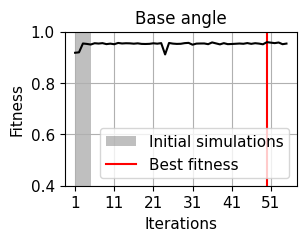

In [61]:
for index, row in df_t1.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=10
    init_sim_range=5
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    #ax1.set_xticks([5,50],[5,50],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower right",prop={'size': 11})
    ax1.set_title("Base angle", fontsize=12)
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


## arm axis

Parameter set 0


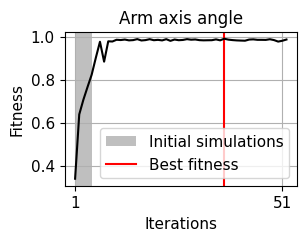

In [62]:
for index, row in df_t2.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=50
    init_sim_range=5
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    #ax1.set_xticks([5,10],[5,10],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower right",prop={'size': 11})
    ax1.set_title("Arm axis angle", fontsize=12)
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


## HP sticky end

Parameter set 0


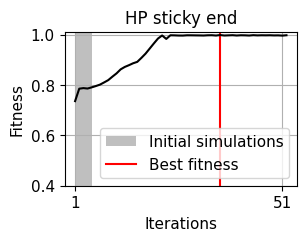

In [63]:
for index, row in df_t3.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=50
    init_sim_range=5
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    #ax1.set_xticks([5,10],[5,10],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower right",prop={'size': 11})
    ax1.set_title("HP sticky end", fontsize=12)
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


## non hp sticky end

Parameter set 0


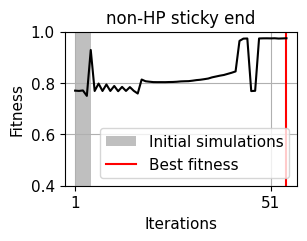

In [64]:
for index, row in df_t4.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=50
    init_sim_range=5
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    #ax1.set_xticks([5,10],[5,10],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower right",prop={'size': 11})
    ax1.set_title("non-HP sticky end", fontsize=12)
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


## bound arms

Parameter set 0


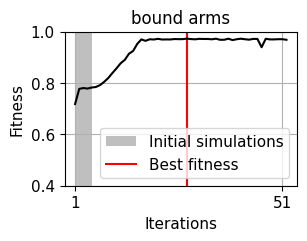

In [65]:
for index, row in df_t5.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=50
    init_sim_range=5
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontsize=11)
    ax1.set_xlabel("Iterations",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontsize=11)
    #ax1.set_xticks([5,10],[5,10],fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontsize=11)
    ax1.legend(loc="lower right",prop={'size': 11})
    ax1.set_title("bound arms", fontsize=12)
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


# Comparing fitness

['sim_ba_opt_1_245.h5']
Fitness base: 0.9476652879026688
['sim_ba_opt_1_246.h5']
Fitness base: 0.9585724325609197
['sim_ba_opt_1_247.h5']
Fitness base: 0.9567963834349804
['sim_ba_opt_1_248.h5']
Fitness base: 0.9557943706859631
['sim_ba_opt_1_249.h5']
Fitness base: 0.9605560286272815


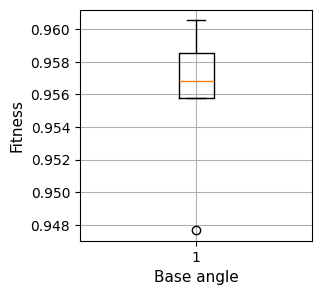

###########################
###########################
###########################


In [67]:
folder_names_angle_eval = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
names_ini1 = "sim_ba_opt_1_"
names_angle_eval = [names_ini1 + str(l + 245) + ".h5" for l in range(5)]
names_angles = ["Base angle"]

# Process the angles
fitness_base_list=[]
for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1, values_angle_base_ex_1= cg_angle_distr_1_1_ba(
        folder=folder_names_angle_eval,
        names_sim_repeat=[names_angle_eval[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])
    
    # List of angles to be evaluated
    list_angles_eval = [values_angle_base_ex_1]

    # Calculate and print fitness for the base angle
    fitness_base = gt_1_1(base_angle_distr_ex_1, base_angle_distr_target)
    print("Fitness base:", fitness_base)
    fitness_base_list.append(fitness_base)

    # Generate boxplot for the base angle
fig, ax = plt.subplots(figsize=(3, 3))
ax.boxplot(fitness_base_list)  # Convert to degrees
ax.set_ylabel("Fitness", fontsize=11)
ax.set_xlabel("Base angle", fontsize=11)
ax.grid()
plt.show()

print("###########################")
print("###########################")
print("###########################")

['sim_aa_opt_1_245.h5']
Fitness arm axis: 0.9811335579723143
['sim_aa_opt_1_246.h5']
Fitness arm axis: 0.9776778666301729
['sim_aa_opt_1_247.h5']
Fitness arm axis: 0.9635893523454309
['sim_aa_opt_1_248.h5']
Fitness arm axis: 0.9678899647718918
['sim_aa_opt_1_249.h5']
Fitness arm axis: 0.9751961303335301


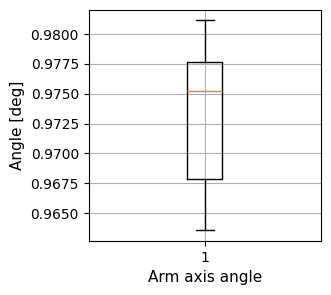

###########################
###########################
###########################


In [68]:
folder_names_angle_eval = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
names_ini1 = "sim_aa_opt_1_"
names_angle_eval = [names_ini1 + str(l + 245) + ".h5" for l in range(5)] # 96
names_angles = ["Arm axis angle"]

# Process the angles
fitness_arm_axis_list=[]
for i in range(len(names_angle_eval)):
    arm_axis_angle_distr_ex_1, values_angle_arm_axis_ex_1= cg_angle_distr_1_1_aa(
        folder=folder_names_angle_eval,
        names_sim_repeat=[names_angle_eval[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])

    # List of angles to be evaluated
    list_angles_eval = [values_angle_arm_axis_ex_1]

    # Calculate and print fitness for the arm_axis angle
    fitness_arm_axis = gt_1_1(arm_axis_angle_distr_ex_1, arm_axis_angle_distr_target)
    print("Fitness arm axis:", fitness_arm_axis)
    fitness_arm_axis_list.append(fitness_arm_axis)

# Generate boxplot for the arm_axis angle
fig, ax = plt.subplots(figsize=(3, 3))
ax.boxplot(fitness_arm_axis_list)
ax.set_ylabel("Angle [deg]", fontsize=11)
ax.set_xlabel("Arm axis angle", fontsize=11)
ax.grid()
plt.show()

print("###########################")
print("###########################")
print("###########################")

erst aa, dann ba

['sim_aa_opt_1_245.h5']
Fitness base: 0.8937901670170034
['sim_aa_opt_1_246.h5']
Fitness base: 0.9147933289162902
['sim_aa_opt_1_247.h5']
Fitness base: 0.9123103640297595
['sim_aa_opt_1_248.h5']
Fitness base: 0.9307008049187109
['sim_aa_opt_1_249.h5']
Fitness base: 0.9021244855042647
['sim_aa_opt_1_245.h5']
Fitness arm axis: 0.9733679996396485
['sim_aa_opt_1_246.h5']
Fitness arm axis: 0.9766766169684422
['sim_aa_opt_1_247.h5']
Fitness arm axis: 0.9800188809495495
['sim_aa_opt_1_248.h5']
Fitness arm axis: 0.9746234790312394
['sim_aa_opt_1_249.h5']
Fitness arm axis: 0.9845403702523805


/tmp/ipykernel_211591/3406967331.py:53: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Base angle", "Arm axis angle", "Average fitness"])


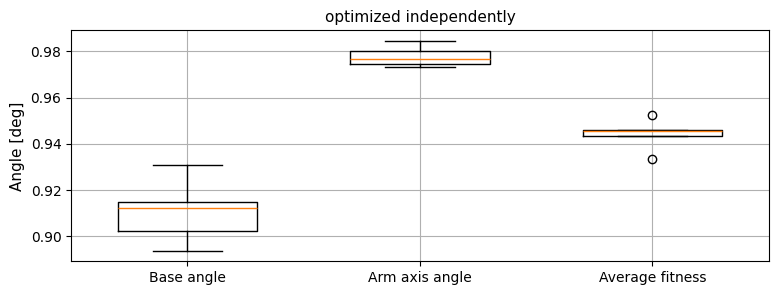

In [84]:
# Define the necessary variables and parameters
folder_names_angle_eval_ba = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
folder_names_angle_eval_aa = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
names_ini1_ba = "sim_ba_seq_opt_1_"
names_ini1_aa = "sim_aa_seq_opt_1_"
names_angle_eval_ba = [names_ini1_ba + str(l + 245) + ".h5" for l in range(5)]
names_angle_eval_aa = [names_ini1_aa + str(l + 245) + ".h5" for l in range(5)]

# Initialize lists to store fitness scores
fitness_base_list = []
fitness_arm_axis_list = []

# Process the base angles
for i in range(len(names_angle_eval_ba)):
    base_angle_distr_ex_1, values_angle_base_ex_1 = cg_angle_distr_1_1_ba(
        folder=folder_names_angle_eval_ba,
        names_sim_repeat=[names_angle_eval_ba[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])
    
    # Calculate and store fitness for the base angle
    fitness_base = gt_1_1(base_angle_distr_ex_1, base_angle_distr_target)
    fitness_base_list.append(fitness_base)
    print("Fitness base:", fitness_base)

# Process the arm axis angles
for i in range(len(names_angle_eval_aa)):
    arm_axis_angle_distr_ex_1, values_angle_arm_axis_ex_1 = cg_angle_distr_1_1_aa(
        folder=folder_names_angle_eval_aa,
        names_sim_repeat=[names_angle_eval_aa[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])

    # Calculate and store fitness for the arm axis angle
    fitness_arm_axis = gt_1_1(arm_axis_angle_distr_ex_1, arm_axis_angle_distr_target)
    fitness_arm_axis_list.append(fitness_arm_axis)
    print("Fitness arm axis:", fitness_arm_axis)

# Calculate the average fitness score
average_fitness_scores = ( np.array(fitness_base_list) + np.array(fitness_arm_axis_list) ) / 2

# Generiere Boxplots
fig, ax = plt.subplots(figsize=(9, 3))
ax.set_title("optimized independently", fontsize=11)
ax.set_ylabel("Angle [deg]", fontsize=11)
#ax.set_xticks([1, 2, 3])
ax.set_xticklabels(["Base angle", "Arm axis angle", "Average fitness"])
ax.grid()

# Boxplot base angle
ax.boxplot(fitness_base_list, positions=[1], widths=0.6)

# Boxplot arm axis
ax.boxplot(fitness_arm_axis_list, positions=[2], widths=0.6)

# Boxplot average
ax.boxplot(average_fitness_scores, positions=[3], widths=0.6)

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/output_graphics/"
filename = f"{output_dir}/opt_indep_aa_ba.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')

plt.show()

erst ba, dann aa

['sim_aa_opt_1_245.h5']
Fitness base: 0.9476652879026688
['sim_aa_opt_1_246.h5']
Fitness base: 0.9585724325609197
['sim_aa_opt_1_247.h5']
Fitness base: 0.9567963834349804
['sim_aa_opt_1_248.h5']
Fitness base: 0.9557943706859631
['sim_aa_opt_1_249.h5']
Fitness base: 0.9605560286272815
['sim_aa_opt_1_245.h5']
Fitness arm axis: 0.9811335579723143
['sim_aa_opt_1_246.h5']
Fitness arm axis: 0.9776778666301729
['sim_aa_opt_1_247.h5']
Fitness arm axis: 0.9635893523454309
['sim_aa_opt_1_248.h5']
Fitness arm axis: 0.9678899647718918
['sim_aa_opt_1_249.h5']
Fitness arm axis: 0.9751961303335301


/tmp/ipykernel_211591/2446551884.py:53: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Base angle", "Arm axis angle", "Average fitness"])


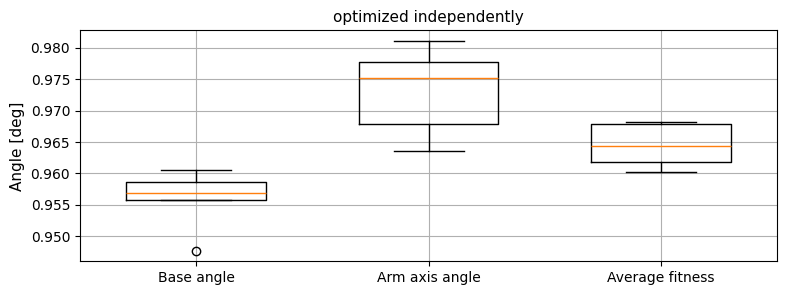

In [82]:
# Define the necessary variables and parameters
folder_names_angle_eval_ba = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
folder_names_angle_eval_aa = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
names_ini1_ba = "sim_ba_opt_1_"
names_ini1_aa = "sim_aa_opt_1_"
names_angle_eval_ba = [names_ini1_ba + str(l + 245) + ".h5" for l in range(5)]
names_angle_eval_aa = [names_ini1_aa + str(l + 245) + ".h5" for l in range(5)]

# Initialize lists to store fitness scores
fitness_base_list = []
fitness_arm_axis_list = []

# Process the base angles
for i in range(len(names_angle_eval_ba)):
    base_angle_distr_ex_1, values_angle_base_ex_1 = cg_angle_distr_1_1_ba(
        folder=folder_names_angle_eval_ba,
        names_sim_repeat=[names_angle_eval_ba[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])
    
    # Calculate and store fitness for the base angle
    fitness_base = gt_1_1(base_angle_distr_ex_1, base_angle_distr_target)
    fitness_base_list.append(fitness_base)
    print("Fitness base:", fitness_base)

# Process the arm axis angles
for i in range(len(names_angle_eval_aa)):
    arm_axis_angle_distr_ex_1, values_angle_arm_axis_ex_1 = cg_angle_distr_1_1_aa(
        folder=folder_names_angle_eval_aa,
        names_sim_repeat=[names_angle_eval_aa[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])

    # Calculate and store fitness for the arm axis angle
    fitness_arm_axis = gt_1_1(arm_axis_angle_distr_ex_1, arm_axis_angle_distr_target)
    fitness_arm_axis_list.append(fitness_arm_axis)
    print("Fitness arm axis:", fitness_arm_axis)

# Calculate the average fitness score
average_fitness_scores = ( np.array(fitness_base_list) + np.array(fitness_arm_axis_list) ) / 2

# Generiere Boxplots
fig, ax = plt.subplots(figsize=(9, 3))
ax.set_title("optimized independently", fontsize=11)
ax.set_ylabel("Angle [deg]", fontsize=11)
#ax.set_xticks([1, 2, 3])
ax.set_xticklabels(["Base angle", "Arm axis angle", "Average fitness"])
ax.grid()

# Boxplot base angle
ax.boxplot(fitness_base_list, positions=[1], widths=0.6)

# Boxplot arm axis
ax.boxplot(fitness_arm_axis_list, positions=[2], widths=0.6)

# Boxplot average
ax.boxplot(average_fitness_scores, positions=[3], widths=0.6)

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/output_graphics/"
filename = f"{output_dir}/opt_indep_ba_aa.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')

plt.show()

ba + aa

['sim_aa_opt_1_245.h5']
Fitness base: 0.907565447314935
['sim_aa_opt_1_246.h5']
Fitness base: 0.9092209812597006
['sim_aa_opt_1_247.h5']
Fitness base: 0.9240185450965778
['sim_aa_opt_1_248.h5']
Fitness base: 0.9131196405828915
['sim_aa_opt_1_249.h5']
Fitness base: 0.9295518307857144
['sim_aa_opt_1_245.h5']
Fitness arm axis: 0.969064702928971
['sim_aa_opt_1_246.h5']
Fitness arm axis: 0.9677606952212219
['sim_aa_opt_1_247.h5']
Fitness arm axis: 0.9796132729154037
['sim_aa_opt_1_248.h5']
Fitness arm axis: 0.9827815668808435
['sim_aa_opt_1_249.h5']
Fitness arm axis: 0.980775252367347


/tmp/ipykernel_211591/4163285171.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Base angle", "Arm axis angle", "Average fitness"])


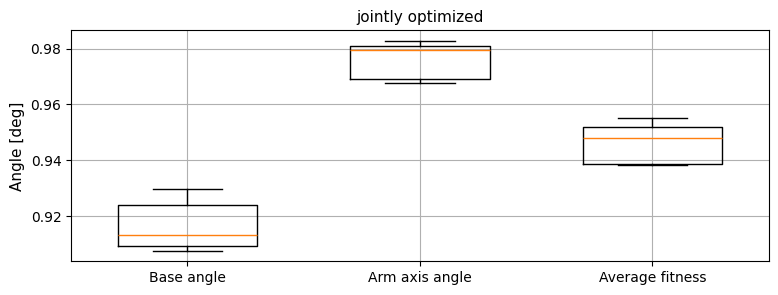

In [83]:
# Define the necessary variables and parameters
folder_names_angle_eval_ba_aa = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/"
names_ini1_ba_aa = "sim_ba_aa_seq_opt_1_"

names_angle_eval_ba = [names_ini1_ba_aa + str(l + 245) + ".h5" for l in range(5)]
names_angle_eval_aa = [names_ini1_ba_aa + str(l + 245) + ".h5" for l in range(5)]

# Initialize lists to store fitness scores
fitness_base_list = []
fitness_arm_axis_list = []

# Process the base angles
for i in range(len(names_angle_eval_ba)):
    base_angle_distr_ex_1, values_angle_base_ex_1 = cg_angle_distr_1_1_ba(
        folder=folder_names_angle_eval_ba_aa,
        names_sim_repeat=[names_angle_eval_ba[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])
    
    # Calculate and store fitness for the base angle
    fitness_base = gt_1_1(base_angle_distr_ex_1, base_angle_distr_target)
    fitness_base_list.append(fitness_base)
    print("Fitness base:", fitness_base)

# Process the arm axis angles
for i in range(len(names_angle_eval_aa)):
    arm_axis_angle_distr_ex_1, values_angle_arm_axis_ex_1 = cg_angle_distr_1_1_aa(
        folder=folder_names_angle_eval_ba_aa,
        names_sim_repeat=[names_angle_eval_aa[i]],
        t_skip=300,
        t_lim=None,
        t_step=1
    )
    print([names_angle_eval[i]])
    
    # Calculate and store fitness for the arm axis angle
    fitness_arm_axis = gt_1_1(arm_axis_angle_distr_ex_1, arm_axis_angle_distr_target)
    fitness_arm_axis_list.append(fitness_arm_axis)
    print("Fitness arm axis:", fitness_arm_axis)

# Calculate the average fitness score
average_fitness_scores = ( np.array(fitness_base_list) + np.array(fitness_arm_axis_list) ) / 2

# Generiere Boxplots
fig, ax = plt.subplots(figsize=(9, 3))
ax.set_title("jointly optimized", fontsize=11)
ax.set_ylabel("Angle [deg]", fontsize=11)
#ax.set_xticks([1, 2, 3])
ax.set_xticklabels(["Base angle", "Arm axis angle", "Average fitness"])
ax.grid()

# Boxplot base angle
ax.boxplot(fitness_base_list, positions=[1], widths=0.6)

# Boxplot arm axis
ax.boxplot(fitness_arm_axis_list, positions=[2], widths=0.6)

# Boxplot average
ax.boxplot(average_fitness_scores, positions=[3], widths=0.6)

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/output_graphics/"
filename = f"{output_dir}/opt_joint_ba_aa.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')

plt.show()



# Run simulation with optimzed parameters


## base, arm axis, link

In [36]:
#copy of sim params
run_sim_1_input_opt_1=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_1.update(dict_opt_params_all_steps)

In [37]:
run_sim_1_input_opt_1["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
run_sim_1_input_opt_1["name"]="y_opt_short_1_"
run_sim_1_input_opt_1["add_num_1"]=0

In [38]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input_opt_1.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:32<00:00, 15225.18it/s]


Fitness arm axis: 0.9813728111061235
Fitness base: 0.8973549665622874
Fitness link: 0.9746362655690324
Base angle


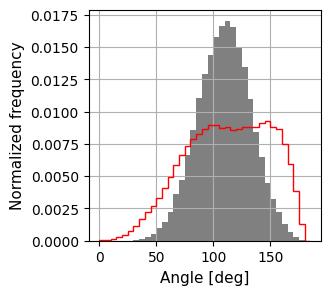

Link angle


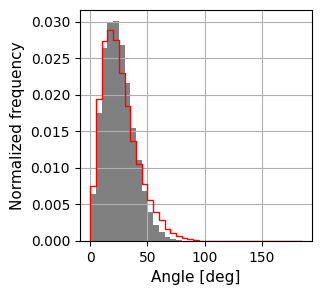

Arm axis angle


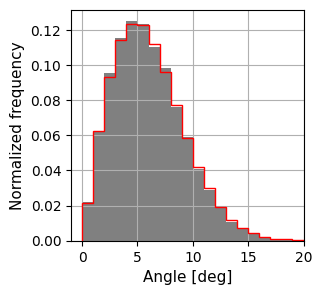

###########################
###########################
###########################
CPU times: user 862 ms, sys: 1.34 s, total: 2.2 s
Wall time: 2.63 s


In [39]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"

names_ini1="y_opt_short_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]] #96

names_angles=["Base angle", "Link angle","Arm axis angle"]
for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1=cg_angle_distr_1_3_ba_aa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1]
    
    print("Fitness arm axis:", gt_1_1(arm_axis_angle_distr_ex_1,arm_axis_angle_distr_target))
    print("Fitness base:", gt_1_1(base_angle_distr_ex_1,base_angle_distr_target))
    print("Fitness link:", gt_1_1(link_angle_distr_ex_1,link_angle_distr_target))
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")

## hp angle

In [40]:
#copy of sim params
run_sim_1_input_opt_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_2.update(dict_opt_params_all_steps)

In [41]:
run_sim_1_input_opt_2["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
run_sim_1_input_opt_2["name"]="y_opt_short_hp_1_"
run_sim_1_input_opt_2["add_num_1"]=0
run_sim_1_input_opt_2["use_y_1_HP_template"]=True

In [42]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input_opt_2.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:33<00:00, 14969.68it/s]


Link HP angle
Fitness hp: 0.9974879970325184


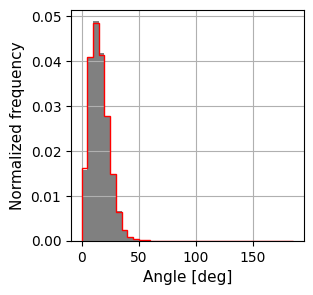

###########################
###########################
###########################
CPU times: user 261 ms, sys: 1.06 s, total: 1.32 s
Wall time: 2.24 s


In [43]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"

names_ini1="y_opt_short_hp_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]]

names_angles="Link HP angle"
for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_1_1_hp(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[3]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    print("Fitness hp:",gt_1_1(sel_angle_distr,sel_target_angle_distr))
    ax1.set_ylabel("Normalized frequency",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


## bound arm angles

In [44]:
#copy of sim params
run_sim_1_input_opt_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_3.update(dict_opt_params_all_steps)

In [45]:
run_sim_1_input_opt_3["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
run_sim_1_input_opt_3["name"]="y_opt_short_bm_1_"
run_sim_1_input_opt_3["add_num_1"]=0
run_sim_1_input_opt_3["checkpoint_path"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/checkpoint_bm/"


In [46]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input_opt_3.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (40, 40, 40)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:47<00:00, 10449.81it/s]


y_centre_1y_centre_1  ##

y_base_arm_a_1y_base_arm_a_1  ##

y_arm_a_1y_arm_a_1  ##

y_link_a_1y_link_a_1  ##y_centre_1

y_base_arm_b_1 y_base_arm_b_1 # #
#
y_base_arm_a_1
y_arm_b_1 y_arm_b_1 # #
#
y_arm_a_1
y_link_fused_b_1y_link_fused_b_1   ##
#

y_link_a_1y_base_arm_c_1y_base_arm_c_1  # #y_centre_1#

 
y_base_arm_b_1y_arm_c_1#y_arm_c_1  
# #y_base_arm_a_1#

 y_arm_b_1
y_link_c_1# y_link_c_1 
# y_arm_a_1#
 #
y_link_fused_b_1#
y_centre_1 
y_centre_1 #y_link_a_1# 
 
#y_base_arm_c_1#y_base_arm_a_1 

 #y_base_arm_a_1y_base_arm_b_1#
  
y_arm_c_1##y_arm_a_1 

 #y_arm_b_1#y_arm_a_1
 
 y_link_c_1y_link_a_1##y_centre_1 
 
# y_link_fused_b_1#y_link_a_1
# 
 y_centre_1
y_base_arm_b_1##y_base_arm_a_1  
 
##y_base_arm_c_1#y_base_arm_b_1

  
y_base_arm_a_1y_arm_b_1##y_arm_a_1  
 ##
y_arm_c_1#

y_arm_b_1 
y_arm_a_1 y_link_b_1#y_link_a_1 # 
 #
#y_link_c_1#
y_link_b_1 

y_link_a_1 #y_base_arm_c_1y_base_arm_b_1 #
  #
y_centre_1##
y_base_arm_c_1 

y_base_arm_b_1# y_arm_c_1y_arm_b_1 #
  #
y_base_arm_a_1##

IndexError: list index out of range

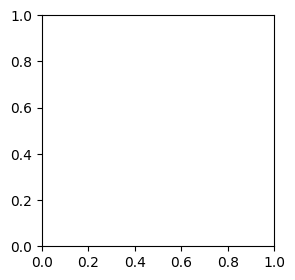

In [47]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"

names_ini1="y_opt_short_bm_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]]

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[5]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    print("Fitness ba:",gt_1_1(sel_angle_distr,sel_target_angle_distr))
    ax1.set_ylabel("Normalized frequency",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Compare optimized and unoptimized simulations

## Arm axis angle

CPU times: user 643 ms, sys: 1.23 s, total: 1.88 s
Wall time: 4.59 s


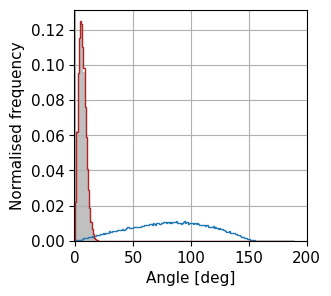

In [13]:
%%time
#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1="sim_ba_aa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_opt1="y_opt_short_1_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","firebrick"]
names_l=["First prediction","Optimised"]

fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_arm_axis_target*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',ls="-",color="silver",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1=cg_angle_distr_1_3_ba_aa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1]

    sel_angle_distr=ax1.hist(values_angle_arm_axis_ex_1*180/np.pi,bins=np.arange(0,190,1),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


plt.xlim(-1,200)
#ax1.legend(loc="upper right",prop={'size': 11})
ax1.set_ylabel("Normalised frequency",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontsize=11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

ax1.grid()

#Grafik als PNG speichern
output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
filename = f"{output_dir}/compare_sim_opt_unopt_aa_1.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_arm_axis_angle_3.pdf",format="pdf",bbox_inches="tight")



## Base angle

CPU times: user 454 ms, sys: 1.19 s, total: 1.64 s
Wall time: 4.61 s


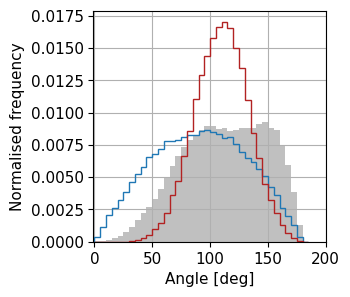

In [14]:
%%time
#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1="sim_ba_aa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_opt1="y_opt_short_1_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","firebrick"]
names_l=["First prediction","Optimised"]

fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="silver",label="Target")[0]


for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1=cg_angle_distr_1_3_ba_aa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1]

    sel_angle_distr=ax1.hist(values_angle_base_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]

plt.xlim(-1,200)
#ax1.legend(loc="lower center",prop={'size': 11})
ax1.set_ylabel("Normalised frequency",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontsize=11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
ax1.grid()

#Grafik als PNG speichern
output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
filename = f"{output_dir}/compare_sim_opt_unopt_ba_1.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_base_angle_3.pdf",format="pdf",bbox_inches="tight")




## Link angle

CPU times: user 371 ms, sys: 1.22 s, total: 1.6 s
Wall time: 4.3 s


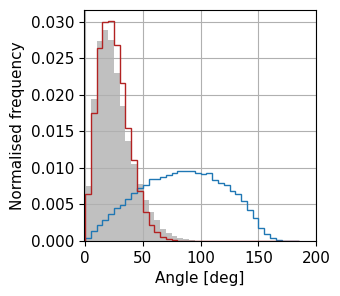

In [15]:
%%time
#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1="sim_ba_aa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_opt1="y_opt_short_1_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","firebrick"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_link_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="silver",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1=cg_angle_distr_1_3_ba_aa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1]

    sel_angle_distr=ax1.hist(values_angle_link_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]


plt.xlim(-1,200)
#ax1.legend(loc="upper right",prop={'size': 11})
ax1.set_ylabel("Normalised frequency",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontsize=11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
ax1.grid()

#Grafik als PNG speichern
output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
filename = f"{output_dir}/compare_sim_opt_unopt_la_1.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_link_angle_3.pdf",format="pdf",bbox_inches="tight")



## HP link angle

CPU times: user 373 ms, sys: 1.14 s, total: 1.51 s
Wall time: 1.91 s


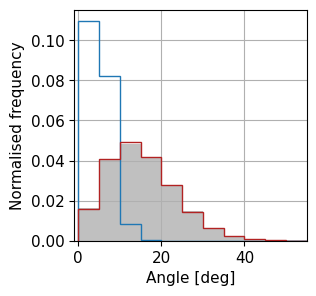

In [16]:
%%time

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1="sim_hp_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_opt1="y_opt_short_hp_1_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","firebrick"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_link_HP_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="silver",label="Target")[0]

for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_1_1_hp(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)

    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


plt.xlim(-1,55)
#ax1.legend(loc="upper right",prop={'size': 11})
ax1.set_ylabel("Normalised frequency",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontsize=11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
ax1.grid()

#Grafik als PNG speichern
output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
filename = f"{output_dir}/compare_sim_opt_unopt_hp_1.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_HP_link_angle_3.pdf",format="pdf",bbox_inches="tight")



## bound arms angle

y_centre_1 #
y_base_arm_a_1y_centre_1  #y_centre_1#

 y_arm_a_1y_base_arm_a_1#  
##y_base_arm_a_1

 y_link_a_1#y_arm_a_1 
 #y_arm_a_1#
 
y_centre_1#y_base_arm_b_1y_link_a_1  
 #y_link_a_1##
 

y_base_arm_a_1#y_arm_b_1 y_base_arm_b_1 
 ##y_base_arm_b_1#


 y_arm_a_1y_link_fused_b_1#y_arm_b_1  
 ##y_arm_b_1
#
 y_link_a_1
y_base_arm_c_1# y_link_fused_b_1 
# #y_link_fused_b_1
# 
y_base_arm_b_1
#y_arm_c_1y_centre_1 y_base_arm_c_1
#   
y_base_arm_c_1###y_arm_b_1 


 #y_base_arm_a_1y_link_c_1y_arm_c_1#
   
y_arm_c_1##y_link_fused_b_1# 

 
#y_centre_1y_arm_a_1#y_link_c_1
  
y_link_c_1 ## y_base_arm_c_1#

# 
y_base_arm_a_1y_link_a_1
y_centre_1#   y_centre_1
### y_arm_c_1

 #
y_base_arm_b_1y_arm_a_1#
y_base_arm_a_1  y_base_arm_a_1
 ## y_link_c_1#

# 
y_arm_b_1y_link_a_1#
y_arm_a_1  
y_arm_a_1 ##y_centre_1 #

 
#y_link_fused_b_1y_base_arm_b_1#y_link_a_1
  
 y_link_a_1##y_base_arm_a_1# 

 
##y_base_arm_c_1y_arm_b_1y_base_arm_b_1
 
 y_base_arm_b_1 ##y_arm_a_1 #
 

#y_arm_c_1#y_link_b_1
 y_arm_b_1
 

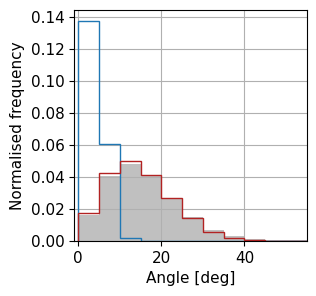

In [17]:
%%time

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1="sim_bm_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_opt1="y_opt_short_bm_1_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","firebrick"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_ds_fused_link_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="silver",label="Target")[0]

for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)

    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


plt.xlim(-1,55)
#ax1.legend(loc="upper right",prop={'size': 11})
ax1.set_ylabel("Normalised frequency",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontsize=11)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
ax1.grid()

#Grafik als PNG speichern
output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/graphics/"
filename = f"{output_dir}/compare_sim_opt_unopt_bm_1.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_bound_arms_angle_3.pdf",format="pdf",bbox_inches="tight")



# Wasserstein-Test

## ba, aa, la

In [12]:
# Ordner und Dateinamen
folder_names_angle_eval = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1 = "y_opt_short_1_"
names_angle_eval = [[names_ini1 + str(l + 0) + ".h5" for l in range(5)]]  # Simulationen

names_angles = ["Base angle", "Link angle", "Arm axis angle"]

# Zielwinkel (in Grad)
target_angles_deg = [arr * 180 / np.pi for arr in list_values_target_angles_1]

for i in range(len(names_angle_eval)):
    # Simulationen laden
    base_angle_distr_ex_1, link_angle_distr_ex_1, arm_axis_angle_distr_ex_1, \
    values_angle_base_ex_1, values_angle_link_ex_1, values_angle_arm_axis_ex_1 = \
        cg_angle_distr_1_3_ba_aa_la(folder=folder_names_angle_eval,
                                    names_sim_repeat=names_angle_eval[i],
                                    t_skip=300,
                                    t_lim=None,
                                    t_step=1)

    # Liste der Simulationswinkel (in Grad)
    list_angles_eval = [values_angle_base_ex_1, values_angle_link_ex_1, values_angle_arm_axis_ex_1]
    list_angles_eval_deg = [a * 180 / np.pi for a in list_angles_eval]

    # Histogramm-basierte Fitness-Werte berechnen
    fitness_values = [
        gt_1_1(base_angle_distr_ex_1, base_angle_distr_target),
        gt_1_1(link_angle_distr_ex_1, link_angle_distr_target),
        gt_1_1(arm_axis_angle_distr_ex_1, arm_axis_angle_distr_target)
    ]

    # Wasserstein-Distanzen berechnen und beides ausgeben
    print("===== Evaluation Distribution Distanz =====")
    for j in range(3):
        w_dist = wasserstein_distance(target_angles_deg[j], list_angles_eval_deg[j])
        print(f"{names_angles[j]}:")
        print(f"  Fitness-Wert:         {fitness_values[j]:.6f}")
        print(f"  Wasserstein-Distanz:  {w_dist:.6f} Grad")
    print("===========================================")


===== Evaluation Distribution Distanz =====
Base angle:
  Fitness-Wert:         0.897355
  Wasserstein-Distanz:  12.055743 Grad
Link angle:
  Fitness-Wert:         0.974636
  Wasserstein-Distanz:  1.640459 Grad
Arm axis angle:
  Fitness-Wert:         0.981373
  Wasserstein-Distanz:  0.060976 Grad


## hp

In [14]:
# Ordner und Dateinamen
folder_names_angle_eval = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1 = "y_opt_short_hp_1_"

# Zwei Simulationssets
names_angle_eval = [[names_ini1 + str(l + 0) + ".h5" for l in range(5)]]

names_angle = "Link HP angle"
target_vals_deg = list_values_target_angles_1[3] * 180 / np.pi  # Zielwinkel (in Grad)

for i in range(len(names_angle_eval)):
    # Simulationsdaten laden
    link_angle_distr_ex_1, values_angle_link_ex1 = cg_angle_distr_1_1_hp(
        folder=folder_names_angle_eval,
        names_sim_repeat=names_angle_eval[i],
        t_skip=300,
        t_lim=None,
        t_step=1
    )

    sim_vals_deg = values_angle_link_ex1 * 180 / np.pi

    # Fitness-Wert (histogrammbasierter Vergleich)
    fitness_val = gt_1_1(link_angle_distr_ex_1, link_angle_distr_target)

    # Wasserstein-Distanz (stetige Verteilung)
    w_dist = wasserstein_distance(target_vals_deg, sim_vals_deg)

    # Ausgabe
    print("===== Evaluation Distribution Distanz =====")
    print(f"{names_angle}:")
    print(f"  Fitness-Wert:         {fitness_val:.6f}")
    print(f"  Wasserstein-Distanz:  {w_dist:.6f} Grad")
    print("===========================================")

===== Evaluation Distribution Distanz =====
Link HP angle:
  Fitness-Wert:         0.885135
  Wasserstein-Distanz:  0.155931 Grad


## bm

In [15]:
# Ordner und Dateinamen
folder_names_angle_eval = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/15-07_bay_opt/comb/"
names_ini1 = "y_opt_short_bm_1_"

# Zwei Simulationssets
names_angle_eval = [[names_ini1 + str(l + 0) + ".h5" for l in range(5)]]

names_angle = "Bound motifs angle"
target_vals_deg = list_values_target_angles_1[4] * 180 / np.pi  # Zielwinkel in Grad

for i in range(len(names_angle_eval)):
    # Simulationsdaten laden
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1 = cg_angle_distr_1_1_bm(
        folder=folder_names_angle_eval,
        names_sim_repeat=names_angle_eval[i],
        t_skip=300,
        t_lim=None,
        t_step=1
    )

    sim_vals_deg = values_angle_ds_fused_link_ex1 * 180 / np.pi

    # Fitness-Wert (Histogrammvergleich)
    fitness_val = gt_1_1(angle_ds_fused_link_distr_ex_1, angle_ds_fused_link_distr_target)

    # Wasserstein-Distanz (auf kontinuierlichen Werten)
    w_dist = wasserstein_distance(target_vals_deg, sim_vals_deg)

    # Ausgabe
    print("===== Evaluation Distribution Distanz =====")
    print(f"{names_angle}:")
    print(f"  Fitness-Wert:         {fitness_val:.6f}")
    print(f"  Wasserstein-Distanz:  {w_dist:.6f} Grad")
    print("===========================================")

y_centre_1y_centre_1  ##

y_base_arm_a_1y_base_arm_a_1  ##

y_arm_a_1y_arm_a_1  ##

y_link_a_1y_link_a_1y_centre_1   ###


y_base_arm_b_1y_base_arm_b_1y_base_arm_a_1   ###

y_arm_b_1
y_arm_b_1  y_arm_a_1## 

#y_link_fused_b_1
y_link_fused_b_1 y_link_a_1 ## 
#
y_base_arm_c_1y_base_arm_c_1
  y_base_arm_b_1y_centre_1##  

##y_arm_c_1
y_arm_c_1
 y_arm_b_1 #y_base_arm_a_1# 
 #
y_link_c_1#
y_link_c_1y_centre_1 
y_link_fused_b_1 #y_arm_a_1  #
# 
#y_centre_1
#
y_centre_1 y_base_arm_a_1
y_base_arm_c_1 #  y_link_a_1#
## 
y_base_arm_a_1

y_base_arm_a_1# y_arm_a_1y_arm_c_1 
#  y_base_arm_b_1#
## 
y_arm_a_1

#y_arm_a_1 y_link_c_1y_link_a_1
#   y_arm_b_1#
## y_link_a_1


#y_link_a_1 y_centre_1y_base_arm_b_1
 #  y_link_fused_b_1#
## 
y_base_arm_b_1
#
y_base_arm_b_1 y_base_arm_a_1y_arm_b_1
  #y_base_arm_c_1 ##
 #

y_arm_b_1#
y_arm_a_1y_arm_b_1 
y_link_fused_b_1  # #y_arm_c_1#
#
 
y_link_b_1
y_link_b_1#y_link_a_1 y_base_arm_c_1  
# ##y_link_c_1
#

 y_base_arm_c_1
y_base_arm_b_1y_base_arm_c_1# y_arm_c_1

# TCL 

In [ ]:
#traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/bay_opt_sim/sim_bm_opt_1_1.h5")
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/sim_bm_opt_2_1.h5")


In [ ]:
radii={}
for i in range(len(all_types)):
    radii[all_types[i]]=1.36
traj_mech.convert_to_xyz(particle_radii=radii)

In [ ]:
#tcl_file_gen_1=tcl_file_gen("sim_bm_opt_1_1.h5.xyz","120 120 120")
tcl_file_gen_1=tcl_file_gen("sim_bm_opt_2_1.h5.xyz","120 120 120")

In [ ]:
tcl_file_gen_1

In [ ]:
#np.savetxt("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/bay_opt_sim/tcl_sim_bm_opt_1_1.xyz.tcl",tcl_file_gen_1,delimiter=" ", fmt="%s")

np.savetxt("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/04-15_Bay_Opt/sim/sim_bm_opt_2_1.xyz.tcl",tcl_file_gen_1,delimiter=" ", fmt="%s")
